In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.model_selection import cross_val_score

from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import recall_score, confusion_matrix, precision_score, f1_score, accuracy_score, classification_report

## 1.  Introduction of the business problem

### 1.a) Defining problem statement

**An E Commerce company or DTH (you can choose either of these two domains) provider is facing a lot of competition in the current market and it has become a challenge to retain the existing customers in the current situation. Hence, the company wants to develop a model through which they can do churn prediction of the accounts and provide segmented offers to the potential churners. In this company, account churn is a major thing because 1 account can have multiple customers. hence by losing one account the company might be losing more than one customer.**

**You have been assigned to develop a churn prediction model for this company and provide business recommendations on the campaign.**

**Your campaign suggestion should be unique and be very clear on the campaign offer because your recommendation will go through the revenue assurance team. If they find that you are giving a lot of free (or subsidized) stuff thereby making a loss to the company; they are not going to approve your recommendation. Hence be very careful while providing campaign recommendation**

### 1.b) Need of the study/project

* When a customer stop using and buying services, this is called Customer Churn.
* There are so many competitions available in the market for any product /services we use, so it is very necessary to study about customes likes & dislikes, their preferences about the product, their needs etc.
* There is a need to Study about this project in detail because Churning of customers impacts the Revenue of the company.
* A High Churn Rate will result in decrease in Companies Revenue.


## 1.c) Understanding business/social opportunity

* The Goal of this project is to predict the type of customers that has the potential to churn by identifying various features available that can help in minimizing the customers churn rates and get the right business insights.
* We need to find a way to Retain the customers as long as possible.
* By knowing the customer needs, the kind of services they prefer, we need to keep the customers satisfied .
* By knowing the reason that are affecting customer churn will help us predict the churn and then avoid it.
* There can be many reasons for customers churn  - like poor customer Services, another one could be prices.
* attracting new customers is much more expensive than retaining existing ones.

## 2. Data Report

**Loading the Datasets**

In [2]:
churn_df = pd.read_excel("Customer Churn Data-1.xlsx",sheet_name="Data for DSBA")

**Reading the Datasets**

In [3]:
churn_df.head()

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,20000,1,4,3.0,6.0,Debit Card,Female,3.0,3,Super,2.0,Single,9,1.0,11,1,5,159.93,Mobile
1,20001,1,0,1.0,8.0,UPI,Male,3.0,4,Regular Plus,3.0,Single,7,1.0,15,0,0,120.9,Mobile
2,20002,1,0,1.0,30.0,Debit Card,Male,2.0,4,Regular Plus,3.0,Single,6,1.0,14,0,3,NaN,Mobile
3,20003,1,0,3.0,15.0,Debit Card,Male,2.0,4,Super,5.0,Single,8,0.0,23,0,3,134.07,Mobile
4,20004,1,0,1.0,12.0,Credit Card,Male,2.0,3,Regular Plus,5.0,Single,3,0.0,11,1,3,129.6,Mobile


In [4]:
churn_df.tail()

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
11255,31255,0,10,1.0,34.0,Credit Card,Male,3.0,2,Super,1.0,Married,9,0.0,19,1,4,153.71,Computer
11256,31256,0,13,1.0,19.0,Credit Card,Male,3.0,5,HNI,5.0,Married,7,0.0,16,1,8,226.91,Mobile
11257,31257,0,1,1.0,14.0,Debit Card,Male,3.0,2,Super,4.0,Married,7,1.0,22,1,4,191.42,Mobile
11258,31258,0,23,3.0,11.0,Credit Card,Male,4.0,5,Super,4.0,Married,7,0.0,16,2,9,179.9,Computer
11259,31259,0,8,1.0,22.0,Credit Card,Male,3.0,2,Super,3.0,Married,5,0.0,13,2,3,175.04,Mobile


**Shape of the Dataset**

In [5]:
print("The Number of Rows present in the Dataset are : ",churn_df.shape[0])
print("The Number of Columns present in the Dataset are : ",churn_df.shape[1])

The Number of Rows present in the Dataset are :  11260
The Number of Columns present in the Dataset are :  19


**Dataset Info**

In [6]:
churn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   AccountID                11260 non-null  int64  
 1   Churn                    11260 non-null  int64  
 2   Tenure                   11158 non-null  object 
 3   City_Tier                11148 non-null  float64
 4   CC_Contacted_LY          11158 non-null  float64
 5   Payment                  11151 non-null  object 
 6   Gender                   11152 non-null  object 
 7   Service_Score            11162 non-null  float64
 8   Account_user_count       11148 non-null  object 
 9   account_segment          11163 non-null  object 
 10  CC_Agent_Score           11144 non-null  float64
 11  Marital_Status           11048 non-null  object 
 12  rev_per_month            11158 non-null  object 
 13  Complain_ly              10903 non-null  float64
 14  rev_growth_yoy        

**Observations**

* Null values are present in the dataset.
* There are 5 float64, 2 int64 and 12 object Datatypes.
* Columns like Tenure, Account_user_count, rev_per_month, rev_growth_yoy, coupon_used_for_payment, Day_Since_CC_connect and cashback contains integer values but their Datatype is object here. 
* This may be due to some Anomalies or any special character present in the data.
* We need to inspect such columns for any Anomalies/Special character present in it.

**Statistical Summary**

In [7]:
churn_df.describe().T

,count,mean,std,min,25%,50%,75%,max
AccountID,11260.0,25629.500000,3250.626350,20000.0,22814.75,25629.5,28444.25,31259.0
Churn,11260.0,0.168384,0.374223,0.0,0.00,0.0,0.00,1.0
City_Tier,11148.0,1.653929,0.915015,1.0,1.00,1.0,3.00,3.0
CC_Contacted_LY,11158.0,17.867091,8.853269,4.0,11.00,16.0,23.00,132.0
Service_Score,11162.0,2.902526,0.725584,0.0,2.00,3.0,3.00,5.0
CC_Agent_Score,11144.0,3.066493,1.379772,1.0,2.00,3.0,4.00,5.0
Complain_ly,10903.0,0.285334,0.451594,0.0,0.00,0.0,1.00,1.0


**Observations**

* Columns like Tenure, Account_user_count, rev_per_month, rev_growth_yoy, coupon_used_for_payment, Day_Since_CC_connect and cashback are continuous columns but missing from the Descibe output being a numeric column. This indicates the presence of some Anomalies or some Special Character in these columns.
* Columns like City_Tier, Service_Score, CC_Agent_Score and Complain_ly seems Contain Categorical data.
* Average times Customers contacted CC is around 17 times and Max 132 times.
* Average complain raised by the customers is around 28%.
* 75% of customers having service score less than or equal to 3.
* 75% of customers have given a satisfaction score of  less than or equal to 4.

**Duplicates**

In [8]:
dups = churn_df.duplicated().sum()
print("The Number of Duplicate Rows present in the Dataset : ",dups)

The Number of Duplicate Rows present in the Dataset :  0


**Missing Values**

In [9]:
print("Missing Values:")
churn_df.isnull().sum()

Missing Values:


AccountID                    0
Churn                        0
Tenure                     102
City_Tier                  112
CC_Contacted_LY            102
Payment                    109
Gender                     108
Service_Score               98
Account_user_count         112
account_segment             97
CC_Agent_Score             116
Marital_Status             212
rev_per_month              102
Complain_ly                357
rev_growth_yoy               0
coupon_used_for_payment      0
Day_Since_CC_connect       357
cashback                   471
Login_device               221
dtype: int64

 **Dropping Column AccountID**
 

In [10]:
churn_df_copy = churn_df.copy()

In [11]:
churn_df.drop('AccountID',axis=1,inplace=True)
#churn_df.set_index('AccountID',drop=True,inplace=True)
#churn_df.head()
display(churn_df.shape)

(11260, 18)

In [12]:
churn_df.head(2)

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,1,4,3.0,6.0,Debit Card,Female,3.0,3,Super,2.0,Single,9,1.0,11,1,5,159.93,Mobile
1,1,0,1.0,8.0,UPI,Male,3.0,4,Regular Plus,3.0,Single,7,1.0,15,0,0,120.9,Mobile


**Outlier Detection**

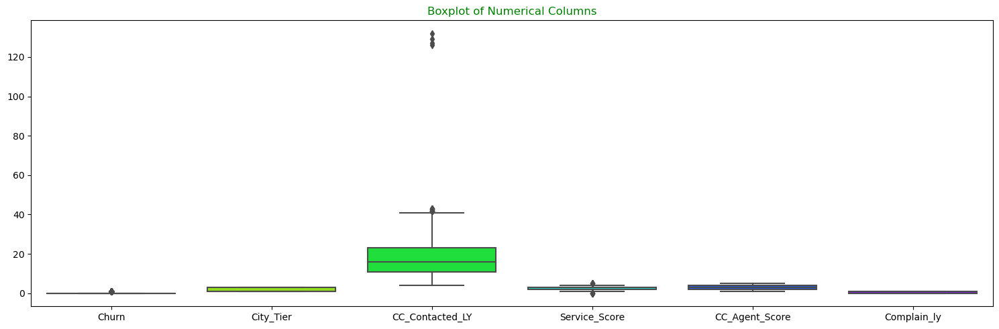

In [13]:
plt.figure(figsize=(15,5))
#churn_df.boxplot()
sns.boxplot(churn_df,palette='gist_rainbow')
plt.title("Boxplot of Numerical Columns",color='green')
plt.tight_layout()

## Checking for Anomalies/Discripencies

**Geting unique counts of all object datatype:**

In [14]:
for feature in churn_df.columns:
    if churn_df[feature].dtype =='object':
        print(feature,"----->")
        print(churn_df[feature].value_counts())
        print("\n")

Tenure ----->
Tenure
1     1351
0     1231
8      519
9      496
7      450
10     423
3      410
5      403
4      403
11     388
6      363
12     360
13     359
2      354
14     345
15     311
16     291
19     273
18     253
20     217
17     215
21     170
23     169
22     151
24     147
28     137
30     137
27     131
99     131
26     122
#      116
25     114
29     114
31      96
50       2
60       2
51       2
61       2
Name: count, dtype: int64


Payment ----->
Payment
Debit Card          4587
Credit Card         3511
E wallet            1217
Cash on Delivery    1014
UPI                  822
Name: count, dtype: int64


Gender ----->
Gender
Male      6328
Female    4178
M          376
F          270
Name: count, dtype: int64


Account_user_count ----->
Account_user_count
4    4569
3    3261
5    1699
2     526
1     446
@     332
6     315
Name: count, dtype: int64


account_segment ----->
account_segment
Super           4062
Regular Plus    3862
HNI             1639
Sup

**Observations**

* Column Tenure contains a Special character '#' as an entry making it an object datatype.
* Column Gender contains four unique values as 'Male','Female','M','F', which needs to be replaced with 'Male' and 'female'.
* Account_user_count also contains special character '@' as one of the entriies.
* Column account_segment contains some Anomalies like 'Regualr plus' and 'Super Plus' is written in two different ways which needs to be corrected.
* Column rev_per_month Contains '+' plus which needs to be replaced.
* Column rev_growth_yoy and Day_Since_CC_connect contains '$' character.

* Column coupon_used_for_payment contains #,$ and * characters.

* Column Login_device Contains &&&& as one of its category.
* We need to inspect the Cashback column for any non-digit character present in it.

In [15]:
col = ['Churn','City_Tier','Service_Score', 'CC_Agent_Score','Complain_ly','CC_Contacted_LY']
for feature in col:
    print(feature,"---->")
    print(churn_df[feature].value_counts())
    print("\n")

Churn ---->
Churn
0    9364
1    1896
Name: count, dtype: int64


City_Tier ---->
City_Tier
1.0    7263
3.0    3405
2.0     480
Name: count, dtype: int64


Service_Score ---->
Service_Score
3.0    5490
2.0    3251
4.0    2331
1.0      77
0.0       8
5.0       5
Name: count, dtype: int64


CC_Agent_Score ---->
CC_Agent_Score
3.0    3360
1.0    2302
5.0    2191
4.0    2127
2.0    1164
Name: count, dtype: int64


Complain_ly ---->
Complain_ly
0.0    7792
1.0    3111
Name: count, dtype: int64


CC_Contacted_LY ---->
CC_Contacted_LY
14.0     682
16.0     663
9.0      655
13.0     655
15.0     623
12.0     571
8.0      538
17.0     525
11.0     524
10.0     489
7.0      391
18.0     374
19.0     364
20.0     319
6.0      311
21.0     310
22.0     282
23.0     241
24.0     214
25.0     197
32.0     192
29.0     181
28.0     178
34.0     178
30.0     175
27.0     174
26.0     169
35.0     165
31.0     165
33.0     155
36.0     148
37.0      96
38.0      73
39.0      55
40.0      46
42.0      3

In [16]:
#Check if the Cashback column contains anything other than digits 
# run the "isdigit() check on 'Cashback' column of the churn_df dataframe. Result will be True or False for every row


temp = pd.DataFrame(churn_df.cashback.str.isdigit())  # if the string is made of digits store True else False  in the hp column 
# in temp dataframe
#churn_df.cashback[churn_df.cashback.str.isdigit()]
temp[temp['cashback'] == False]   # from temp take only those rows where hp has false


,cashback
440,False
1257,False


In [17]:
churn_df.iloc[[440,1257]]

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
440,0,0,1.0,16.0,Credit Card,Male,3.0,2,Regular Plus,3.0,Single,2,0.0,18,1,2,$,Mobile
1257,0,4,1.0,9.0,Credit Card,Male,2.0,3,Regular +,5.0,Married,+,NaN,13,0,3,$,Computer


* We saw that Cashback column contains special character '$' due to which it is considered as 'object' datatype column.


In [18]:
churn_df['Gender'].value_counts()

Gender
Male      6328
Female    4178
M          376
F          270
Name: count, dtype: int64

**Let's Remove the Discrepancies present in the data**

In [19]:
churn_df['Gender'] = churn_df['Gender'].replace({'M':'Male','F':'Female'})
churn_df['account_segment'] = churn_df['account_segment'].replace({'Regular +':'Regular Plus','Super +':'Super Plus'})

**Let's Replace the Special characters with Nan Values**

*  #, $, @, +, *,

In [20]:
churn_df = churn_df.replace({'#':np.nan,'$':np.nan,'@':np.nan,'+':np.nan,'*':np.nan})

In [21]:
churn_df.head(2)

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,1,4.0,3.0,6.0,Debit Card,Female,3.0,3.0,Super,2.0,Single,9.0,1.0,11.0,1.0,5.0,159.93,Mobile
1,1,0.0,1.0,8.0,UPI,Male,3.0,4.0,Regular Plus,3.0,Single,7.0,1.0,15.0,0.0,0.0,120.90,Mobile


In [22]:
cols= ['Tenure','Account_user_count','rev_per_month','rev_growth_yoy','Day_Since_CC_connect','coupon_used_for_payment','cashback','Login_device']
for feature in cols:
    print(feature,"---->")
    print(churn_df[feature].value_counts())
    print("\n")

Tenure ---->
Tenure
1.0     1351
0.0     1231
8.0      519
9.0      496
7.0      450
10.0     423
3.0      410
5.0      403
4.0      403
11.0     388
6.0      363
12.0     360
13.0     359
2.0      354
14.0     345
15.0     311
16.0     291
19.0     273
18.0     253
20.0     217
17.0     215
21.0     170
23.0     169
22.0     151
24.0     147
30.0     137
28.0     137
99.0     131
27.0     131
26.0     122
25.0     114
29.0     114
31.0      96
50.0       2
60.0       2
51.0       2
61.0       2
Name: count, dtype: int64


Account_user_count ---->
Account_user_count
4.0    4569
3.0    3261
5.0    1699
2.0     526
1.0     446
6.0     315
Name: count, dtype: int64


rev_per_month ---->
rev_per_month
3.0      1746
2.0      1585
5.0      1337
4.0      1218
6.0      1085
7.0       754
8.0       643
9.0       564
10.0      413
1.0       402
11.0      278
12.0      166
13.0       93
14.0       48
15.0       24
102.0       8
124.0       5
107.0       5
123.0       5
140.0       4
118.0       4

In [23]:
# Checkung Cashback Column
churn_df.iloc[[440,1257]]

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
440,0,0.0,1.0,16.0,Credit Card,Male,3.0,2.0,Regular Plus,3.0,Single,2.0,0.0,18.0,1.0,2.0,NaN,Mobile
1257,0,4.0,1.0,9.0,Credit Card,Male,2.0,3.0,Regular Plus,5.0,Married,NaN,NaN,13.0,0.0,3.0,NaN,Computer


In [24]:
churn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Churn                    11260 non-null  int64  
 1   Tenure                   11042 non-null  float64
 2   City_Tier                11148 non-null  float64
 3   CC_Contacted_LY          11158 non-null  float64
 4   Payment                  11151 non-null  object 
 5   Gender                   11152 non-null  object 
 6   Service_Score            11162 non-null  float64
 7   Account_user_count       10816 non-null  float64
 8   account_segment          11163 non-null  object 
 9   CC_Agent_Score           11144 non-null  float64
 10  Marital_Status           11048 non-null  object 
 11  rev_per_month            10469 non-null  float64
 12  Complain_ly              10903 non-null  float64
 13  rev_growth_yoy           11257 non-null  float64
 14  coupon_used_for_paymen

**Let's replace the Category '&&&&' to the Mode of the column in Column Login_device**

In [25]:
churn_df['Login_device'].mode()

0    Mobile
Name: Login_device, dtype: object

In [26]:
# Replacing with Mode value

churn_df['Login_device'] = churn_df['Login_device'].replace('&&&&','Mobile')

In [27]:
churn_df['Login_device'].value_counts()

Login_device
Mobile      8021
Computer    3018
Name: count, dtype: int64

In [28]:
churn_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Churn,11260.0,0.168384,0.374223,0.0,0.00,0.00,0.00,1.0
Tenure,11042.0,11.025086,12.879782,0.0,2.00,9.00,16.00,99.0
City_Tier,11148.0,1.653929,0.915015,1.0,1.00,1.00,3.00,3.0
CC_Contacted_LY,11158.0,17.867091,8.853269,4.0,11.00,16.00,23.00,132.0
Service_Score,11162.0,2.902526,0.725584,0.0,2.00,3.00,3.00,5.0
Account_user_count,10816.0,3.692862,1.022976,1.0,3.00,4.00,4.00,6.0
CC_Agent_Score,11144.0,3.066493,1.379772,1.0,2.00,3.00,4.00,5.0
rev_per_month,10469.0,6.362594,11.909686,1.0,3.00,5.00,7.00,140.0
Complain_ly,10903.0,0.285334,0.451594,0.0,0.00,0.00,1.00,1.0
rev_growth_yoy,11257.0,16.193391,3.757721,4.0,13.00,15.00,19.00,28.0


In [29]:
# kest check kurtosis and skewness of data
#print("kurtosis and skewness of dataste is as below")
#pd.DataFrame(data = [churn_df.kurtosis(), churn_df.skew()], index=['Kurtosis','Skewness']).T.round(2)

**Missing Values**

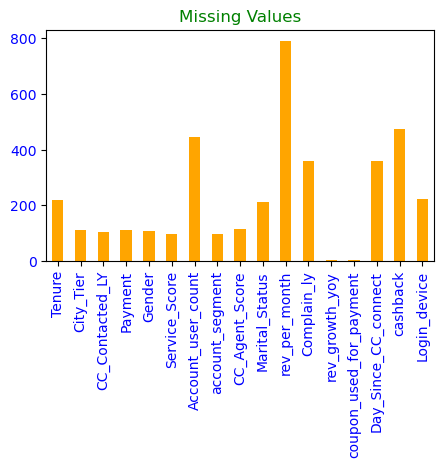

In [30]:
plt.figure(figsize=(5,3))
#churn_df.isnull().sum().plot(kind='bar',color='orange')
churn_df.isnull().sum()[churn_df.isna().sum()>0].plot(kind='bar',color='orange')
plt.title("Missing Values",color='green')
plt.xticks(color='blue')
plt.yticks(color='blue')
plt.show()

In [31]:
churn_df.head(2)

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,1,4.0,3.0,6.0,Debit Card,Female,3.0,3.0,Super,2.0,Single,9.0,1.0,11.0,1.0,5.0,159.93,Mobile
1,1,0.0,1.0,8.0,UPI,Male,3.0,4.0,Regular Plus,3.0,Single,7.0,1.0,15.0,0.0,0.0,120.90,Mobile


**Checking for Outliers**

In [32]:
feature = churn_df.drop('Churn',axis=1).describe().columns
feature

Index(['Tenure', 'City_Tier', 'CC_Contacted_LY', 'Service_Score',
       'Account_user_count', 'CC_Agent_Score', 'rev_per_month', 'Complain_ly',
       'rev_growth_yoy', 'coupon_used_for_payment', 'Day_Since_CC_connect',
       'cashback'],
      dtype='object')

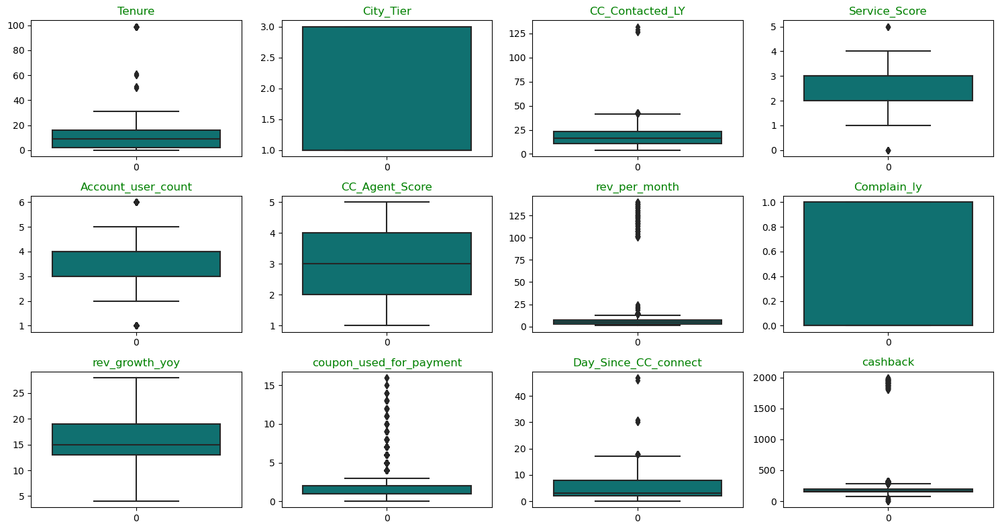

In [33]:
#cols = ['Tenure','CC_Contacted_LY','rev_per_month','rev_growth_yoy','coupon_used_for_payment','Day_Since_CC_connect','cashback']
#feature = churn_df.drop('Churn',axis=1).describe().columns
fig=plt.figure(figsize=(15,8))
for i in range(0,len(feature)):
    plt.subplot(3,4,i+1)
    #sns.boxplot(churn_df[cols[i]],color='orange')
    sns.boxplot(churn_df[feature[i]],color='teal')
    plt.title(feature[i],color='green')
    #plt.title(cols[i],color='green')
fig.tight_layout()
plt.show()
#plt.figure(figsize=(20,5))
#sns.boxplot(churn_df)
#plt.show()

## Univariate Analysis

### Countplot of all Categorical Columns

In [34]:
cat_col = churn_df.select_dtypes(['object']).columns
cat_col

Index(['Payment', 'Gender', 'account_segment', 'Marital_Status',
       'Login_device'],
      dtype='object')

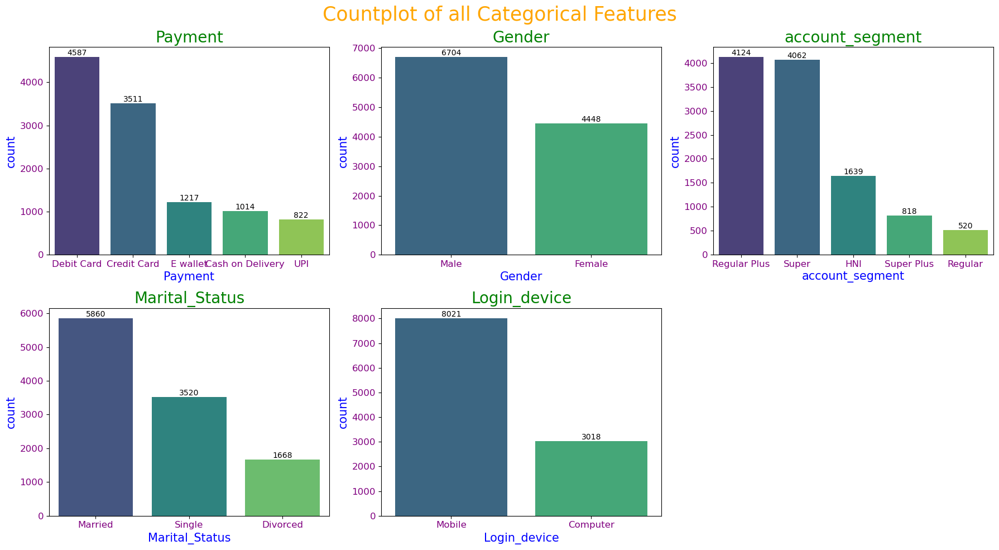

In [36]:
fig = plt.figure(figsize=(18,10))
plt.suptitle('Countplot of all Categorical Features', fontsize = 25,color='orange')
for i in range(0,len(cat_col)):    
    plt.subplot(2,3,i+1)
    ax=sns.countplot(x=churn_df[cat_col[i]],data=churn_df,order=churn_df[cat_col[i]].value_counts().index,palette='viridis')
    for bars in ax.containers:
        ax.bar_label(bars)
    plt.title("{}".format(cat_col[i]),color='green',fontsize=20)
    plt.xlabel(cat_col[i],color='blue',fontsize=15)
    plt.ylabel("count",fontsize=15,color='blue')
    plt.xticks(color='purple',fontsize=12)
    plt.yticks(color='purple',fontsize=12);
fig.tight_layout() 
plt.show()

**Insights**

* Most Customers Preferred Payment mode are Debit card and Credit Card.
* Very few customers make payment through UPI.
* Male customers are more as compared to female.
* There are more customers that belong to account_segment Regular plus and Super.
* Very less customers belongs to Regular segment on the basis of their spend.
* Married customers are more in number as compared to Singles and Divored.
* Maximum of the customers prefers to Login Via Mobile as it is convinient to carry and they can Login from any Location.
* Very less customers Login via Computer.

In [37]:
churn_df.head(2)

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,1,4.0,3.0,6.0,Debit Card,Female,3.0,3.0,Super,2.0,Single,9.0,1.0,11.0,1.0,5.0,159.93,Mobile
1,1,0.0,1.0,8.0,UPI,Male,3.0,4.0,Regular Plus,3.0,Single,7.0,1.0,15.0,0.0,0.0,120.90,Mobile


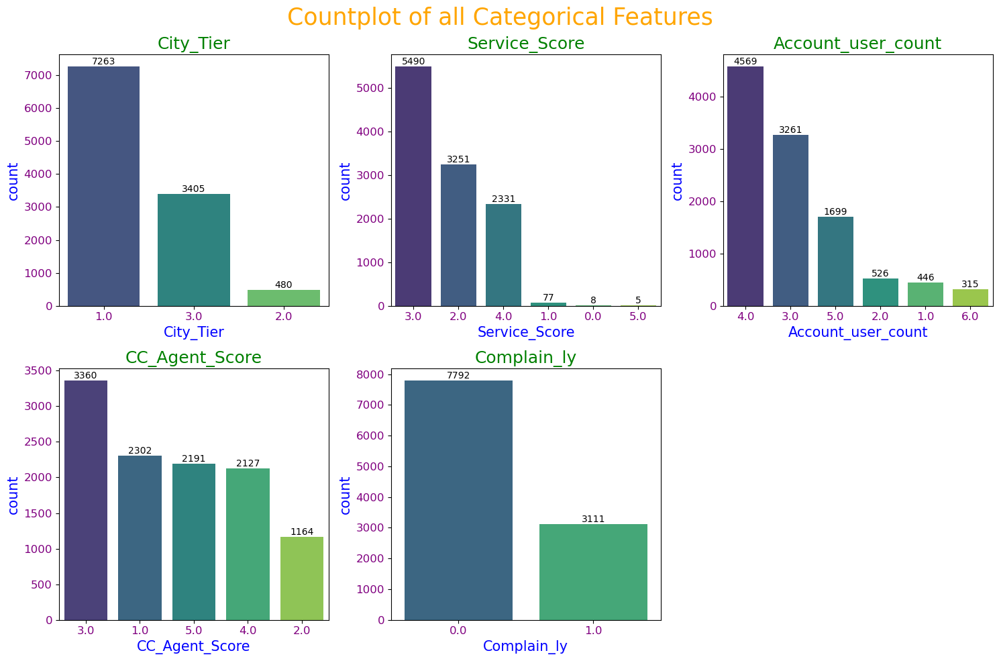

In [39]:
cat_int_col = ['City_Tier','Service_Score','Account_user_count','CC_Agent_Score','Complain_ly']
fig = plt.figure(figsize=(15,10))
plt.suptitle('Countplot of all Categorical Features', fontsize = 25,color='orange')
for i in range(0,len(cat_int_col)):    
    plt.subplot(2,3,i+1)
    ax=sns.countplot(x=churn_df[cat_int_col[i]],data=churn_df,order=churn_df[cat_int_col[i]].value_counts().index,palette='viridis')
    for bars in ax.containers:
        ax.bar_label(bars)
    plt.title("{}".format(cat_int_col[i]),color='green',fontsize=18)
    plt.xlabel(cat_int_col[i],color='blue',fontsize=15)
    plt.ylabel("count",fontsize=15,color='blue')
    plt.xticks(color='purple',fontsize=12)
    plt.yticks(color='purple',fontsize=12);
fig.tight_layout() 
plt.show()

**Insights**

* Maximum customers belongs to Tier-1 cities followed by Tier-3 cities and very few belongs to Tier-2 cities.
* Service score given by Maximum customers is 3,which states that customers are not fully satisfied by the service provided by   the company.
* More numbers of Accounts are linked with 4 members,followed by 3 and 5 members per Account.
* Very few accounts are linked with 1,2 and 6 Members.
* Satisfaction score given by customers on an Average is 3 for Customer Care Services.
* Also Excellent Score of 4 and 5 for Customer care services are almost equal in number.So there Satisfied customers too.
* It seems very less Complaint has been Raised by the customers in last 12 months.

**Distribution of Target Variable**

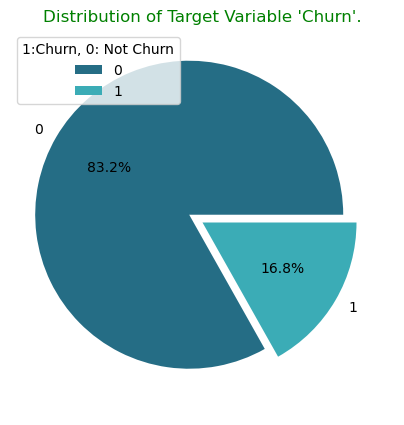

In [40]:
plt.figure(figsize=(5,5))
label = churn_df['Churn'].value_counts().keys()
plt.pie(data=churn_df,x=churn_df["Churn"].value_counts(),labels=label,autopct="%.1f%%",explode=[0.1, 0],colors= ['#256D85', '#3BACB6'])
plt.title("Distribution of Target Variable 'Churn'.",color='green')
#print("Here 5 stands for High Score and 1 for Poor Score")
plt.legend(title = "1:Churn, 0: Not Churn",loc='upper left')     # loc='upper left'

plt.show()

**Insights**

* 16.8% of the customers have churned whereas 83.2% of the customers have not churned.
* seems Imbalance in Target class.

In [41]:
#checking if the data is balanced or not
churn_df.groupby(["Churn"]).count()

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
Churn,,,,,,,,,,,,,,,,,
0,9194,9269,9280,9277,9278,9282,8986,9285,9270,9184,8694,9065,9361,9361,9070,8976,9185
1,1848,1879,1878,1874,1874,1880,1830,1878,1874,1864,1775,1838,1896,1896,1832,1811,1854


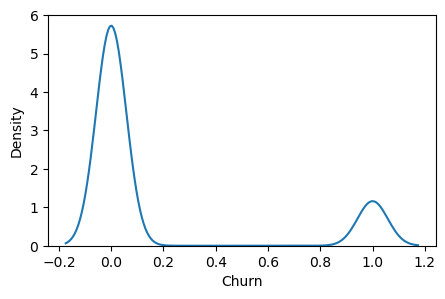

In [42]:
# checking if data is balanced
plt.figure(figsize=(5,3))
sns.kdeplot(data=churn_df, x="Churn")
plt.show()

### Histogram  and Boxplot of all continuous variables

In [43]:
churn_df.head(2)

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,1,4.0,3.0,6.0,Debit Card,Female,3.0,3.0,Super,2.0,Single,9.0,1.0,11.0,1.0,5.0,159.93,Mobile
1,1,0.0,1.0,8.0,UPI,Male,3.0,4.0,Regular Plus,3.0,Single,7.0,1.0,15.0,0.0,0.0,120.90,Mobile


In [44]:
num_cols = ['Tenure','CC_Contacted_LY','rev_per_month','rev_growth_yoy','coupon_used_for_payment','Day_Since_CC_connect','cashback']
num_cols

['Tenure',
 'CC_Contacted_LY',
 'rev_per_month',
 'rev_growth_yoy',
 'coupon_used_for_payment',
 'Day_Since_CC_connect',
 'cashback']

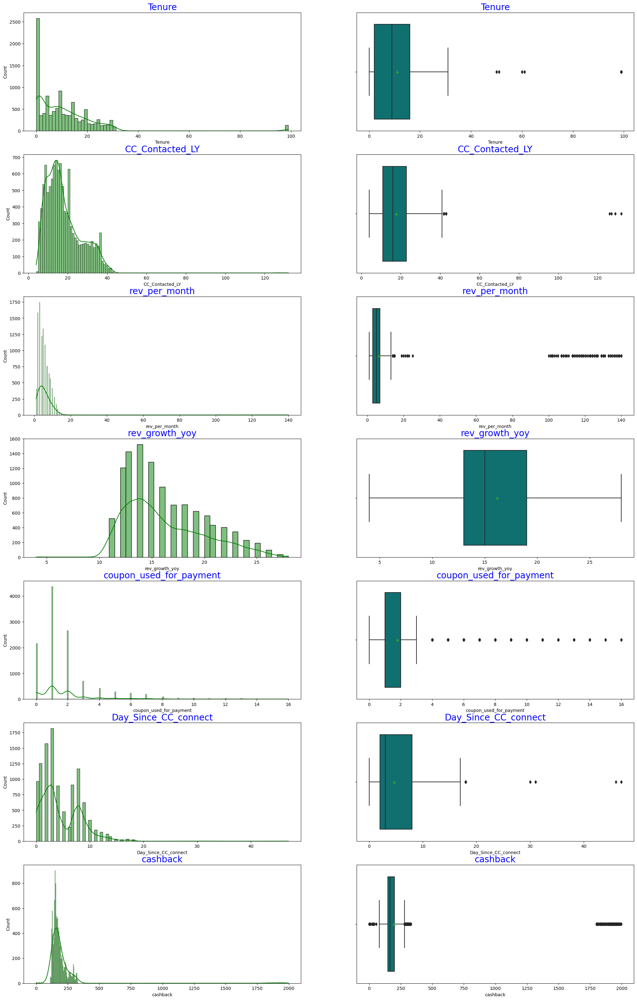

In [45]:
fig, ax = plt.subplots(nrows=7,ncols=2)
fig.set_size_inches(25,40)
# plt.suptitle('Histogram & Boxplot of all Continuous Features', fontsize = 25,color='orange')
ax1=sns.histplot(data=churn_df,x='Tenure',kde=True,ax=ax[0][0],color='green')
ax1.set_title("Tenure",fontsize=20,color='blue')
ax2=sns.boxplot(data=churn_df,x='Tenure',showmeans=True,ax=ax[0][1],color='teal')
ax2.set_title("Tenure",fontsize=20,color='blue')
ax3=sns.histplot(data=churn_df,x='CC_Contacted_LY',kde=True,ax=ax[1][0],color='green')
ax3.set_title("CC_Contacted_LY",fontsize=20,color='blue')
ax4=sns.boxplot(data=churn_df,x='CC_Contacted_LY',showmeans=True,ax=ax[1][1],color='teal')
ax4.set_title("CC_Contacted_LY",fontsize=20,color='blue')
ax5=sns.histplot(data=churn_df,x='rev_per_month',kde=True,ax=ax[2][0],color='green')
ax5.set_title("rev_per_month",fontsize=20,color='blue')
ax6=sns.boxplot(data=churn_df,x='rev_per_month',showmeans=True,ax=ax[2][1],color='teal')
ax6.set_title("rev_per_month",fontsize=20,color='blue')
ax7=sns.histplot(data=churn_df,x='rev_growth_yoy',kde=True,ax=ax[3][0],color='green')
ax7.set_title("rev_growth_yoy",fontsize=20,color='blue')
ax8=sns.boxplot(data=churn_df,x='rev_growth_yoy',showmeans=True,ax=ax[3][1],color='teal')
ax8.set_title("rev_growth_yoy",fontsize=20,color='blue')
ax9=sns.histplot(data=churn_df,x='coupon_used_for_payment',kde=True,ax=ax[4][0],color='green')
ax9.set_title("coupon_used_for_payment",fontsize=20,color='blue')
ax10=sns.boxplot(data=churn_df,x='coupon_used_for_payment',showmeans=True,ax=ax[4][1],color='teal')
ax10.set_title("coupon_used_for_payment",fontsize=20,color='blue')
ax11=sns.histplot(data=churn_df,x='Day_Since_CC_connect',kde=True,ax=ax[5][0],color='green')
ax11.set_title("Day_Since_CC_connect",fontsize=20,color='blue')
ax12=sns.boxplot(data=churn_df,x='Day_Since_CC_connect',showmeans=True,ax=ax[5][1],color='teal')
ax12.set_title("Day_Since_CC_connect",fontsize=20,color='blue')
ax13=sns.histplot(data=churn_df,x='cashback',kde=True,ax=ax[6][0],color='green')
ax13.set_title("cashback",fontsize=20,color='blue')
ax14=sns.boxplot(data=churn_df,x='cashback',showmeans=True,ax=ax[6][1],color='teal')
ax14.set_title("cashback",fontsize=20,color='blue')
plt.show()

**Insights**

* All the Variables are Right Skewed showing the presence of Outliers.
* Maximum customers have a Tenure of less than a month.
* There are also some customers having a Tenure of more than 50 months,Max upto 100 months.
* Maximum number of customers have contacted Customer care 11 to 23 times in last 12 months.
* The Median of the Monthly average revenue generated by the company is around 10k(Assuming the Currency is in Thousands).
* Also, this feature is highly Right Skewed showing monthly avg revenue generated by the company more than 100k.
* There is an Approx 16% growth in revenue on an average, generated by the account in the last year compared to the previous years.
* On an Average, 2 times coupons were used to do the payment.
* Also, it seems some customers used the coupons more than 4 times to max 16 times.
* Avg no of days since customers have not contacted CC is around 5 days.
* On av Average, Cashback generated by the customers is around Rs 200/- in the last 12 months.
* Also, some customers generated cashback of more than Rs 1750/- monthly.

**Visualizing Tenure**

<Axes: xlabel='Tenure', ylabel='Count'>

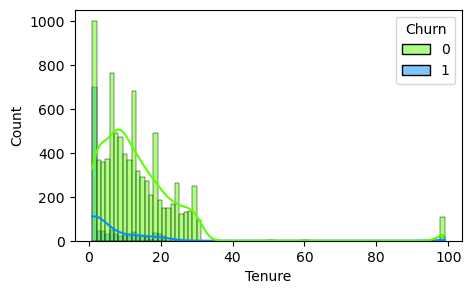

In [46]:
plt.figure(figsize=(5,3))
sns.histplot(data = churn_df[churn_df['Tenure']>0.5],x = 'Tenure',hue = 'Churn',kde=True,palette='gist_rainbow')

**Insights**

* Customers having a Tenure of less than 15 months,Churns more.
* There are some Loyal Customers having Tenure of more than 80 months.
* Distribution seems Overlapping.

## Bivariate Analysis

**Boxplot of all Numerical Variables Vs Target Variable**

In [47]:
num_cols

['Tenure',
 'CC_Contacted_LY',
 'rev_per_month',
 'rev_growth_yoy',
 'coupon_used_for_payment',
 'Day_Since_CC_connect',
 'cashback']

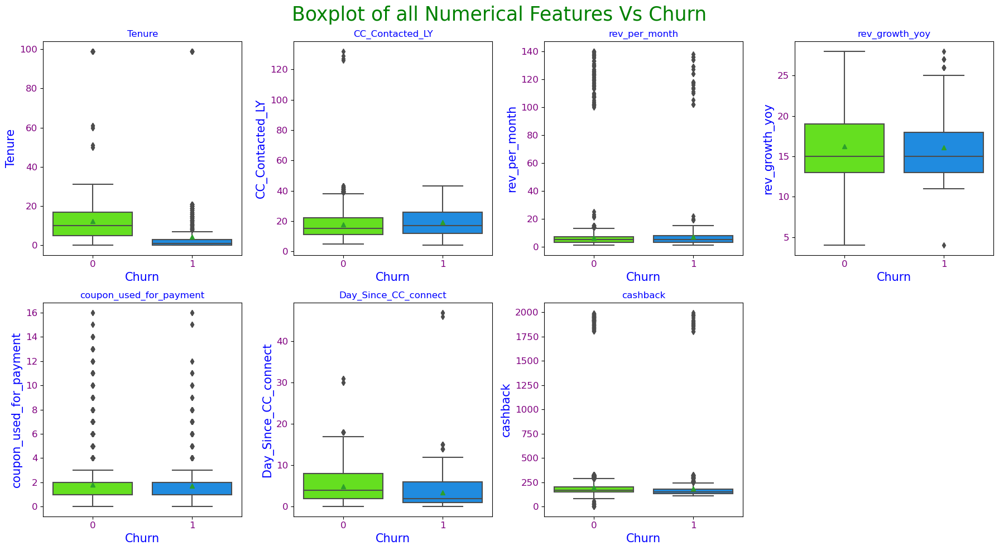

In [48]:
fig=plt.figure(figsize=(18,10))
plt.suptitle('Boxplot of all Numerical Features Vs Churn', fontsize = 25,color='green')
for i in range(0,len(num_cols)):
   ax=fig.add_subplot(2,4,i+1)
   sns.boxplot(y=churn_df[num_cols[i]], x=churn_df['Churn'],palette='gist_rainbow',showmeans = True)
   ax.set_title(num_cols[i],color='blue')
   ax.set_xlabel("Churn",fontsize=15,color='blue')
   ax.set_ylabel(num_cols[i],fontsize=15,color='blue')
   plt.xticks(color='purple',fontsize=12)
   plt.yticks(color='purple',fontsize=12)

fig.tight_layout()
plt.show();

**Insights**

* It seems that when the customers contact the Customers care more their queries gets resolved due to which they don't churn and keep using the services more hence reducing the Churn rate.
* So we can say Customer Care is also playing an Important role in Retaining Customers.
* We see that median value of the Tenure and Days_since_CC_connect for Churners is less compared to that of non-Churners.
* The Distribution of Coupon_used_for_payment, Cashback and rev_per_month is same for both Churners and Non-churners.
* There is no difference in median rev_growth_yoy between churners and non churners.

**Countplot of all Categorical Variables Vs Target Variables**

In [49]:
cat_col

Index(['Payment', 'Gender', 'account_segment', 'Marital_Status',
       'Login_device'],
      dtype='object')

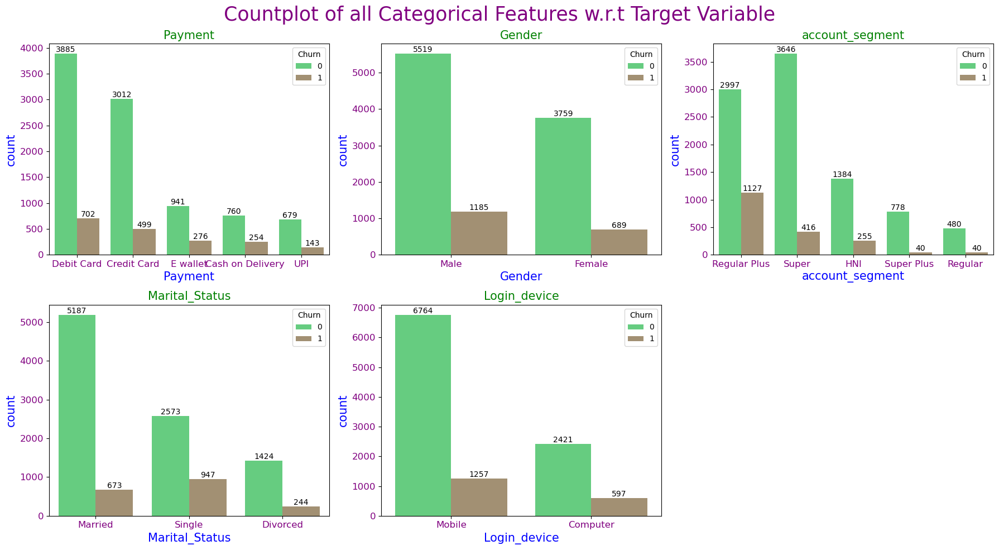

In [54]:
fig=plt.figure(figsize=(18,10))
plt.suptitle('Countplot of all Categorical Features w.r.t Target Variable', fontsize = 25,color='purple')

for i in range(0,len(cat_col)):    
    plt.subplot(2,3,i+1)
    ax=sns.countplot(x=churn_df[cat_col[i]],data=churn_df,order=churn_df[cat_col[i]].value_counts().index,hue='Churn',palette='terrain')
    for bars in ax.containers:
        ax.bar_label(bars)
    plt.title("{}".format(cat_col[i]),color='green',fontsize=15)
    plt.xlabel(cat_col[i],color='blue',fontsize=15)
    plt.ylabel("count",fontsize=15,color='blue')
    plt.xticks(color='purple',fontsize=12)
    plt.yticks(color='purple',fontsize=12);
plt.tight_layout()     
plt.show()

**Insights**

* The proportions of Churners is more of Male customers as compared to Female.
* Most of the churners make payment via Debit Card.
* Non-churners preferrable mode of payment are Debit cards and Credit Cards.
* Most of the churners belongs to Regular plus and Super account segment.
* Maximum Non-Churners belongs to Super Segment followed by Regular plus.
* Most of the churners are single.
* Non-Churners are Maximum Married Couples.
* Most Preferred Login Device for both Churners and Non-Churners is Mobile since it's handy.

In [52]:
cat_int_col

['City_Tier',
 'Service_Score',
 'Account_user_count',
 'CC_Agent_Score',
 'Complain_ly']

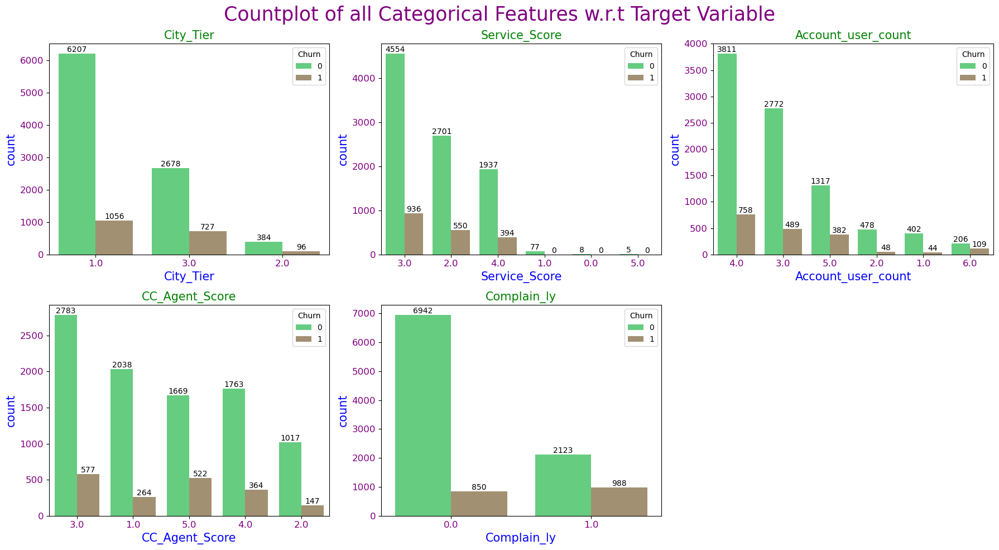

In [53]:
fig=plt.figure(figsize=(18,10))
plt.suptitle('Countplot of all Categorical Features w.r.t Target Variable', fontsize = 25,color='purple')

for i in range(0,len(cat_int_col)):    
    plt.subplot(2,3,i+1)
    ax=sns.countplot(x=churn_df[cat_int_col[i]],data=churn_df,order=churn_df[cat_int_col[i]].value_counts().index,hue='Churn',palette='terrain')
    for bars in ax.containers:
        ax.bar_label(bars)
    plt.title("{}".format(cat_int_col[i]),color='green',fontsize=15)
    plt.xlabel(cat_int_col[i],color='blue',fontsize=15)
    plt.ylabel("count",fontsize=15,color='blue')
    plt.xticks(color='purple',fontsize=12)
    plt.yticks(color='purple',fontsize=12);
plt.tight_layout()     
plt.show()

**Insights**

* Maximum Non-churners belongs to City Tier-1 followed by Tier-3.
* Churning rate of Customers from Tier-2 is very less, means customers tends continue the services seems they are more satisfied.
* Most of the Churners are from Tier-1.
* Maximum Service score given by customers is 3 by both churners and Non-churners.
* Account tagged with 3,4 and 5 customers have more churning rate.
* Customers tagged with 2,1 and 6 accounts are mostly Non-churners.
* Customers who have given an agent score of 3 and above show the Maximum churn rate.
* Maximum Non-churners have given a Agent score of 3 and 1.
* Very few Churners have raised the complaints in the last 12 months.If they would have raised the complaint then may be their queries would have been resolved and they would not churn.
* It is evident from the fact that Customers who have raised the complaint maximum no of times are mostly Non-churners. This shows that raising complaint have solved their issue and hence made them retain the use of service and decreasing churn Rate.


In [55]:
pd.crosstab(churn_df['Churn'],churn_df['City_Tier'],normalize=True)

City_Tier,1.0,2.0,3.0
Churn,,,
0,0.556781,0.034446,0.240222
1,0.094726,0.008611,0.065213


**Checking separation across the numerical variables**

In [56]:
num_cols

['Tenure',
 'CC_Contacted_LY',
 'rev_per_month',
 'rev_growth_yoy',
 'coupon_used_for_payment',
 'Day_Since_CC_connect',
 'cashback']

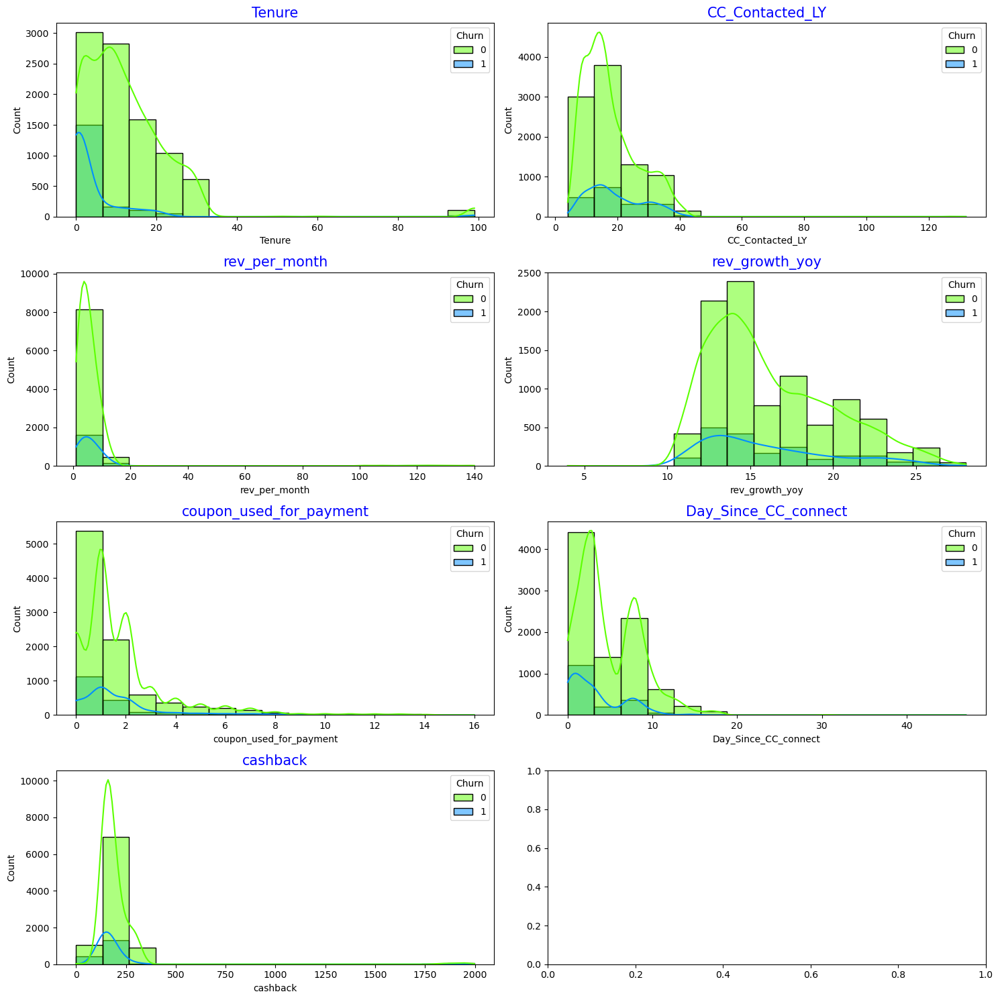

In [57]:
fig,axes = plt.subplots(4,2,figsize=(15,15))
plt.subplots_adjust(hspace=0.2)
for i,j in zip(num_cols,axes.flatten()):
    axes=sns.histplot(data = churn_df,x = i,ax=j,hue='Churn',kde=True, bins=15, palette='gist_rainbow')
    axes.set_title(i,color='blue',fontsize=15)
fig.tight_layout()
plt.show()

**Insights**

* Most of the Distributions are Right Skewed.
* Customers having Short-term Tenure churns more.
* There are some Loyal customers also having Tenure more than 80 months.
* Maximum number of times Customer care was contacted is between 4 to 23 times.
* maximum customers use 1-2 coupons for payment.
* Most of the cashback are generated is around 0 to 300.
* Maximum cashbacks are generated by non-churners.

**Scatterplot of All Numerical Columns against Target Column**

In [58]:
num_cols

['Tenure',
 'CC_Contacted_LY',
 'rev_per_month',
 'rev_growth_yoy',
 'coupon_used_for_payment',
 'Day_Since_CC_connect',
 'cashback']

In [59]:
scater_df = pd.concat([churn_df[num_cols],churn_df['Churn']],axis=1)
scater_df.head(2)

,Tenure,CC_Contacted_LY,rev_per_month,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Churn
0,4.0,6.0,9.0,11.0,1.0,5.0,159.93,1
1,0.0,8.0,7.0,15.0,0.0,0.0,120.90,1


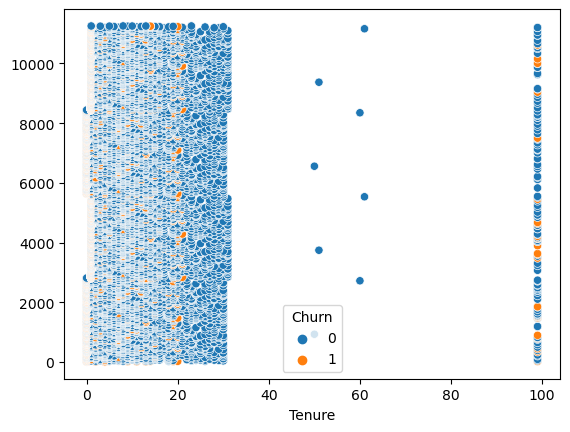

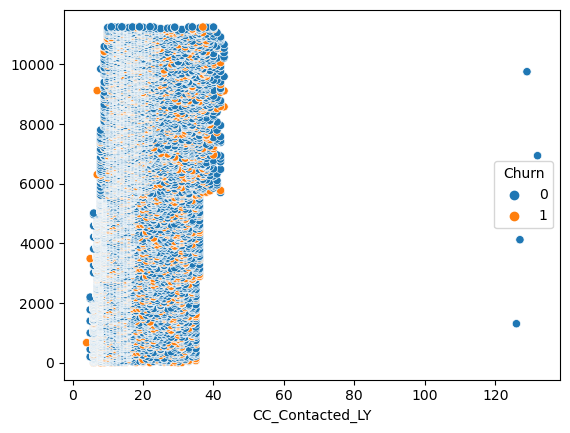

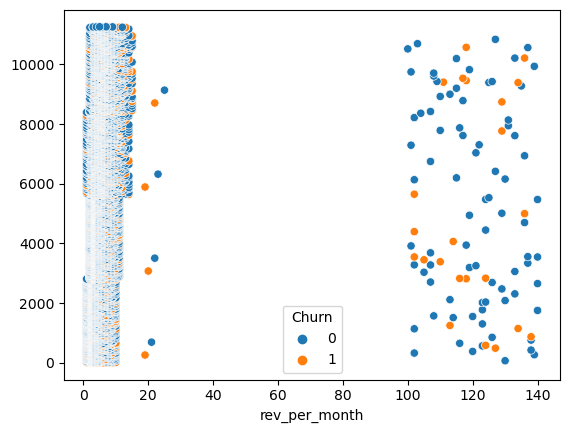

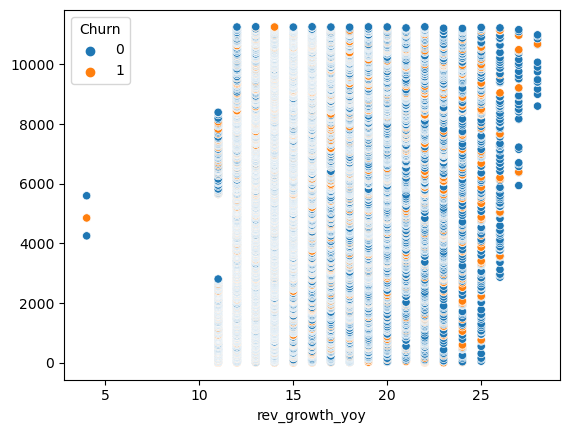

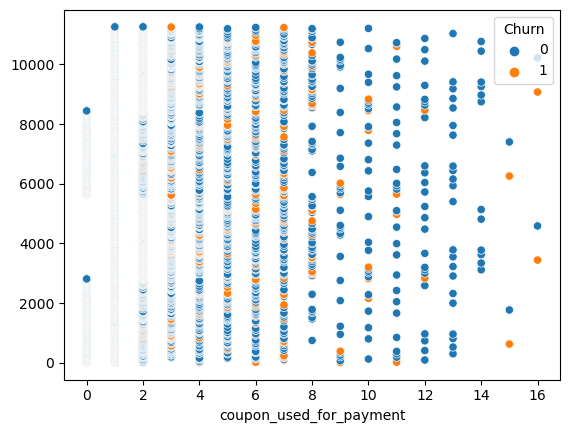

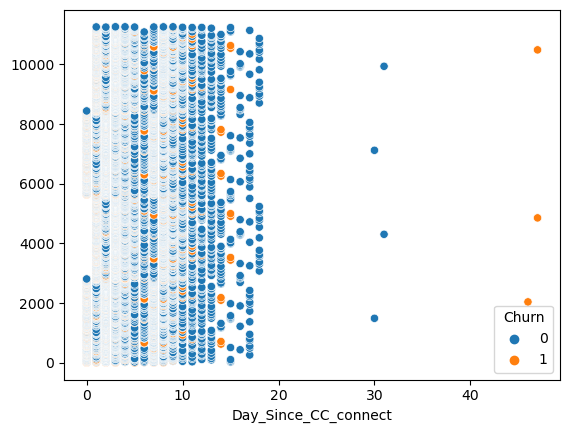

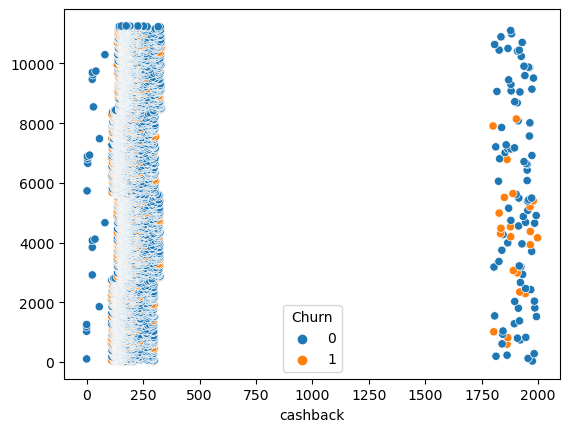

In [60]:
#scatter plot with hue based on default
# splot_cols=df4.columns
for i in scater_df.drop('Churn',axis=1).columns:
    sns.scatterplot(y=scater_df.index, x=scater_df[i], hue=scater_df['Churn'])
    plt.show()

#### Scatterplots

<Figure size 500x300 with 0 Axes>

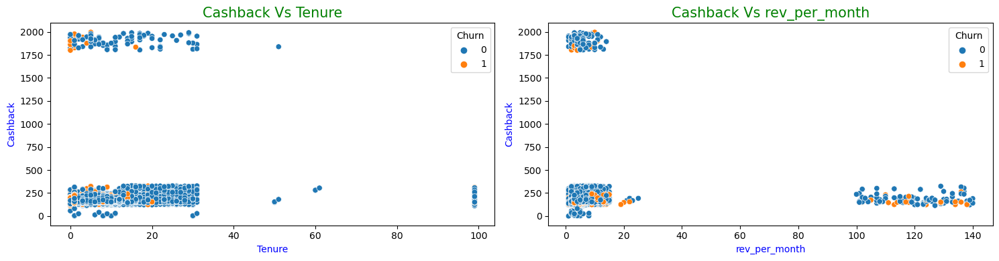

In [61]:
plt.figure(figsize=(5,3))
fig, axes = plt.subplots(1,2)
fig.set_size_inches(15,4)
ax=sns.scatterplot(x='Tenure',y='cashback',data=churn_df,ax=axes[0],hue='Churn')
ax.set_title("Cashback Vs Tenure",color='green',fontsize=15)
ax.set_xlabel("Tenure",color='blue')
ax.set_ylabel("Cashback",color='blue')
ax1 = sns.scatterplot(x='rev_per_month',y='cashback',hue='Churn',data=churn_df,ax=axes[1])
ax1.set_title("Cashback Vs rev_per_month",color='green',fontsize=15)
ax1.set_xlabel("rev_per_month",color='blue')
ax1.set_ylabel("Cashback",color='blue')
plt.tight_layout()
plt.show()

**Insights**

* Most of the Cashback are for Tenure less than 35 months.
* Cashback Ranges between 0-280 and 1750-2000.
* Cashback of more than 1750 is mostly enjoyed by non-churners.

**Correlation Matrix**

In [62]:
corr = churn_df.corr(numeric_only=True)
corr

,Churn,Tenure,City_Tier,CC_Contacted_LY,Service_Score,Account_user_count,CC_Agent_Score,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback
Churn,1.000000,-0.233150,0.084135,0.072071,0.008991,0.107292,0.105796,0.022538,0.251488,-0.013877,-0.014826,-0.147956,-0.032382
Tenure,-0.233150,1.000000,-0.030223,-0.004261,0.009608,-0.004052,-0.020031,0.028431,-0.021419,0.018824,0.089171,0.122612,0.078416
City_Tier,0.084135,-0.030223,1.000000,0.011835,-0.006443,0.025498,-0.011479,-0.028521,0.002478,-0.030025,0.021124,0.023158,0.010516
CC_Contacted_LY,0.072071,-0.004261,0.011835,1.000000,0.060052,0.020351,-0.000209,0.015675,0.027244,0.072913,0.004969,0.012938,0.002679
Service_Score,0.008991,0.009608,-0.006443,0.060052,1.000000,0.323327,0.032135,0.026691,0.002643,0.103374,0.181914,0.099770,0.042961
Account_user_count,0.107292,-0.004052,0.025498,0.020351,0.323327,1.000000,-0.017522,0.020600,0.003411,0.067616,0.146081,0.037573,0.037057
CC_Agent_Score,0.105796,-0.020031,-0.011479,-0.000209,0.032135,-0.017522,1.000000,0.022167,-0.031459,-0.027159,0.030661,0.030808,-0.012599
rev_per_month,0.022538,0.028431,-0.028521,0.015675,0.026691,0.020600,0.022167,1.000000,-0.002262,0.024114,0.016548,-0.000923,0.002974
Complain_ly,0.251488,-0.021419,0.002478,0.027244,0.002643,0.003411,-0.031459,-0.002262,1.000000,-0.005122,-0.007023,-0.041111,0.008734
rev_growth_yoy,-0.013877,0.018824,-0.030025,0.072913,0.103374,0.067616,-0.027159,0.024114,-0.005122,1.000000,0.018341,0.002206,-0.001157


**HeatMap**

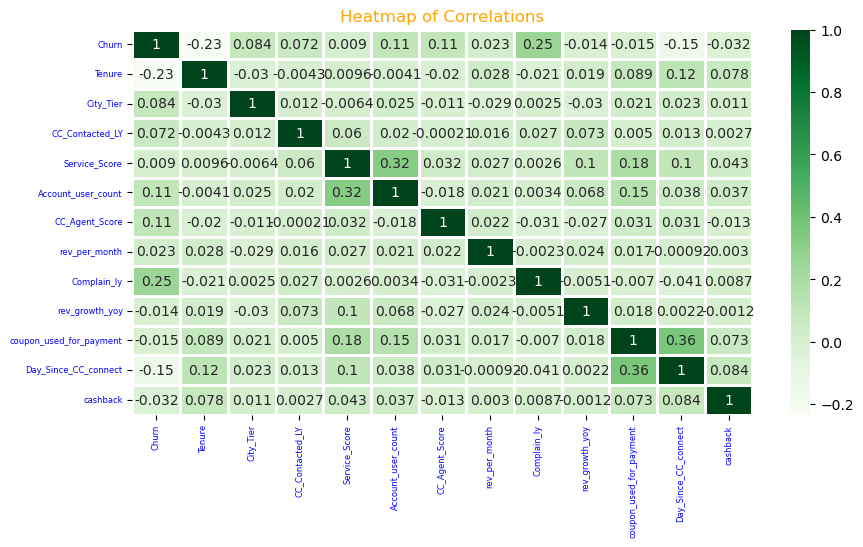

In [63]:
plt.figure(figsize=(10,5))
sns.heatmap(corr, annot=True,cmap = 'Greens',linewidths=0.8,linecolor='white',)
plt.title("Heatmap of Correlations",color='orange')
plt.xticks(rotation=90,color='blue',fontsize=6)
plt.yticks(color='blue',fontsize=6);
plt.show()

**Insights**

* Churn is negatively correlated with Tenure,having a correlation of -23%.
* The smaller the tenure value, the greater the churn rate.
* Correlation between Churn and Complain_ly is around 25%. The greater the complaint rate, the greater the churn rate.
* Service score has 32% correlation with Account user count and 18% correlation with Coupon used for payment.
* Coupon used for payment has 36% correlation with Days since CC connect, 18% with Service score and 15% with Account user       count.
* There are no such features that are Highly Correlated with each other.
* There is no strong positive and Negative Correlations between the Predictors.
* There seems no Multicollinearity present in the data.

**Pairplot**

C:\Users\USER\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


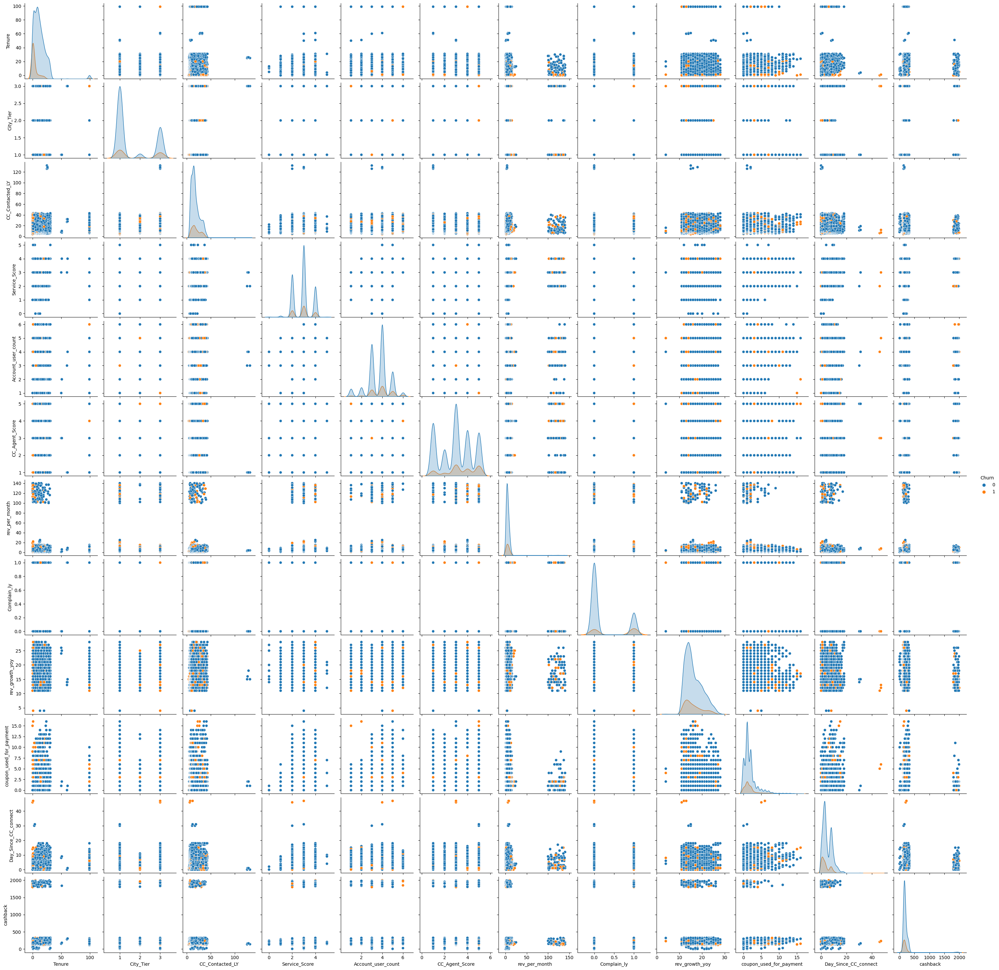

In [60]:
sns.pairplot(churn_df,hue='Churn')
plt.show()

**Insights**

* Churners and Non-churners seems overlapping each other in almost all the features.
* There is no Linear Pattern observed.
* Customers Churn more with Lowest Tenure.
* Tier-1 and Tier-3 Customers Churn Rate is more compared to Tier-2 cities customers.


In [58]:
#le = LabelEncoder()
#for col in cat_col:
#    churn_df[col] = le.fit_transform(churn_df[col])

In [59]:
#churn_df.head()

In [194]:
#churn_df['Login_device'].value_counts()

Login_device
Mobile      8021
Computer    3018
Name: count, dtype: int64

In [64]:
churn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Churn                    11260 non-null  int64  
 1   Tenure                   11042 non-null  float64
 2   City_Tier                11148 non-null  float64
 3   CC_Contacted_LY          11158 non-null  float64
 4   Payment                  11151 non-null  object 
 5   Gender                   11152 non-null  object 
 6   Service_Score            11162 non-null  float64
 7   Account_user_count       10816 non-null  float64
 8   account_segment          11163 non-null  object 
 9   CC_Agent_Score           11144 non-null  float64
 10  Marital_Status           11048 non-null  object 
 11  rev_per_month            10469 non-null  float64
 12  Complain_ly              10903 non-null  float64
 13  rev_growth_yoy           11257 non-null  float64
 14  coupon_used_for_paymen

In [65]:
churn_df.isnull().sum()

Churn                        0
Tenure                     218
City_Tier                  112
CC_Contacted_LY            102
Payment                    109
Gender                     108
Service_Score               98
Account_user_count         444
account_segment             97
CC_Agent_Score             116
Marital_Status             212
rev_per_month              791
Complain_ly                357
rev_growth_yoy               3
coupon_used_for_payment      3
Day_Since_CC_connect       358
cashback                   473
Login_device               221
dtype: int64

## Missing Value Treatment

In [66]:
print("Proportion of Missing Values in the folowing columns : \n")
#churn_df.isnull().sum()[churn_df.isna().sum()>0]
churn_df.isnull().sum()/churn_df.isnull().sum().sum()*100

Proportion of Missing Values in the folowing columns : 



Churn                       0.000000
Tenure                      5.703820
City_Tier                   2.930403
CC_Contacted_LY             2.668760
Payment                     2.851910
Gender                      2.825746
Service_Score               2.564103
Account_user_count         11.616954
account_segment             2.537938
CC_Agent_Score              3.035060
Marital_Status              5.546834
rev_per_month              20.695971
Complain_ly                 9.340659
rev_growth_yoy              0.078493
coupon_used_for_payment     0.078493
Day_Since_CC_connect        9.366824
cashback                   12.375720
Login_device                5.782313
dtype: float64

* Since the proportion of Missing Values is less than 30%, so we will impute the missing values rather than dropping them.

**Let's visually inspect the missing values in our data**

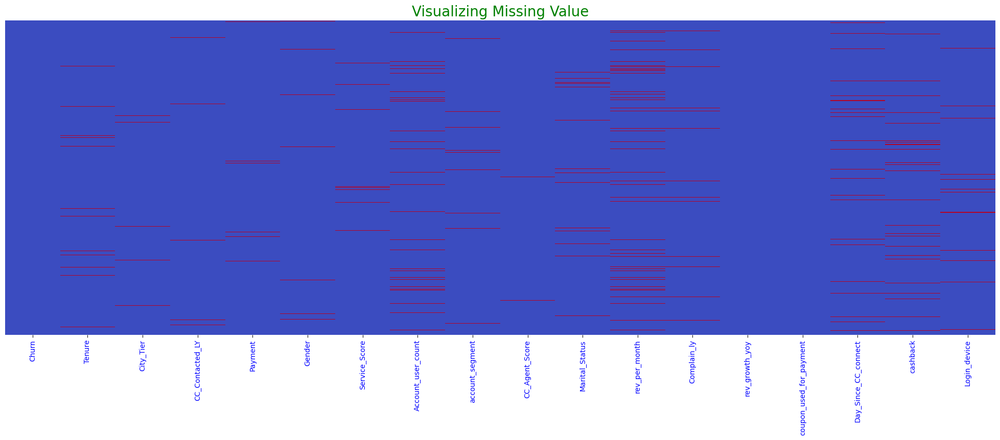

In [67]:
plt.figure(figsize = (25,8))
sns.heatmap(churn_df.isnull(), cbar = False, cmap = 'coolwarm', yticklabels = False)
plt.title("Visualizing Missing Value",color='green',fontsize=20)
plt.xticks(rotation=90,color='blue',fontsize=10)
#plt.yticks(color='blue',fontsize=20);
plt.show()

**Let's Impute Categorical and Numerical Columns using SimpleImputer**

In [68]:
cat_col

Index(['Payment', 'Gender', 'account_segment', 'Marital_Status',
       'Login_device'],
      dtype='object')

In [69]:
cat_int_col

['City_Tier',
 'Service_Score',
 'Account_user_count',
 'CC_Agent_Score',
 'Complain_ly']

In [70]:
cat_df = pd.concat([churn_df[cat_col],churn_df[cat_int_col]],axis=1)
cat_df.head(2)

,Payment,Gender,account_segment,Marital_Status,Login_device,City_Tier,Service_Score,Account_user_count,CC_Agent_Score,Complain_ly
0,Debit Card,Female,Super,Single,Mobile,3.0,3.0,3.0,2.0,1.0
1,UPI,Male,Regular Plus,Single,Mobile,1.0,3.0,4.0,3.0,1.0


In [71]:
cat = cat_df.columns
cat

Index(['Payment', 'Gender', 'account_segment', 'Marital_Status',
       'Login_device', 'City_Tier', 'Service_Score', 'Account_user_count',
       'CC_Agent_Score', 'Complain_ly'],
      dtype='object')

In [72]:
from sklearn.impute import SimpleImputer

In [73]:
imputer = SimpleImputer(missing_values = np.nan, strategy ='most_frequent') # Strategy - Mode
imputer= imputer.fit(churn_df[cat].iloc[:,:])
churn_df[cat]=imputer.transform(churn_df[cat])

In [74]:
num_cols

['Tenure',
 'CC_Contacted_LY',
 'rev_per_month',
 'rev_growth_yoy',
 'coupon_used_for_payment',
 'Day_Since_CC_connect',
 'cashback']

In [75]:
imputer = SimpleImputer(missing_values = np.nan, strategy = 'median',verbose=0)
imputer= imputer.fit(churn_df[num_cols].iloc[:,:])
churn_df[num_cols]=imputer.transform(churn_df[num_cols])

C:\Users\USER\anaconda3\Lib\site-packages\sklearn\impute\_base.py:382: FutureWarning: The 'verbose' parameter was deprecated in version 1.1 and will be removed in 1.3. A warning will always be raised upon the removal of empty columns in the future version.
  warnings.warn(


In [76]:
churn_df.isnull().sum()

Churn                      0
Tenure                     0
City_Tier                  0
CC_Contacted_LY            0
Payment                    0
Gender                     0
Service_Score              0
Account_user_count         0
account_segment            0
CC_Agent_Score             0
Marital_Status             0
rev_per_month              0
Complain_ly                0
rev_growth_yoy             0
coupon_used_for_payment    0
Day_Since_CC_connect       0
cashback                   0
Login_device               0
dtype: int64

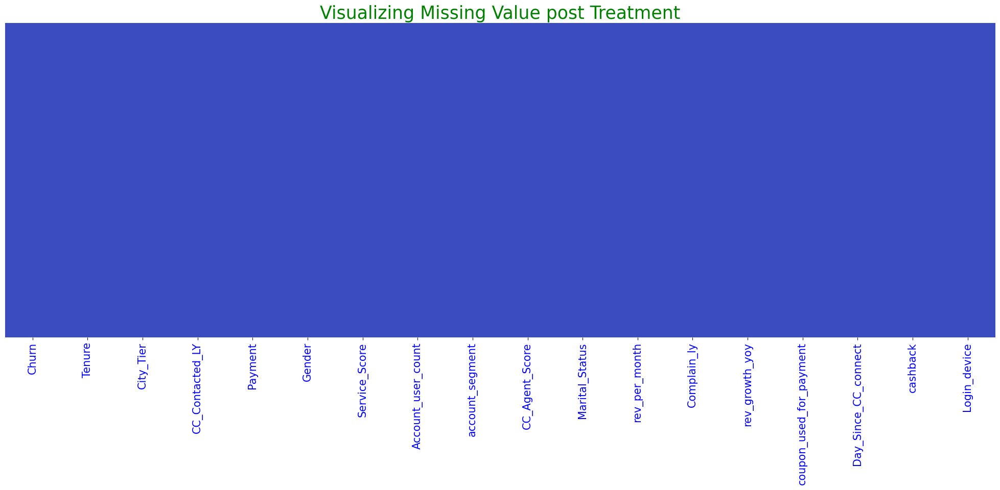

In [77]:
plt.figure(figsize = (25,8))
sns.heatmap(churn_df.isnull(), cbar = False, cmap = 'coolwarm', yticklabels = False)
plt.title("Visualizing Missing Value post Treatment",color='green',fontsize=25)
plt.xticks(rotation=90,color='blue',fontsize=15)
#plt.yticks(color='blue',fontsize=20);
plt.show()

In [78]:
[churn_df[i].value_counts() for i in cat_col]

[Payment
 Debit Card          4696
 Credit Card         3511
 E wallet            1217
 Cash on Delivery    1014
 UPI                  822
 Name: count, dtype: int64,
 Gender
 Male      6812
 Female    4448
 Name: count, dtype: int64,
 account_segment
 Regular Plus    4221
 Super           4062
 HNI             1639
 Super Plus       818
 Regular          520
 Name: count, dtype: int64,
 Marital_Status
 Married     6072
 Single      3520
 Divorced    1668
 Name: count, dtype: int64,
 Login_device
 Mobile      8242
 Computer    3018
 Name: count, dtype: int64]

## Outlier Treatment

In [79]:
churn_df.head(1)

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,1,4.0,3.0,6.0,Debit Card,Female,3.0,3.0,Super,2.0,Single,9.0,1.0,11.0,1.0,5.0,159.93,Mobile


In [80]:
#Checking numbers of observations beyond Upper & Lower Limit
Outlier_col = ['Tenure','CC_Contacted_LY','Service_Score','Account_user_count','rev_per_month','coupon_used_for_payment','Day_Since_CC_connect','cashback']
Q1 = churn_df[Outlier_col].quantile(0.25)
Q3 = churn_df[Outlier_col].quantile(0.75)
UL = Q3
LL = Q1
outliers = ((churn_df[Outlier_col] > UL) | (churn_df[Outlier_col] < LL)).sum()
print("Number of Observations Beyond Upper & Lower Limit for Each Column:")
display(outliers)

Number of Observations Beyond Upper & Lower Limit for Each Column:


Tenure                     5167
CC_Contacted_LY            5025
Service_Score              2421
Account_user_count         2986
rev_per_month              4329
coupon_used_for_payment    4228
Day_Since_CC_connect       5000
cashback                   5629
dtype: int64

In [81]:
# Define a function which returns the Upper and Lower limit to detect outliers for each feature.
def remove_outlier(col):
    Q1,Q3 = col.quantile([0.25,0.75])
    IQR = Q3 - Q1
    lower_range = Q1 - (1.5 * IQR)
    upper_range = Q3 + (1.5 * IQR)
    return lower_range,upper_range

In [82]:
# Cap & floor the values beyond the outlier boundaries
#col = credit_df.drop['Default']
for i in Outlier_col:
    LL,UL = remove_outlier(churn_df[i])
    churn_df[i] = np.where(churn_df[i] > UL,UL,churn_df[i])
    churn_df[i] = np.where(churn_df[i] < LL,LL,churn_df[i])

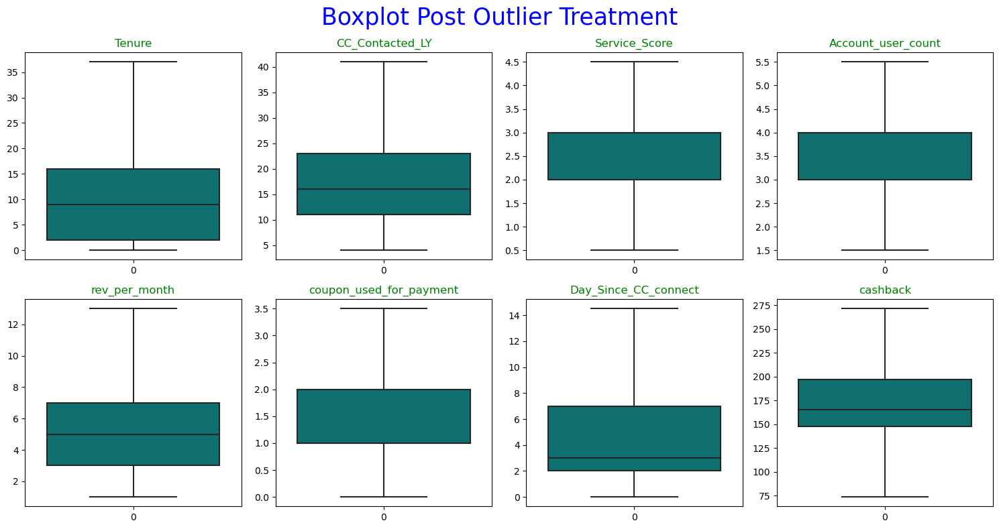

In [83]:
Outlier_col = ['Tenure','CC_Contacted_LY','Service_Score','Account_user_count','rev_per_month','coupon_used_for_payment','Day_Since_CC_connect','cashback']
#feature = churn_df.drop('Churn',axis=1).describe().columns
fig=plt.figure(figsize=(15,8))
plt.suptitle('Boxplot Post Outlier Treatment', fontsize = 25,color='blue')
for i in range(0,len(Outlier_col)):
    plt.subplot(2,4,i+1)
    #sns.boxplot(churn_df[cols[i]],color='orange')
    sns.boxplot(churn_df[Outlier_col[i]],color='teal')
    plt.title(Outlier_col[i],color='green')
    #plt.title(cols[i],color='green')
fig.tight_layout()
plt.show()

In [84]:
churn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Churn                    11260 non-null  int64  
 1   Tenure                   11260 non-null  float64
 2   City_Tier                11260 non-null  object 
 3   CC_Contacted_LY          11260 non-null  float64
 4   Payment                  11260 non-null  object 
 5   Gender                   11260 non-null  object 
 6   Service_Score            11260 non-null  object 
 7   Account_user_count       11260 non-null  object 
 8   account_segment          11260 non-null  object 
 9   CC_Agent_Score           11260 non-null  object 
 10  Marital_Status           11260 non-null  object 
 11  rev_per_month            11260 non-null  float64
 12  Complain_ly              11260 non-null  object 
 13  rev_growth_yoy           11260 non-null  float64
 14  coupon_used_for_paymen

In [85]:
churn_df.head(2)

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,1,4.0,3.0,6.0,Debit Card,Female,3.0,3.0,Super,2.0,Single,9.0,1.0,11.0,1.0,5.0,159.93,Mobile
1,1,0.0,1.0,8.0,UPI,Male,3.0,4.0,Regular Plus,3.0,Single,7.0,1.0,15.0,0.0,0.0,120.90,Mobile


In [86]:
churn_df['City_Tier'] = churn_df['City_Tier'].astype('int64')
churn_df['Service_Score'] = churn_df['Service_Score'].astype('int64')
churn_df['Account_user_count'] = churn_df['Account_user_count'].astype('int64')
churn_df['CC_Agent_Score'] = churn_df['CC_Agent_Score'].astype('int64')
churn_df['Complain_ly'] = churn_df['Complain_ly'].astype('int64')


In [87]:
churn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Churn                    11260 non-null  int64  
 1   Tenure                   11260 non-null  float64
 2   City_Tier                11260 non-null  int64  
 3   CC_Contacted_LY          11260 non-null  float64
 4   Payment                  11260 non-null  object 
 5   Gender                   11260 non-null  object 
 6   Service_Score            11260 non-null  int64  
 7   Account_user_count       11260 non-null  int64  
 8   account_segment          11260 non-null  object 
 9   CC_Agent_Score           11260 non-null  int64  
 10  Marital_Status           11260 non-null  object 
 11  rev_per_month            11260 non-null  float64
 12  Complain_ly              11260 non-null  int64  
 13  rev_growth_yoy           11260 non-null  float64
 14  coupon_used_for_paymen

#### Statistical Summary of the Customers who have Churned

In [88]:
churn_df[churn_df['Churn']==1].describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Churn,1896.0,NaN,NaN,NaN,1.0,0.0,1.0,1.0,1.0,1.0,1.0
Tenure,1896.0,NaN,NaN,NaN,3.660865,6.492737,0.0,0.0,1.0,4.0,37.0
City_Tier,1896.0,NaN,NaN,NaN,1.817511,0.957365,1.0,1.0,1.0,3.0,3.0
CC_Contacted_LY,1896.0,NaN,NaN,NaN,19.248945,8.856001,4.0,12.0,17.0,26.0,41.0
Payment,1896,5,Debit Card,724,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,1896,2,Male,1207,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Service_Score,1896.0,NaN,NaN,NaN,2.917722,0.700985,2.0,2.0,3.0,3.0,4.0
Account_user_count,1896.0,NaN,NaN,NaN,3.880802,0.90179,1.0,3.0,4.0,5.0,5.0
account_segment,1896,5,Regular Plus,1145,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CC_Agent_Score,1896.0,NaN,NaN,NaN,3.386603,1.333874,1.0,3.0,3.0,5.0,5.0


**Useful Insights**

* Total Churners = 1896.
* Average Tenure almost 4 months, Maximum Tenure is of 37 months.
* Tier 1 & 3 customers churns more.
* Most of the churners are Male and Singles.
* Preferred payment mode is Debit Cards holding regular Plus account and most likely Login via Mobile.
* Avg Cashback generated is around Rs 163 and Max cashback generated is around Rs 271.

## Data Visualization using Segmentation

**Let's Segment the data based on City Tiers, Payment Mode and Genders Respectively and will Draw useful insights if any.**

### Segment on the basis of City Tiers

#### There are 3 city tiers mentioned in the dataset. Generally, tier 1 cities are considered as the major metro cities where the people tend to use more DTH Services. So, accordingly, can we say that tier 1 city customers tends to generate more avg revenue as compared to tier 2 and tier 3 city customers.Let's visualize this and find it it's True or not?


In [89]:
churn_df.head(1)

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,1,4.0,3,6.0,Debit Card,Female,3,3,Super,2,Single,9.0,1,11.0,1.0,5.0,159.93,Mobile


In [90]:
df_citytier = churn_df[['City_Tier','Payment','rev_per_month','Churn']]

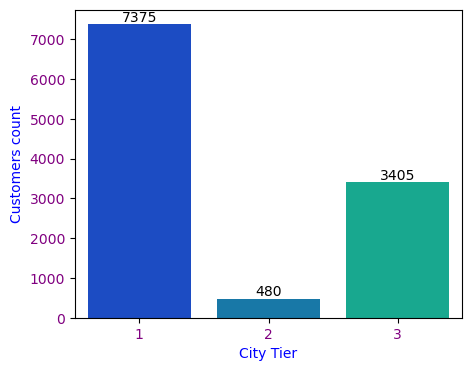

In [96]:
plt.figure(figsize=(5,4))
ax=sns.countplot(x='City_Tier',data=df_citytier,palette='winter')
for bars in ax.containers:
    ax.bar_label(bars)
plt.ylabel("Customers count",fontsize = 10,color='blue')
plt.xlabel('City Tier',fontsize = 10,color='blue')
plt.xticks(color='purple')
plt.yticks(color='purple');
plt.show()

**Insights**

* Count of customers are more in Tier-1 followed by Tier-3.
* Very less customers belongs to Tier-2.

**City Tier Vs Monthly Average Revenue**


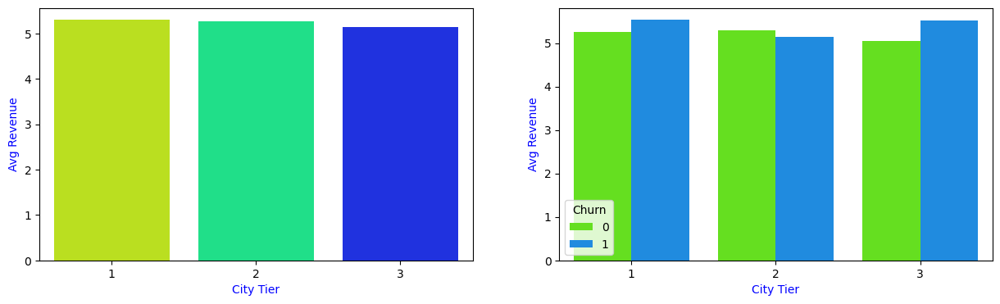

In [100]:
# Bivariate Analysis
#plt.figure(figsize=(5,5))
fig,axes = plt.subplots(1,2)
fig.set_size_inches(15,4)
ax=sns.barplot(x='City_Tier',y='rev_per_month',data=df_citytier,errorbar=('ci', False),ax=axes[0],palette='gist_rainbow')
ax.set_xlabel('City Tier',fontsize = 10,color='blue')
#ax.set_xticks(color='purple')
ax.set_ylabel('Avg Revenue',color='blue')
ax=sns.barplot(x='City_Tier',y='rev_per_month',data=df_citytier,hue='Churn',errorbar=('ci', False),ax=axes[1],palette='gist_rainbow')
ax.set_xlabel('City Tier',fontsize = 10,color='blue')
#ax.set_xticks(color='purple')
ax.set_ylabel('Avg Revenue',color='blue')

plt.show()

**Insights**

* We can see that Avg Revenue Generation is same across all the City Tiers.
* Though the Customers using the Services in Tier-2 is very less as compared to Tier-1 & 3, But the Avg Revenue generated per month by the account is same across all the Tiers.
* It seems Customers are more satisfied in Tier-2 hence they Retain to use the Services, generating greater revenue.

* As we can see from the plot, CityTier 1 & 2 has a slightly higher mean of Avg Revenue per month as compared to CityTier 3 which are more or less the same. So, our assumption here that tier 1 city customers tends to generate more avg revenue cannot be validated looking at the plot. 

### Payment Mode

#### There are different payment modes (CC, DC, COD, E-wallet & UPI). Depending on the city tiers, Let's Visualize and find the preferred payment modes used by the customers

In [90]:
pd.crosstab(df_citytier['City_Tier'],df_citytier['Payment'])

Payment,Cash on Delivery,Credit Card,Debit Card,E wallet,UPI
City_Tier,,,,,
1,732,2740,3407,12,484
2,31,100,123,0,226
3,251,671,1166,1205,112


In [91]:
print("Tier-1 : ",len(churn_df[churn_df['City_Tier']==1]))
print("Tier-2 : ",len(churn_df[churn_df['City_Tier']==2]))
print("Tier-3 : ",len(churn_df[churn_df['City_Tier']==3]))

Tier-1 :  7375
Tier-2 :  480
Tier-3 :  3405


In [92]:
print(np.round(3407/7375*100,2),"% of customers prefer Debit card as preferred payment mode in Tier 1 cities.")
print(np.round(226/480*100,2),"% of customers prefer UPI as preferred payment mode in Tier 2 cities.")
print(np.round(1205/3405*100,2),"% of customers prefer E wallet as preferred payment mode in Tier 3 cities.")

46.2 % of customers prefer Debit card as preferred payment mode in Tier 1 cities.
47.08 % of customers prefer UPI as preferred payment mode in Tier 2 cities.
35.39 % of customers prefer E wallet as preferred payment mode in Tier 3 cities.


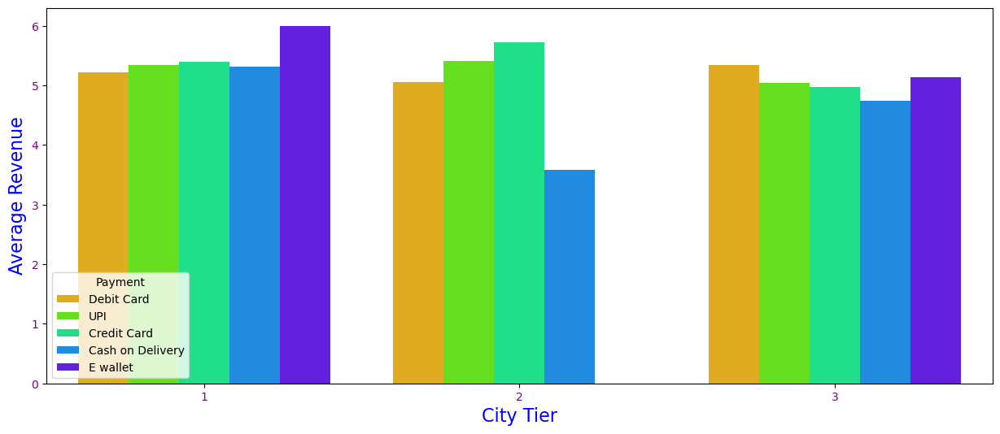

In [101]:
# Multivariate Analysis
plt.figure(figsize=(15,6))                                                                                              # viridis
sns.barplot(x = df_citytier['City_Tier'],y = df_citytier['rev_per_month'],hue = df_citytier['Payment'],errorbar=('ci', False),palette='gist_rainbow')
plt.ylabel("Average Revenue",fontsize = 16,color='blue')
plt.xlabel('City Tier',fontsize = 16,color='blue')
plt.xticks(color='purple')
plt.yticks(color='purple');

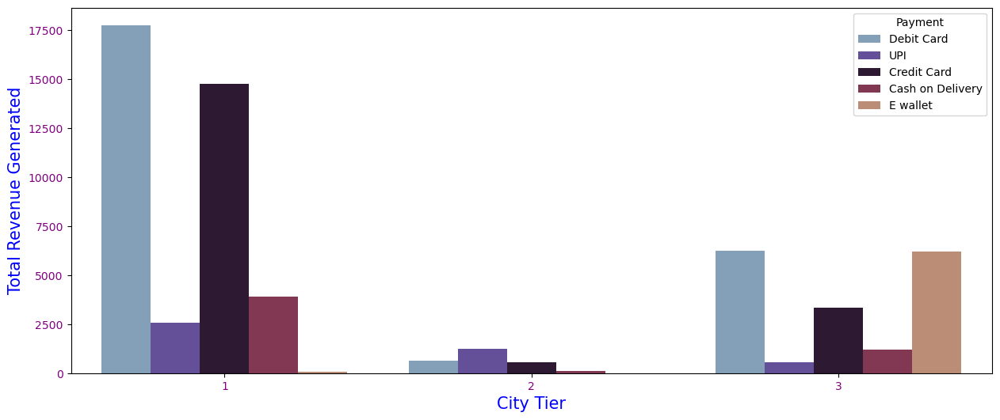

In [94]:
# Multivariate Analysis
plt.figure(figsize=(15,6))
sns.barplot(x = df_citytier['City_Tier'],y = df_citytier['rev_per_month'],hue = df_citytier['Payment'],estimator=sum,errorbar=('ci', False),palette='twilight')
plt.ylabel("Total Revenue Generated",fontsize = 15,color='blue')
plt.xlabel('City Tier',fontsize = 15,color='blue')
plt.xticks(color='purple')
plt.yticks(color='purple');
plt.show()

**Insights**

* As we can see, E wallet is used only by the Tier 1 & Tier 3 cities. 
* Tier-2 Customers don't prefer using E-wallet as payment mode.
* Most of the customers prefer using E wallet and Debit Card in tier 3 cities. 
* Almost 35% of the tier 3 city customers prefers E wallet as their payment mode, most revenue will be generated from such customers from tier 3 cities.

* Almost 46% of the tier 1 city customers prefers Debit Card as the payment mode, so most revenue will be generated from such customers from tier 1 cities.

* Almost 47% of the tier 2 city customers prefers UPI as the payment mode, so most revenue will be generated from such customers from tier 2 cities.

## Segment on the Basis of Gender

**Creating Two Dataframe w.r.t Genders respectively**

In [95]:
df_male = churn_df[churn_df['Gender']=='Male']
df_female = churn_df[churn_df['Gender']=='Female']

In [96]:
display(df_male.head())
display(df_female.head())

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
1,1,0.0,1,8.0,UPI,Male,3,4,Regular Plus,3,Single,7.0,1,15.0,0.0,0.0,120.90,Mobile
2,1,0.0,1,30.0,Debit Card,Male,2,4,Regular Plus,3,Single,6.0,1,14.0,0.0,3.0,165.25,Mobile
3,1,0.0,3,15.0,Debit Card,Male,2,4,Super,5,Single,8.0,0,23.0,0.0,3.0,134.07,Mobile
4,1,0.0,1,12.0,Credit Card,Male,2,3,Regular Plus,5,Single,3.0,0,11.0,1.0,3.0,129.60,Mobile
6,1,2.0,3,11.0,Cash on Delivery,Male,2,3,Super,2,Divorced,4.0,0,14.0,0.0,0.0,120.86,Mobile


,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,1,4.0,3,6.0,Debit Card,Female,3,3,Super,2,Single,9.0,1,11.0,1.0,5.0,159.93,Mobile
5,1,0.0,1,22.0,Debit Card,Female,3,4,Regular Plus,5,Single,2.0,1,22.0,3.5,7.0,139.19,Computer
10,1,4.0,1,18.0,Cash on Delivery,Female,2,3,Regular,3,Divorced,2.0,0,12.0,3.5,8.0,271.44,Mobile
16,1,0.0,1,12.0,Debit Card,Female,3,4,Regular Plus,2,Single,2.0,1,18.0,1.0,0.0,129.26,Computer
19,1,19.0,1,20.0,Debit Card,Female,3,3,Regular Plus,4,Divorced,5.0,0,18.0,1.0,3.0,149.63,Mobile


In [97]:
print("Male Count : ",df_male.Gender.count())
print("Female Count : ",df_female.Gender.count())

Male Count :  6812
Female Count :  4448


**Visualization for Male Vs Female segmentation** 

<Figure size 1500x1500 with 0 Axes>

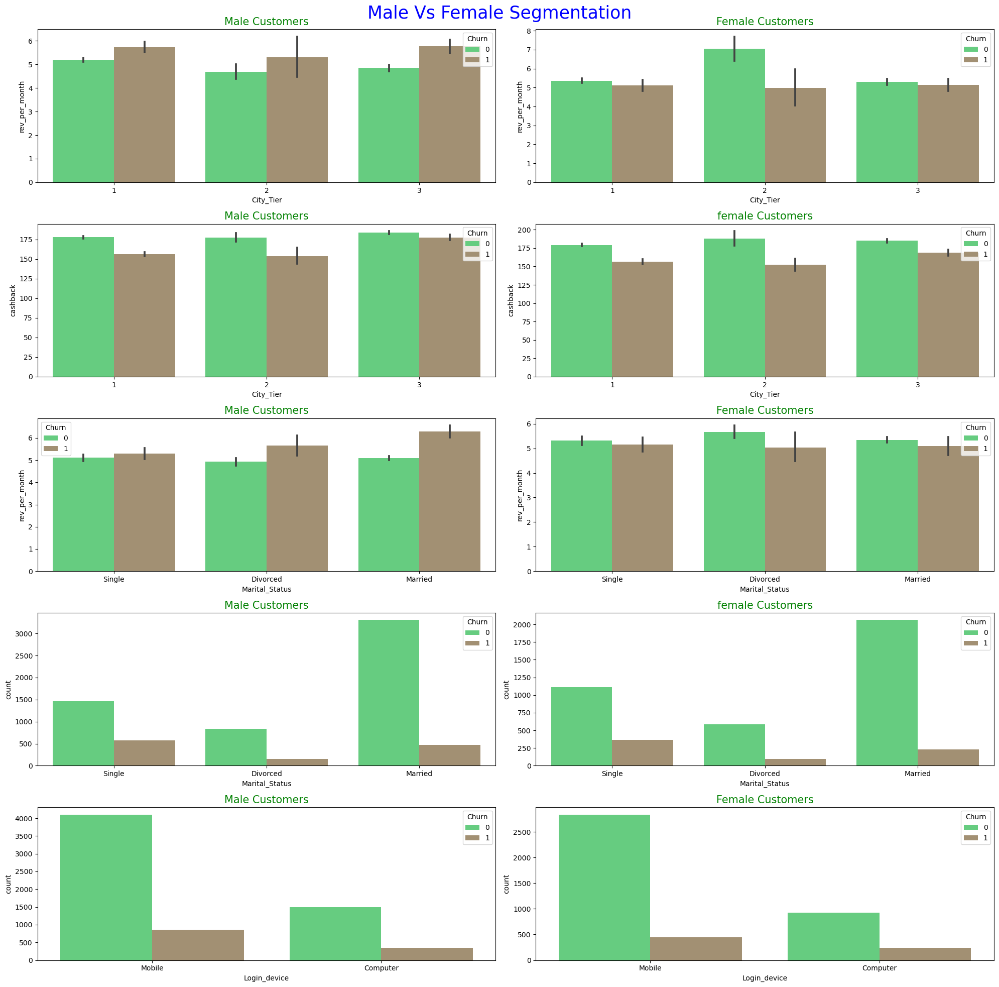

In [98]:
plt.figure(figsize=(15,15))
fig, axes = plt.subplots(nrows=5,ncols=2)
fig.set_size_inches(20,20)

plt.suptitle('Male Vs Female Segmentation', fontsize = 25,color='blue')

ax=sns.barplot(data=df_male,x='City_Tier',y='rev_per_month',hue='Churn',ax=axes[0][0],palette='terrain') 
ax.set_title("Male Customers",color='green',fontsize=15)
ax=sns.barplot(data=df_female,x='City_Tier',y='rev_per_month',hue='Churn',ax=axes[0][1],palette='terrain') 
ax.set_title("Female Customers",color='green',fontsize=15)
ax=sns.barplot(data=df_male,x='City_Tier',y='cashback',hue='Churn',ax=axes[1][0],palette='terrain')
ax.set_title("Male Customers",color='green',fontsize=15)
ax=sns.barplot(data=df_female,x='City_Tier',y='cashback',hue='Churn',ax=axes[1][1],palette='terrain')
ax.set_title("female Customers",color='green',fontsize=15)
ax=sns.barplot(data=df_male,x='Marital_Status',y='rev_per_month',hue='Churn',ax=axes[2][0],palette='terrain')
ax.set_title("Male Customers",color='green',fontsize=15)
ax=sns.barplot(data=df_female,x='Marital_Status',y='rev_per_month',hue='Churn',ax=axes[2][1],palette='terrain')
ax.set_title("Female Customers",color='green',fontsize=15)
#ax=sns.barplot(data=df_male,x='Marital_Status',y='cashback',hue='Churn',ax=axes[3][0],palette='rainbow')
ax=sns.countplot(data=df_male,x='Marital_Status',hue='Churn',ax=axes[3][0],palette='terrain')
ax.set_title("Male Customers",color='green',fontsize=15)
ax=sns.countplot(data=df_female,x='Marital_Status',hue='Churn',ax=axes[3][1],palette='terrain')
ax.set_title("female Customers",color='green',fontsize=15)
#ax=sns.barplot(data=df_male,x='Login_device',y='rev_per_month',hue='Churn',ax=axes[4][0],palette='rainbow')
ax=sns.countplot(data=df_male,x='Login_device',hue='Churn',ax=axes[4][0],palette='terrain')
ax.set_title("Male Customers",color='green',fontsize=15)
#ax=sns.barplot(data=df_female,x='Login_device',y='rev_per_month',hue='Churn',ax=axes[4][1],palette='rainbow')
ax=sns.countplot(data=df_female,x='Login_device',hue='Churn',ax=axes[4][1],palette='terrain')
ax.set_title("Female Customers",color='green',fontsize=15)
#ax=sns.barplot(data=df_male,x='Login_device',y='cashback',hue='Churn',ax=axes[5][0],palette='rainbow')
#ax.set_title("Male Customers",color='green',fontsize=15)
#ax=sns.barplot(data=df_female,x='Login_device',y='cashback',hue='Churn',ax=axes[5][1],palette='rainbow')
#ax.set_title("Female Customers",color='green',fontsize=15)
fig.tight_layout()
plt.show()

**Insights**

* In Tier-1 & Tier-2, avg monthly revenue is more generated by Male customer than Females and in Tier-3 by Females.
* Cashback ratio is same for male & female in all Tier and across Marital status.
* Avg revenue generated by Singles Male and Females are almost same in all Tiers.
* Revenue generated by Divorced Females are slightly more than male.
* Count of Marital status is same across Genders.
* Mobile is the most preffered Login deevice among Male and Females.

In [99]:
# Male Customers
pd.crosstab(df_male['City_Tier'],df_male['CC_Contacted_LY'],margins=True)

CC_Contacted_LY,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,...,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0,All
City_Tier,,,,,,,,,,,,,,,,,,,,,
1,1,4,125,161,214,253,200,215,234,268,...,50,66,66,66,39,23,20,9,33,4503
2,0,0,10,14,23,28,18,12,22,22,...,4,0,2,2,1,1,2,0,0,335
3,0,3,45,54,88,105,71,97,92,108,...,28,31,36,23,12,14,11,11,15,1974
All,1,7,180,229,325,386,289,324,348,398,...,82,97,104,91,52,38,33,20,48,6812


In [100]:
# Female Customers
pd.crosstab(df_female['City_Tier'],df_female['CC_Contacted_LY'],margins=True)

CC_Contacted_LY,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,...,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0,All
City_Tier,,,,,,,,,,,,,,,,,,,,,
1,1,90,117,138,161,119,117,151,180,174,...,43,52,42,42,30,21,12,15,17,2872
2,0,4,6,7,8,6,6,7,6,8,...,7,4,4,2,0,2,3,2,0,145
3,0,37,39,68,100,75,77,65,71,86,...,23,25,15,13,14,12,7,9,6,1431
All,1,131,162,213,269,200,200,223,257,268,...,73,81,61,57,44,35,22,26,23,4448


**Revenue Generated on the basis of Spend (Male Customers)**

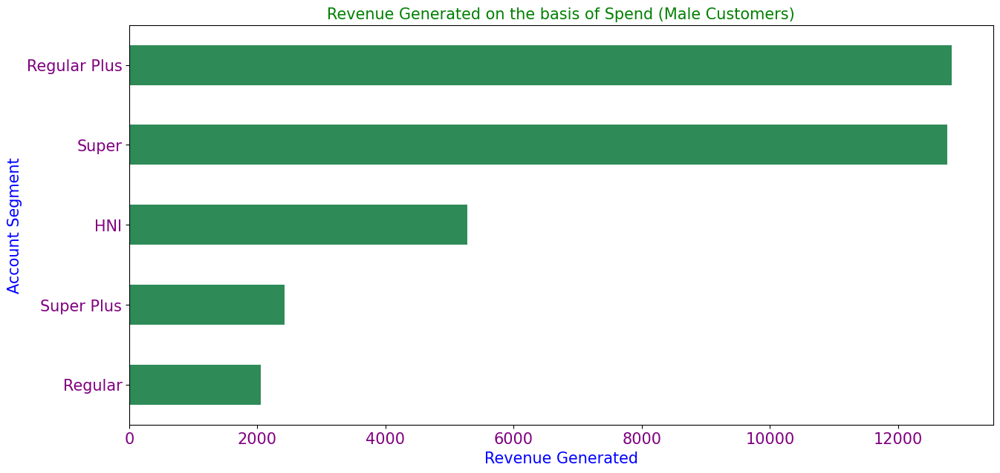

In [101]:
plt.figure(figsize=[15,7])
df_male.groupby('account_segment')['rev_per_month'].sum().sort_values().plot.barh(color='seagreen');
plt.xlabel('Revenue Generated',fontsize = 15,color='blue')
plt.ylabel('Account Segment',fontsize = 15,color='blue')
plt.title("Revenue Generated on the basis of Spend (Male Customers)",fontsize = 15,color='green');
plt.xticks(fontsize=15,color='purple')
plt.yticks(fontsize=15,color='purple')
plt.show()

C:\Users\USER\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


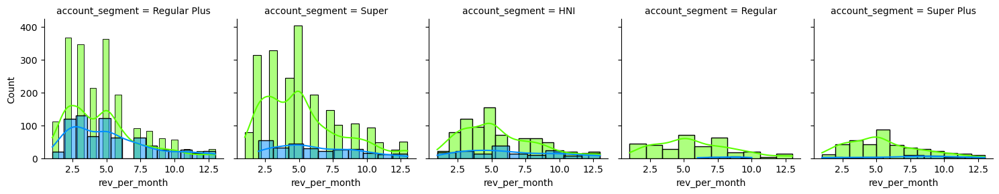

In [102]:
#plt.suptitle('Male Customers', fontsize = 25,color='blue')
g = sns.FacetGrid(df_male, col="account_segment",hue='Churn',palette='gist_rainbow')
g.map(sns.histplot, "rev_per_month",kde=True);
#plt.title("Male Customers")
g.tight_layout()

**Insights**

* Maximum Revenue is generated by Regular plus and Super account holder by male customers.

**Revenue Generated on the basis of Spend (Female Customers)**

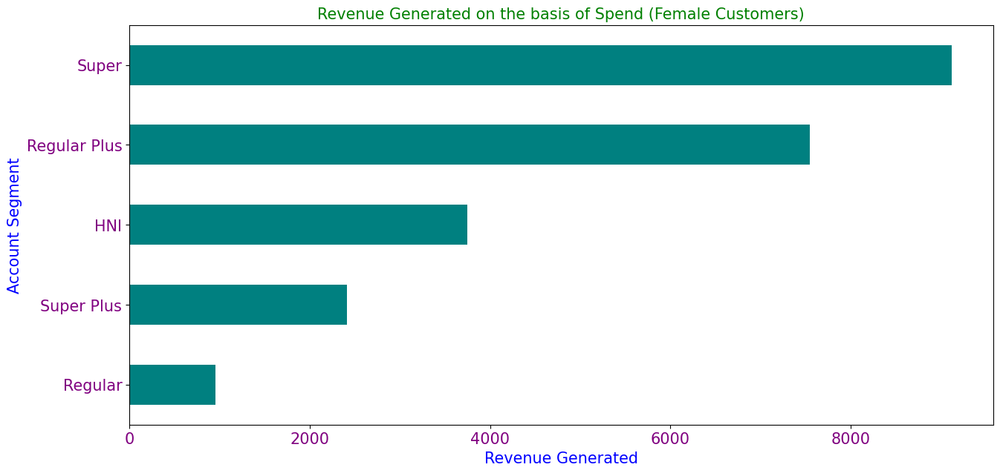

In [103]:
plt.figure(figsize=[15,7])
df_female.groupby('account_segment')['rev_per_month'].sum().sort_values().plot.barh(color='teal');
plt.xlabel('Revenue Generated',fontsize = 15,color='blue')
plt.ylabel('Account Segment',fontsize = 15,color='blue')
plt.title("Revenue Generated on the basis of Spend (Female Customers)",fontsize = 15,color='green');
plt.xticks(fontsize=15,color='purple')
plt.yticks(fontsize=15,color='purple')
plt.show()

C:\Users\USER\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


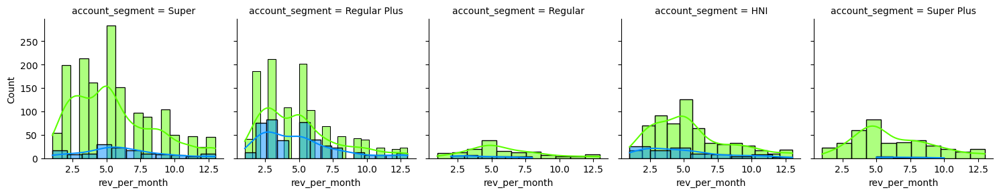

In [104]:
g = sns.FacetGrid(df_female, col="account_segment",hue='Churn',palette='gist_rainbow')
g.map(sns.histplot, "rev_per_month",kde=True);
g.tight_layout()
plt.show()

**Insights**

* Maximum revenue is generated by Super account holder followed by Regular Plus Female customers.

In [105]:
churn_df.head(1)

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,1,4.0,3,6.0,Debit Card,Female,3,3,Super,2,Single,9.0,1,11.0,1.0,5.0,159.93,Mobile


C:\Users\USER\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


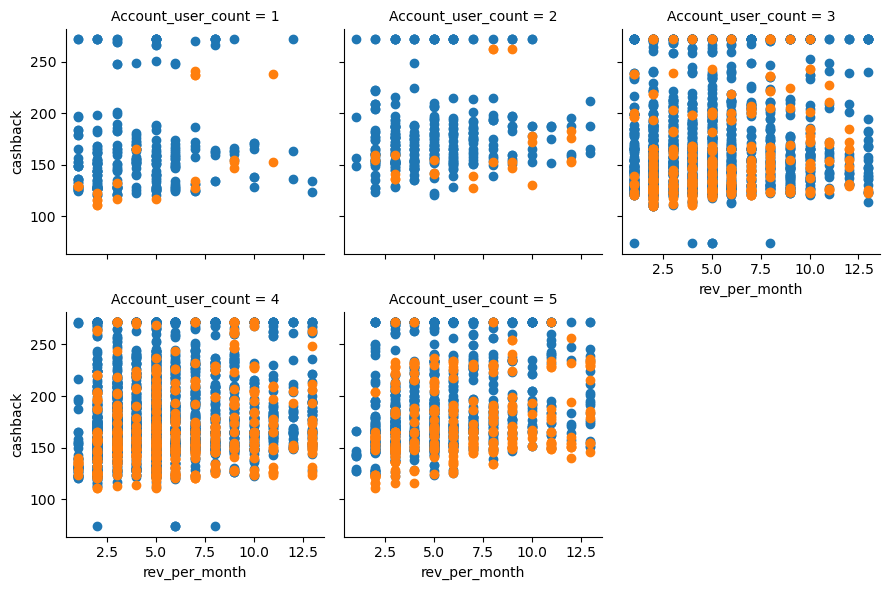

In [106]:
g = sns.FacetGrid(df_male, col="Account_user_count", hue='Churn',col_wrap=3, height=3)
g = g.map(plt.scatter, "rev_per_month", 'cashback')

**Revenue Generated on the basis of Account_user_count(Male Customers)**

C:\Users\USER\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


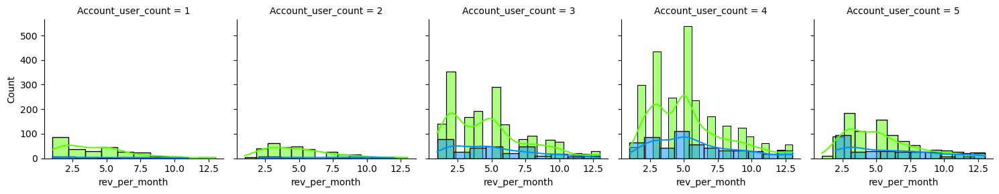

In [107]:
#plt.suptitle('Male Customers', fontsize = 25,color='blue')
g = sns.FacetGrid(df_male, col="Account_user_count",hue='Churn',palette='gist_rainbow')
g.map(sns.histplot, "rev_per_month",kde=True);
#plt.title("Male Customers")
g.tight_layout()

**Insights**

* Account tagged with more users generate more Revenue by Male customers.

**Revenue Generated on the basis of Account_user_count(Female Customers)**

C:\Users\USER\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


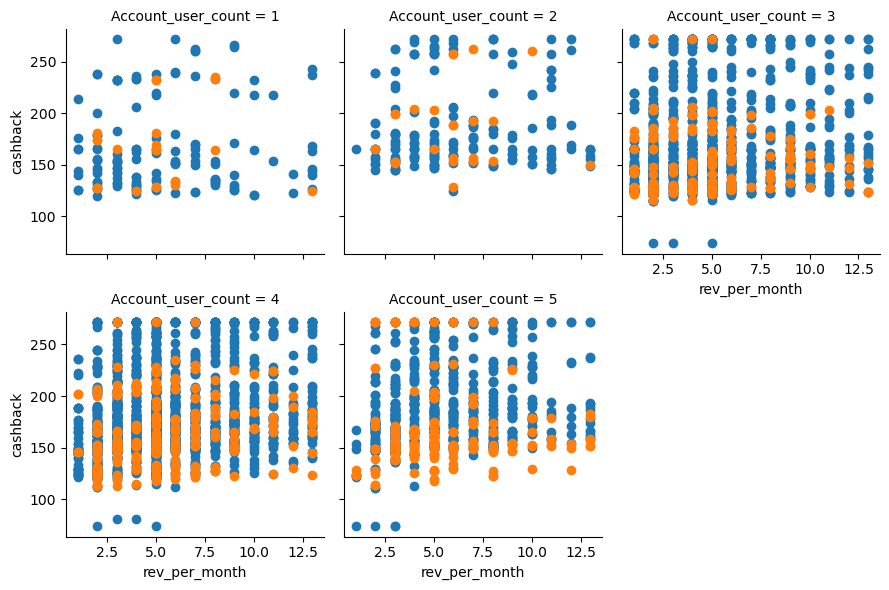

In [108]:
# Female Customers
g = sns.FacetGrid(df_female, col="Account_user_count", hue='Churn',col_wrap=3, height=3)
g = g.map(plt.scatter, "rev_per_month", 'cashback')

C:\Users\USER\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


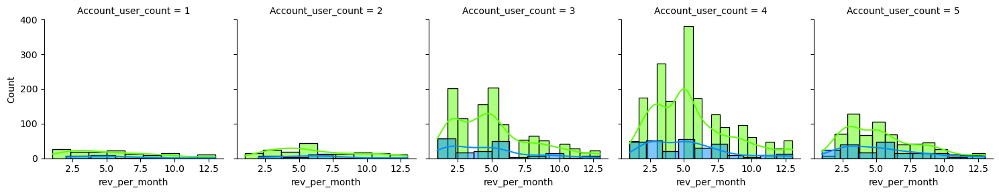

In [109]:
g = sns.FacetGrid(df_female, col="Account_user_count",hue='Churn',palette='gist_rainbow')
g.map(sns.histplot, "rev_per_month",kde=True);
g.tight_layout()
plt.show()

**Insights**

* Account tagged with more users generate more Revenue by Female customers.

## Data Encoding

In [122]:
from sklearn.preprocessing import LabelEncoder

In [123]:
churn_df_we = churn_df.copy()

In [124]:
cat_col

Index(['Payment', 'Gender', 'account_segment', 'Marital_Status',
       'Login_device'],
      dtype='object')

In [125]:
le = LabelEncoder()
for col in cat_col:
    churn_df[col] = le.fit_transform(churn_df[col])

In [126]:
churn_df.head()

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,1,4.0,3,6.0,2,0,3,3,3,2,2,9.0,1,11.0,1.0,5.0,159.93,1
1,1,0.0,1,8.0,4,1,3,4,2,3,2,7.0,1,15.0,0.0,0.0,120.90,1
2,1,0.0,1,30.0,2,1,2,4,2,3,2,6.0,1,14.0,0.0,3.0,165.25,1
3,1,0.0,3,15.0,2,1,2,4,3,5,2,8.0,0,23.0,0.0,3.0,134.07,1
4,1,0.0,1,12.0,1,1,2,3,2,5,2,3.0,0,11.0,1.0,3.0,129.60,1


In [127]:
churn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Churn                    11260 non-null  int64  
 1   Tenure                   11260 non-null  float64
 2   City_Tier                11260 non-null  int64  
 3   CC_Contacted_LY          11260 non-null  float64
 4   Payment                  11260 non-null  int32  
 5   Gender                   11260 non-null  int32  
 6   Service_Score            11260 non-null  int64  
 7   Account_user_count       11260 non-null  int64  
 8   account_segment          11260 non-null  int32  
 9   CC_Agent_Score           11260 non-null  int64  
 10  Marital_Status           11260 non-null  int32  
 11  rev_per_month            11260 non-null  float64
 12  Complain_ly              11260 non-null  int64  
 13  rev_growth_yoy           11260 non-null  float64
 14  coupon_used_for_paymen

In [128]:
[churn_df[i].value_counts() for i in cat_col]

[Payment
 2    4696
 1    3511
 3    1217
 0    1014
 4     822
 Name: count, dtype: int64,
 Gender
 1    6812
 0    4448
 Name: count, dtype: int64,
 account_segment
 2    4221
 3    4062
 0    1639
 4     818
 1     520
 Name: count, dtype: int64,
 Marital_Status
 1    6072
 2    3520
 0    1668
 Name: count, dtype: int64,
 Login_device
 1    8242
 0    3018
 Name: count, dtype: int64]

**Saving tha clean data into Excel file**


In [129]:
churn_df.to_excel("churn_df_clean.xlsx",index=False)

## Feature Transformation

### Scaling the Data using MinMax Scalor

In [130]:
predictors = churn_df.drop("Churn",axis=1)    ##clust_df
predictors.head()

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,4.0,3,6.0,2,0,3,3,3,2,2,9.0,1,11.0,1.0,5.0,159.93,1
1,0.0,1,8.0,4,1,3,4,2,3,2,7.0,1,15.0,0.0,0.0,120.90,1
2,0.0,1,30.0,2,1,2,4,2,3,2,6.0,1,14.0,0.0,3.0,165.25,1
3,0.0,3,15.0,2,1,2,4,3,5,2,8.0,0,23.0,0.0,3.0,134.07,1
4,0.0,1,12.0,1,1,2,3,2,5,2,3.0,0,11.0,1.0,3.0,129.60,1


In [131]:
from sklearn.preprocessing import MinMaxScaler

In [132]:
sc = MinMaxScaler()
predictors_scaled = pd.DataFrame(sc.fit_transform(predictors),columns=predictors.columns)
predictors_scaled.head()

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,0.108108,1.0,0.054054,0.50,0.0,0.75,0.50,0.75,0.25,1.0,0.666667,1.0,0.291667,0.285714,0.344828,0.435907,1.0
1,0.000000,0.0,0.108108,1.00,1.0,0.75,0.75,0.50,0.50,1.0,0.500000,1.0,0.458333,0.000000,0.000000,0.238466,1.0
2,0.000000,0.0,0.702703,0.50,1.0,0.50,0.75,0.50,0.50,1.0,0.416667,1.0,0.416667,0.000000,0.206897,0.462819,1.0
3,0.000000,1.0,0.297297,0.50,1.0,0.50,0.75,0.75,1.00,1.0,0.583333,0.0,0.791667,0.000000,0.206897,0.305089,1.0
4,0.000000,0.0,0.216216,0.25,1.0,0.50,0.50,0.50,1.00,1.0,0.166667,0.0,0.291667,0.285714,0.206897,0.282477,1.0


In [133]:
sc_churn_df = pd.concat([predictors_scaled,churn_df['Churn']],axis=1)
sc_churn_df.head()

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device,Churn
0,0.108108,1.0,0.054054,0.50,0.0,0.75,0.50,0.75,0.25,1.0,0.666667,1.0,0.291667,0.285714,0.344828,0.435907,1.0,1
1,0.000000,0.0,0.108108,1.00,1.0,0.75,0.75,0.50,0.50,1.0,0.500000,1.0,0.458333,0.000000,0.000000,0.238466,1.0,1
2,0.000000,0.0,0.702703,0.50,1.0,0.50,0.75,0.50,0.50,1.0,0.416667,1.0,0.416667,0.000000,0.206897,0.462819,1.0,1
3,0.000000,1.0,0.297297,0.50,1.0,0.50,0.75,0.75,1.00,1.0,0.583333,0.0,0.791667,0.000000,0.206897,0.305089,1.0,1
4,0.000000,0.0,0.216216,0.25,1.0,0.50,0.50,0.50,1.00,1.0,0.166667,0.0,0.291667,0.285714,0.206897,0.282477,1.0,1


**Saving scaled data into Excel file**

In [134]:
sc_churn_df.to_excel("churn_df_clean_scaled.xlsx",index=False)

### Addition of new variables (if required).

* Addition of New variables is not required in this problem.

## Clustering

**we will be performing clustering via KMeans clustering.**

**Plotting Elbow plot (up to n=10) and identifying optimum number of clusters for k-means algorithm.**

In [135]:
from sklearn.cluster import KMeans

In [122]:
num_cols

['Tenure',
 'CC_Contacted_LY',
 'rev_per_month',
 'rev_growth_yoy',
 'coupon_used_for_payment',
 'Day_Since_CC_connect',
 'cashback']

In [123]:
cat_int_col

['City_Tier',
 'Service_Score',
 'Account_user_count',
 'CC_Agent_Score',
 'Complain_ly']

In [124]:
clust_df_new_sc = pd.concat([predictors_scaled[num_cols],predictors_scaled[cat_int_col]],axis=1)
clust_df_new_sc.head()

,Tenure,CC_Contacted_LY,rev_per_month,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,City_Tier,Service_Score,Account_user_count,CC_Agent_Score,Complain_ly
0,0.108108,0.054054,0.666667,0.291667,0.285714,0.344828,0.435907,1.0,0.75,0.50,0.25,1.0
1,0.000000,0.108108,0.500000,0.458333,0.000000,0.000000,0.238466,0.0,0.75,0.75,0.50,1.0
2,0.000000,0.702703,0.416667,0.416667,0.000000,0.206897,0.462819,0.0,0.50,0.75,0.50,1.0
3,0.000000,0.297297,0.583333,0.791667,0.000000,0.206897,0.305089,1.0,0.50,0.75,1.00,0.0
4,0.000000,0.216216,0.166667,0.291667,0.285714,0.206897,0.282477,0.0,0.50,0.50,1.00,0.0


In [125]:
wss=[]
for i in range(1,11):
    k_means = KMeans(n_clusters=i,random_state=42,n_init='auto')
    k_means.fit(clust_df_new_sc)
    wss.append(k_means.inertia_)

In [126]:
wss

[11421.9438190301,
 9176.629321395238,
 7615.490928715341,
 7048.8944112808,
 6410.348210966902,
 6100.127607690805,
 5861.519839291061,
 5766.519777933091,
 5605.03196531094,
 5418.2716569608465]

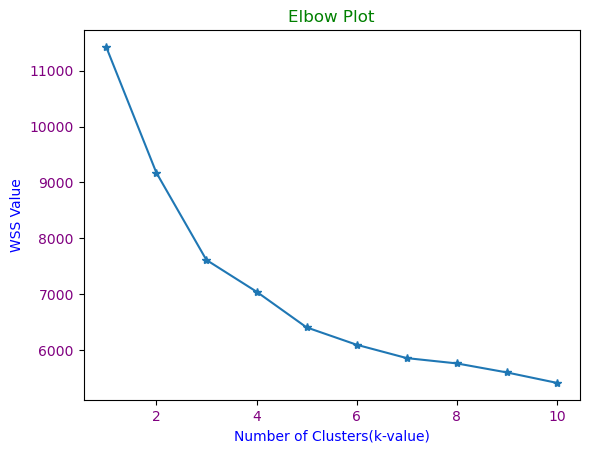

In [127]:
plt.plot(range(1,11),wss,marker='*')
plt.xlabel("Number of Clusters(k-value)",color='blue')
plt.ylabel("WSS Value",color='blue')
plt.title("Elbow Plot",color='green')
plt.xticks(color='purple')
plt.yticks(color='purple')
plt.show()

* From the above Elbow plot and WSS (within sum of squares) value we can choose optimum number of cluster as 3.
* Upto K=3 the drop in WSS value is significant.
* Beyond K=3, the drop is not significant.

**Print silhouette scores for up to 10 clusters and identify optimum number of clusters.**

In [128]:
from sklearn.metrics import silhouette_score 

In [129]:
ss={1:0} 
for i in range(2,11): 
    cluster = KMeans(n_clusters = i, init = 'k-means++',random_state=42,n_init='auto') 
    label = cluster.fit_predict(clust_df_new_sc) # The higher (up to 1) the better 
    s =silhouette_score(clust_df_new_sc, label) 
    ss[i]=round(s,5)
    print("The Silhouette Score for {} clusters is {}".format(i,round(s,5)))

The Silhouette Score for 2 clusters is 0.21014
The Silhouette Score for 3 clusters is 0.23507
The Silhouette Score for 4 clusters is 0.15923
The Silhouette Score for 5 clusters is 0.18869
The Silhouette Score for 6 clusters is 0.17312
The Silhouette Score for 7 clusters is 0.15749
The Silhouette Score for 8 clusters is 0.14826
The Silhouette Score for 9 clusters is 0.14614
The Silhouette Score for 10 clusters is 0.14788


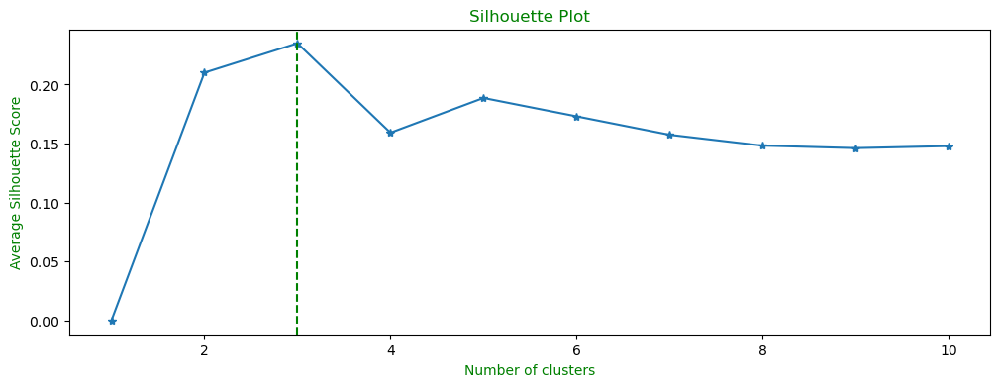

In [130]:
maxkey= [key for key, value in ss.items() if value == max(ss.values())][0]
fig,ax = plt.subplots(figsize=(12,4)) 
plt.plot(list(ss.keys()),list(ss.values()),marker='*')
ax.axvline(x=maxkey, color="green", linestyle="--")
plt.title('Silhouette Plot',color='green')
plt.xlabel('Number of clusters',color='green')
plt.ylabel('Average Silhouette Score',color='green') 
plt.show()

* Optimal number of clusters =3.


In [131]:
k_means = KMeans(n_clusters=3,random_state=42)
k_means.fit(clust_df_new_sc)
labels = k_means.labels_
print(labels)

C:\Users\USER\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[2 2 2 ... 2 1 0]


In [132]:
predictors['Clusters'] = labels

In [133]:
predictors.head()

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device,Clusters
0,4.0,3,6.0,2,0,3,3,3,2,2,9.0,1,11.0,1.0,5.0,159.93,1,2
1,0.0,1,8.0,4,1,3,4,2,3,2,7.0,1,15.0,0.0,0.0,120.90,1,2
2,0.0,1,30.0,2,1,2,4,2,3,2,6.0,1,14.0,0.0,3.0,165.25,1,2
3,0.0,3,15.0,2,1,2,4,3,5,2,8.0,0,23.0,0.0,3.0,134.07,1,1
4,0.0,1,12.0,1,1,2,3,2,5,2,3.0,0,11.0,1.0,3.0,129.60,1,0


In [134]:
predictors.Clusters.value_counts()

Clusters
0    5337
2    3111
1    2812
Name: count, dtype: int64

**Adding Clusters to the Churn Dataframe for further Visualization**

In [135]:
churn_df_clust = pd.concat([churn_df_we,predictors['Clusters']],axis=1)
churn_df_clust.head()

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device,Clusters
0,1,4.0,3,6.0,Debit Card,Female,3,3,Super,2,Single,9.0,1,11.0,1.0,5.0,159.93,Mobile,2
1,1,0.0,1,8.0,UPI,Male,3,4,Regular Plus,3,Single,7.0,1,15.0,0.0,0.0,120.90,Mobile,2
2,1,0.0,1,30.0,Debit Card,Male,2,4,Regular Plus,3,Single,6.0,1,14.0,0.0,3.0,165.25,Mobile,2
3,1,0.0,3,15.0,Debit Card,Male,2,4,Super,5,Single,8.0,0,23.0,0.0,3.0,134.07,Mobile,1
4,1,0.0,1,12.0,Credit Card,Male,2,3,Regular Plus,5,Single,3.0,0,11.0,1.0,3.0,129.60,Mobile,0


In [136]:
churn_df_clust['Clusters'].value_counts()

Clusters
0    5337
2    3111
1    2812
Name: count, dtype: int64

**Grouping data on the basis of Clusters and Login Device**

In [137]:
churn_df_clust.groupby(['Clusters','Login_device']).count()

Churn  Tenure  City_Tier  CC_Contacted_LY  Payment  \
Clusters Login_device                                                       
0        Computer       1410    1410       1410             1410     1410   
         Mobile         3927    3927       3927             3927     3927   
1        Computer        787     787        787              787      787   
         Mobile         2025    2025       2025             2025     2025   
2        Computer        821     821        821              821      821   
         Mobile         2290    2290       2290             2290     2290   

                       Gender  Service_Score  Account_user_count  \
Clusters Login_device                                              
0        Computer        1410           1410                1410   
         Mobile          3927           3927                3927   
1        Computer         787            787                 787   
         Mobile          2025           2025                2025   
2        Computer         821            821                 821   
         Mobile          2290           2290                2290   

                       account_segment  CC_Agent_Score  Marital_Status  \
Clusters Login_device                                                    
0        Computer                 1410            1410            1410   
         Mobile                   3927            3927            3927   
1        Computer                  787             787             787   
         Mobile                   2025            2025            2025   
2        Computer                  821             821             821   
         Mobile                   2290            2290            2290   

                       rev_per_month  Complain_ly  rev_growth_yoy  \
Clusters Login_device                                               
0        Computer               1410         1410            1410   
         Mobile                 3927         3927            3927   
1        Computer                787          787             787   
         Mobile                 2025         2025            2025   
2        Computer                821          821             821   
         Mobile                 2290         2290            2290   

                       coupon_used_for_payment  Day_Since_CC_connect  cashback  
Clusters Login_device                                                           
0        Computer                         1410                  1410      1410  
         Mobile                           3927                  3927      3927  
1        Computer                          787                   787       787  
         Mobile                           2025                  2025      2025  
2        Computer                          821                   821       821  
         Mobile                           2290                  2290      2290

In [138]:
#churn_df_clust.groupby(['Clusters','Login_device']).mean()[['Tenure','CC_Contacted_LY','Account_user_count','rev_per_month','rev_growth_yoy','coupon_used_for_payment','Day_Since_CC_connect','cashback']]

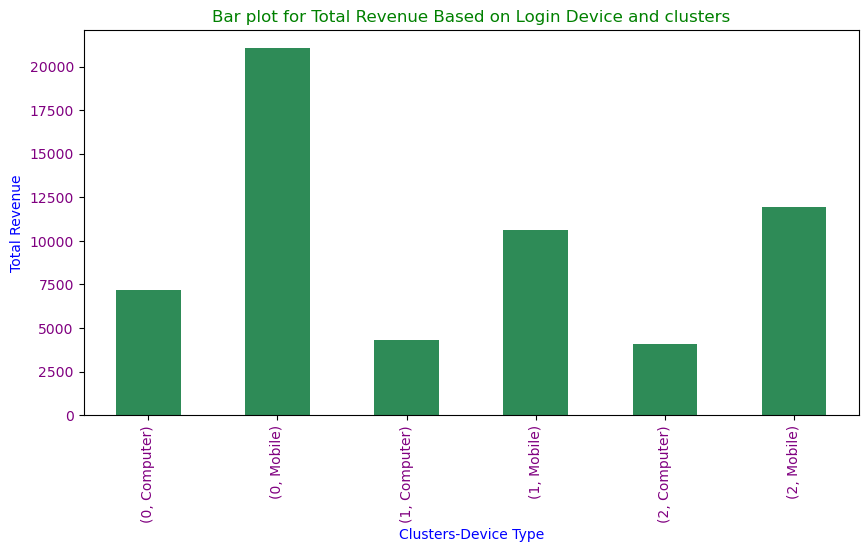

In [139]:

churn_df_clust.groupby(['Clusters','Login_device']).sum()['rev_per_month'].plot(kind='bar',figsize=(10,5),color='seagreen')
plt.title("Bar plot for Total Revenue Based on Login Device and clusters",color='green')
plt.xlabel("Clusters-Device Type",color='blue')
plt.ylabel("Total Revenue",color='blue')
plt.xticks(color='purple')
plt.yticks(color='purple')
plt.show()

* Total Revenue generated is Maximum for Cluster 0 followed by cluster 2, through Login Device Mobile.
* Also, For Login Device Computer, Maximum Revenue is generated by Cluster 0.

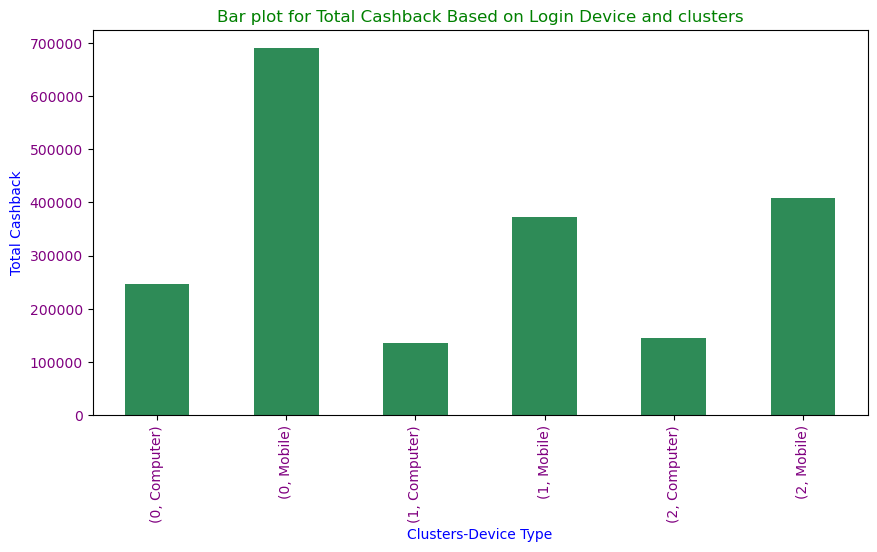

In [140]:
churn_df_clust.groupby(['Clusters','Login_device']).sum()['cashback'].plot(kind='bar',figsize=(10,5),color='seagreen')
plt.title("Bar plot for Total Cashback Based on Login Device and clusters",color='green')
plt.xlabel("Clusters-Device Type",color='blue')
plt.ylabel("Total Cashback",color='blue')
plt.xticks(color='purple')
plt.yticks(color='purple')
plt.show()

* Total Cashback is Maximum for Cluster 0 followed by cluster 2, through Login Device Mobile.
* Also, For Login Device Computer, Maximum Cashback is generated by Cluster 0.

### Segmenting tha Dataset based on Clusters

**Let's Segment the Data based on Clusters Formed**

* Creating Three datasets based on Clusters formed for further Visualization.

In [141]:
clust_0_df = churn_df_clust[churn_df_clust['Clusters']==0]
clust_1_df = churn_df_clust[churn_df_clust['Clusters']==1]
clust_2_df = churn_df_clust[churn_df_clust['Clusters']==2]

In [142]:
display(clust_0_df.head())
display(clust_1_df.head())
display(clust_2_df.head())

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device,Clusters
4,1,0.0,1,12.0,Credit Card,Male,2,3,Regular Plus,5,Single,3.0,0,11.0,1.0,3.0,129.60,Mobile,0
9,1,0.0,1,31.0,Debit Card,Male,2,5,Regular Plus,3,Single,2.0,0,12.0,1.0,1.0,122.93,Mobile,0
10,1,4.0,1,18.0,Cash on Delivery,Female,2,3,Regular,3,Divorced,2.0,0,12.0,3.5,8.0,271.44,Mobile,0
19,1,19.0,1,20.0,Debit Card,Female,3,3,Regular Plus,4,Divorced,5.0,0,18.0,1.0,3.0,149.63,Mobile,0
21,1,20.0,1,29.0,Credit Card,Female,3,3,HNI,2,Divorced,2.0,0,12.0,3.5,6.0,203.12,Mobile,0


,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device,Clusters
3,1,0.0,3,15.0,Debit Card,Male,2,4,Super,5,Single,8.0,0,23.0,0.0,3.0,134.07,Mobile,1
6,1,2.0,3,11.0,Cash on Delivery,Male,2,3,Super,2,Divorced,4.0,0,14.0,0.0,0.0,120.86,Mobile,1
14,1,9.0,3,15.0,Credit Card,Male,3,4,HNI,2,Single,2.0,0,16.0,0.0,7.0,196.19,Mobile,1
26,0,8.0,3,6.0,E wallet,Male,3,3,HNI,4,Divorced,2.0,0,13.0,1.0,6.0,172.95,Mobile,1
29,0,5.0,3,14.0,E wallet,Female,2,3,HNI,2,Single,2.0,0,14.0,2.0,7.0,189.98,Computer,1


,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device,Clusters
0,1,4.0,3,6.0,Debit Card,Female,3,3,Super,2,Single,9.0,1,11.0,1.0,5.0,159.93,Mobile,2
1,1,0.0,1,8.0,UPI,Male,3,4,Regular Plus,3,Single,7.0,1,15.0,0.0,0.0,120.90,Mobile,2
2,1,0.0,1,30.0,Debit Card,Male,2,4,Regular Plus,3,Single,6.0,1,14.0,0.0,3.0,165.25,Mobile,2
5,1,0.0,1,22.0,Debit Card,Female,3,4,Regular Plus,5,Single,2.0,1,22.0,3.5,7.0,139.19,Computer,2
7,1,0.0,1,6.0,Credit Card,Male,3,3,Regular Plus,2,Divorced,3.0,1,16.0,2.0,0.0,122.93,Mobile,2


**Plotting Countplot for Different Clusters**

<Figure size 500x300 with 0 Axes>

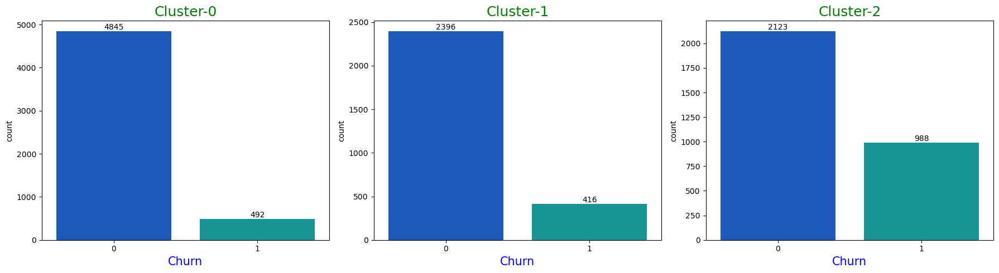

In [143]:
plt.figure(figsize=(5,3))
fig,axes = plt.subplots(1,3)
fig.set_size_inches(18,5)

ax=sns.countplot(x=clust_0_df['Churn'],data=clust_0_df,order=clust_0_df['Churn'].value_counts().index,palette='winter',ax=axes[0])
for bars in ax.containers:
        ax.bar_label(bars)
ax.set_title("Cluster-0",color='green',fontsize=18)
ax.set_xlabel("Churn",color='blue',fontsize=15)

ax1=sns.countplot(x=clust_1_df['Churn'],data=clust_1_df,order=clust_1_df['Churn'].value_counts().index,palette='winter',ax=axes[1])
for bars in ax1.containers:
        ax1.bar_label(bars)
ax1.set_title("Cluster-1",color='green',fontsize=18)
ax1.set_xlabel("Churn",color='blue',fontsize=15)

ax2=sns.countplot(x=clust_2_df['Churn'],data=clust_2_df,order=clust_2_df['Churn'].value_counts().index,palette='winter',ax=axes[2])
for bars in ax2.containers:
        ax2.bar_label(bars)
ax2.set_title("Cluster-2",color='green',fontsize=18)
ax2.set_xlabel("Churn",color='blue',fontsize=15)

fig.tight_layout()
plt.show()

**Insights**

* Churners are more in Cluster-2 as compared to other Clusters.


<Figure size 500x300 with 0 Axes>

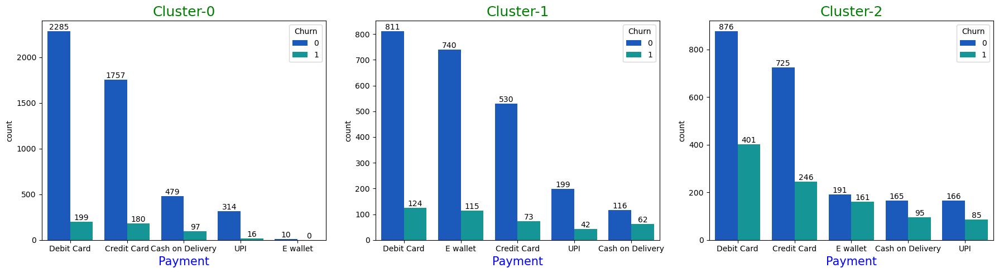

In [144]:
plt.figure(figsize=(5,3))
fig,axes = plt.subplots(1,3)
fig.set_size_inches(18,5)

ax=sns.countplot(x=clust_0_df['Payment'],data=clust_0_df,order=clust_0_df['Payment'].value_counts().index,hue='Churn',palette='winter',ax=axes[0])
for bars in ax.containers:
        ax.bar_label(bars)
ax.set_title("Cluster-0",color='green',fontsize=18)
ax.set_xlabel("Payment",color='blue',fontsize=15)

ax1=sns.countplot(x=clust_1_df['Payment'],data=clust_1_df,order=clust_1_df['Payment'].value_counts().index,hue='Churn',palette='winter',ax=axes[1])
for bars in ax1.containers:
        ax1.bar_label(bars)
ax1.set_title("Cluster-1",color='green',fontsize=18)
ax1.set_xlabel("Payment",color='blue',fontsize=15)

ax2=sns.countplot(x=clust_2_df['Payment'],data=clust_2_df,order=clust_2_df['Payment'].value_counts().index,hue='Churn',palette='winter',ax=axes[2])
for bars in ax2.containers:
        ax2.bar_label(bars)
ax2.set_title("Cluster-2",color='green',fontsize=18)
ax2.set_xlabel("Payment",color='blue',fontsize=15)

fig.tight_layout()
plt.show()

**Insights**

* E-wallet payment mode is mostly used by Cluster-1 customers as compared to other clusters.
* Debit Card payment mode is used by all three clusters customer.
* E-wallet is Rearely used in cluster-0.
* Maximum churners use Debit card as payment mode across clusters.

<Figure size 500x300 with 0 Axes>

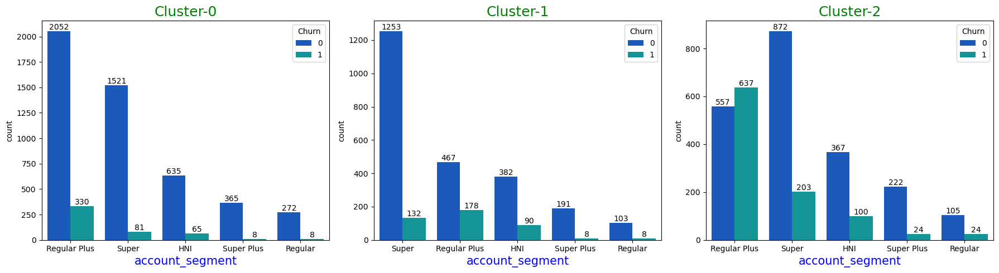

In [145]:
plt.figure(figsize=(5,3))
fig,axes = plt.subplots(1,3)
fig.set_size_inches(18,5)

ax=sns.countplot(x=clust_0_df['account_segment'],data=clust_0_df,order=clust_0_df['account_segment'].value_counts().index,hue='Churn',palette='winter',ax=axes[0])
for bars in ax.containers:
        ax.bar_label(bars)
ax.set_title("Cluster-0",color='green',fontsize=18)
ax.set_xlabel("account_segment",color='blue',fontsize=15)

ax1=sns.countplot(x=clust_1_df['account_segment'],data=clust_1_df,order=clust_1_df['account_segment'].value_counts().index,hue='Churn',palette='winter',ax=axes[1])
for bars in ax1.containers:
        ax1.bar_label(bars)
ax1.set_title("Cluster-1",color='green',fontsize=18)
ax1.set_xlabel("account_segment",color='blue',fontsize=15)

ax2=sns.countplot(x=clust_2_df['account_segment'],data=clust_2_df,order=clust_2_df['account_segment'].value_counts().index,hue='Churn',palette='winter',ax=axes[2])
for bars in ax2.containers:
        ax2.bar_label(bars)
ax2.set_title("Cluster-2",color='green',fontsize=18)
ax2.set_xlabel("account_segment",color='blue',fontsize=15)

fig.tight_layout()
plt.show()

**Insights**

* Super account holder are more in Cluster-1 followed by Cluster-2.
* Maximum Regular Plus account holders belongs to Cluster-0 and Cluster-2.
* In cluster-2 more churners belong to Regular plus account.
* More Churners belong to Regular plus account.

<Figure size 500x300 with 0 Axes>

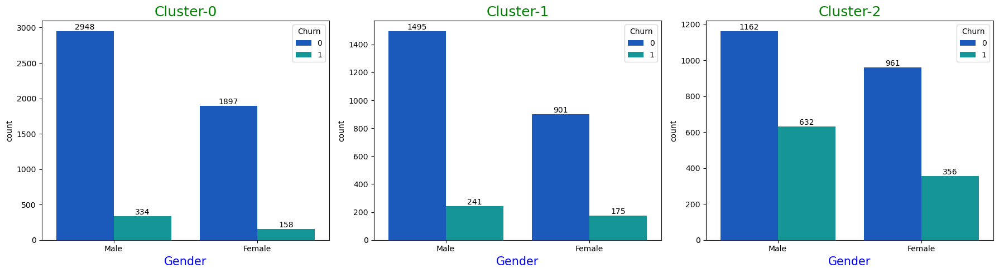

In [146]:
plt.figure(figsize=(5,3))
fig,axes = plt.subplots(1,3)
fig.set_size_inches(18,5)

ax=sns.countplot(x=clust_0_df['Gender'],data=clust_0_df,order=clust_0_df['Gender'].value_counts().index,hue='Churn',palette='winter',ax=axes[0])
for bars in ax.containers:
        ax.bar_label(bars)
ax.set_title("Cluster-0",color='green',fontsize=18)
ax.set_xlabel("Gender",color='blue',fontsize=15)

ax1=sns.countplot(x=clust_1_df['Gender'],data=clust_1_df,order=clust_1_df['Gender'].value_counts().index,hue='Churn',palette='winter',ax=axes[1])
for bars in ax1.containers:
        ax1.bar_label(bars)
ax1.set_title("Cluster-1",color='green',fontsize=18)
ax1.set_xlabel("Gender",color='blue',fontsize=15)

ax2=sns.countplot(x=clust_2_df['Gender'],data=clust_2_df,order=clust_2_df['Gender'].value_counts().index,hue='Churn',palette='winter',ax=axes[2])
for bars in ax2.containers:
        ax2.bar_label(bars)
ax2.set_title("Cluster-2",color='green',fontsize=18)
ax2.set_xlabel("Gender",color='blue',fontsize=15)

fig.tight_layout()
plt.show()

**Insights**

* Females are slightly more in Cluster-2 as compared to other clusters.
* Gender Ratio is almost same in all the Clusters.
* Male Churners are more as compared to Female across clusters.

<Figure size 500x300 with 0 Axes>

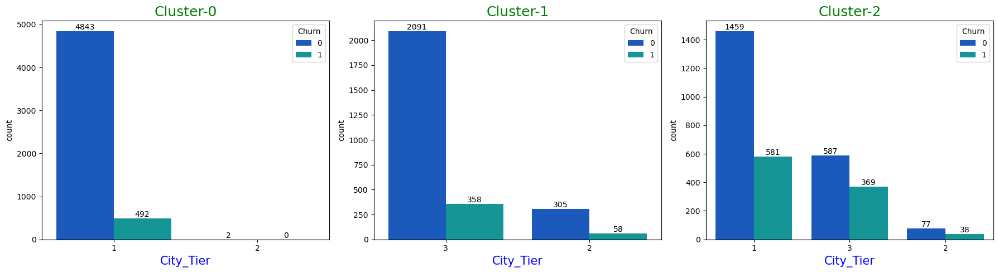

In [147]:
plt.figure(figsize=(5,3))
fig,axes = plt.subplots(1,3)
fig.set_size_inches(18,5)

ax=sns.countplot(x=clust_0_df['City_Tier'],data=clust_0_df,order=clust_0_df['City_Tier'].value_counts().index,hue='Churn',palette='winter',ax=axes[0])
for bars in ax.containers:
        ax.bar_label(bars)
ax.set_title("Cluster-0",color='green',fontsize=18)
ax.set_xlabel("City_Tier",color='blue',fontsize=15)

ax1=sns.countplot(x=clust_1_df['City_Tier'],data=clust_1_df,order=clust_1_df['City_Tier'].value_counts().index,hue='Churn',palette='winter',ax=axes[1])
for bars in ax1.containers:
        ax1.bar_label(bars)
ax1.set_title("Cluster-1",color='green',fontsize=18)
ax1.set_xlabel("City_Tier",color='blue',fontsize=15)

ax2=sns.countplot(x=clust_2_df['City_Tier'],data=clust_2_df,order=clust_2_df['City_Tier'].value_counts().index,hue='Churn',palette='winter',ax=axes[2])
for bars in ax2.containers:
        ax2.bar_label(bars)
ax2.set_title("Cluster-2",color='green',fontsize=18)
ax2.set_xlabel("City_Tier",color='blue',fontsize=15)

fig.tight_layout()
plt.show()

**Insights**

* Cluster-0 have customers belonging to mostly Tier-1 &  very less from Tier-2. Their are no Tier-3 customers in cluster-0.
* Cluster-1 have customers belonging to mostly Tier-3 & very less from Tier-2. Their are no Tier-1 customers in cluster-1.
* In Cluster-2 maximum customers belong to Tier-1 followed by Tier-1 and then Tier-2.
* More churners belong to cluster-2.

<Figure size 500x300 with 0 Axes>

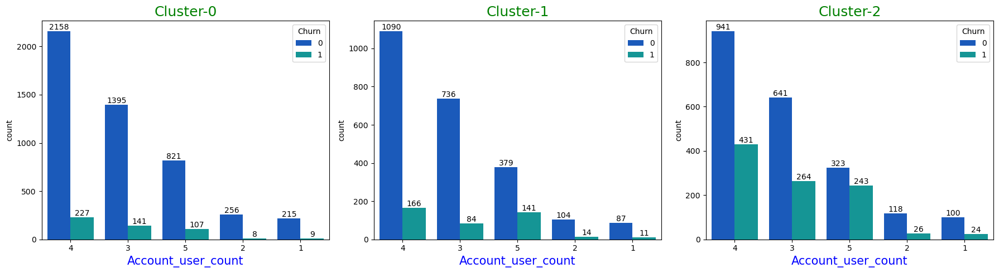

In [148]:
plt.figure(figsize=(5,3))
fig,axes = plt.subplots(1,3)
fig.set_size_inches(18,5)

ax=sns.countplot(x=clust_0_df['Account_user_count'],data=clust_0_df,order=clust_0_df['Account_user_count'].value_counts().index,hue='Churn',palette='winter',ax=axes[0])
for bars in ax.containers:
        ax.bar_label(bars)
ax.set_title("Cluster-0",color='green',fontsize=18)
ax.set_xlabel("Account_user_count",color='blue',fontsize=15)

ax1=sns.countplot(x=clust_1_df['Account_user_count'],data=clust_1_df,order=clust_1_df['Account_user_count'].value_counts().index,hue='Churn',palette='winter',ax=axes[1])
for bars in ax1.containers:
        ax1.bar_label(bars)
ax1.set_title("Cluster-1",color='green',fontsize=18)
ax1.set_xlabel("Account_user_count",color='blue',fontsize=15)

ax2=sns.countplot(x=clust_2_df['Account_user_count'],data=clust_2_df,order=clust_2_df['Account_user_count'].value_counts().index,hue='Churn',palette='winter',ax=axes[2])
for bars in ax2.containers:
        ax2.bar_label(bars)
ax2.set_title("Cluster-2",color='green',fontsize=18)
ax2.set_xlabel("Account_user_count",color='blue',fontsize=15)

fig.tight_layout()
plt.show()

**Insights**

* Ratio of user tagged with single account is same across all the Clusters.
* More churners belong to account tagged with 3 or 4 users.

<Figure size 500x300 with 0 Axes>

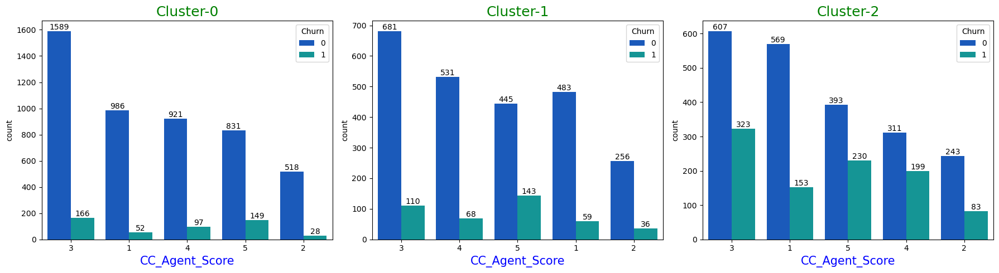

In [149]:
plt.figure(figsize=(5,3))
fig,axes = plt.subplots(1,3)
fig.set_size_inches(18,5)

ax=sns.countplot(x=clust_0_df['CC_Agent_Score'],data=clust_0_df,order=clust_0_df['CC_Agent_Score'].value_counts().index,hue='Churn',palette='winter',ax=axes[0])
for bars in ax.containers:
        ax.bar_label(bars)
ax.set_title("Cluster-0",color='green',fontsize=18)
ax.set_xlabel("CC_Agent_Score",color='blue',fontsize=15)

ax1=sns.countplot(x=clust_1_df['CC_Agent_Score'],data=clust_1_df,order=clust_1_df['CC_Agent_Score'].value_counts().index,hue='Churn',palette='winter',ax=axes[1])
for bars in ax1.containers:
        ax1.bar_label(bars)
ax1.set_title("Cluster-1",color='green',fontsize=18)
ax1.set_xlabel("CC_Agent_Score",color='blue',fontsize=15)

ax2=sns.countplot(x=clust_2_df['CC_Agent_Score'],data=clust_2_df,order=clust_2_df['CC_Agent_Score'].value_counts().index,hue='Churn',palette='winter',ax=axes[2])
for bars in ax2.containers:
        ax2.bar_label(bars)
ax2.set_title("Cluster-2",color='green',fontsize=18)
ax2.set_xlabel("CC_Agent_Score",color='blue',fontsize=15)

fig.tight_layout()
plt.show();

**Insights**

* In cluster-0,1 and 2,satisfaction score given by maximum customers is 3.



<Figure size 500x300 with 0 Axes>

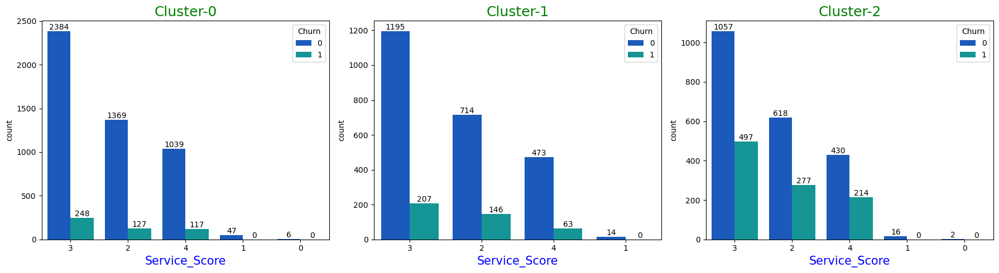

In [150]:
plt.figure(figsize=(5,3))
fig,axes = plt.subplots(1,3)
fig.set_size_inches(18,5)

ax=sns.countplot(x=clust_0_df['Service_Score'],data=clust_0_df,order=clust_0_df['Service_Score'].value_counts().index,hue='Churn',palette='winter',ax=axes[0])
for bars in ax.containers:
        ax.bar_label(bars)
ax.set_title("Cluster-0",color='green',fontsize=18)
ax.set_xlabel("Service_Score",color='blue',fontsize=15)

ax1=sns.countplot(x=clust_1_df['Service_Score'],data=clust_1_df,order=clust_1_df['Service_Score'].value_counts().index,hue='Churn',palette='winter',ax=axes[1])
for bars in ax1.containers:
        ax1.bar_label(bars)
ax1.set_title("Cluster-1",color='green',fontsize=18)
ax1.set_xlabel("Service_Score",color='blue',fontsize=15)

ax2=sns.countplot(x=clust_2_df['Service_Score'],data=clust_2_df,order=clust_2_df['Service_Score'].value_counts().index,hue='Churn',palette='winter',ax=axes[2])
for bars in ax2.containers:
        ax2.bar_label(bars)
ax2.set_title("Cluster-2",color='green',fontsize=18)
ax2.set_xlabel("Service_Score",color='blue',fontsize=15)

fig.tight_layout()
plt.show();

**Insights**

* In cluster-1, no customers have given a score of 0.
* In all the Clusters maximum customers have given a score of 3,2 and 4 respectively.

In [151]:
clust_0_df.head(1)

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device,Clusters
4,1,0.0,1,12.0,Credit Card,Male,2,3,Regular Plus,5,Single,3.0,0,11.0,1.0,3.0,129.6,Mobile,0


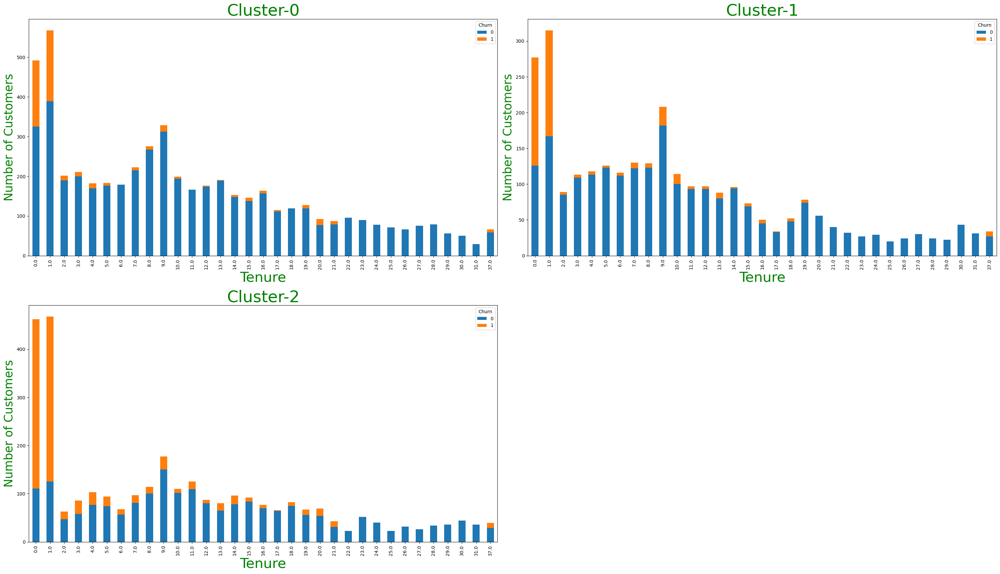

In [152]:
p1 = clust_0_df.groupby("Tenure")['Churn'].value_counts(normalize=False).unstack()
p2 = clust_1_df.groupby("Tenure")['Churn'].value_counts(normalize=False).unstack()
p3 = clust_2_df.groupby("Tenure")['Churn'].value_counts(normalize=False).unstack()


fig = plt.figure(figsize=(20,10)) # create figure
fig.set_size_inches(30,25)

ax0 = fig.add_subplot(321) # add subplot 1 (1 row, 2 columns, first plot)
ax1 = fig.add_subplot(322) # add subplot 2 (1 row, 2 columns, second plot). See tip below**
ax2 = fig.add_subplot(323) # add subplot 2 (1 row, 2 columns, third plot).

# Subplot 1
p1.plot(kind='bar', stacked='False', ax=ax0) # add to subplot 1
ax0.set_title('Cluster-0',fontsize=35,color='green')
ax0.set_xlabel('Tenure',fontsize=30,color='green')
ax0.set_ylabel('Number of Customers',fontsize=25,color='green')

# Subplot 2
p2.plot(kind='bar', stacked='False', ax=ax1) # add to subplot 2
ax1.set_title('Cluster-1',fontsize=35,color='green')
ax1.set_xlabel('Tenure',fontsize=30,color='green')
ax1.set_ylabel('Number of Customers',fontsize=25,color='green')

# Subplot 3
p3.plot(kind='bar', stacked='False', ax=ax2) # add to subplot 2
ax2.set_title('Cluster-2',fontsize=35,color='green')
ax2.set_xlabel('Tenure',fontsize=30,color='green')
ax2.set_ylabel('Number of Customers',fontsize=25,color='green')

fig.tight_layout()
plt.show()


**Insights**

* It is observed that the newly joined customers having low Tenure Churns most,so more concern should be given to the newly joined customers and their cause of churning should be figured out.
* Most of the customers who Churns, customers with less than 2 tenures are classified as new customers.

<Figure size 500x300 with 0 Axes>

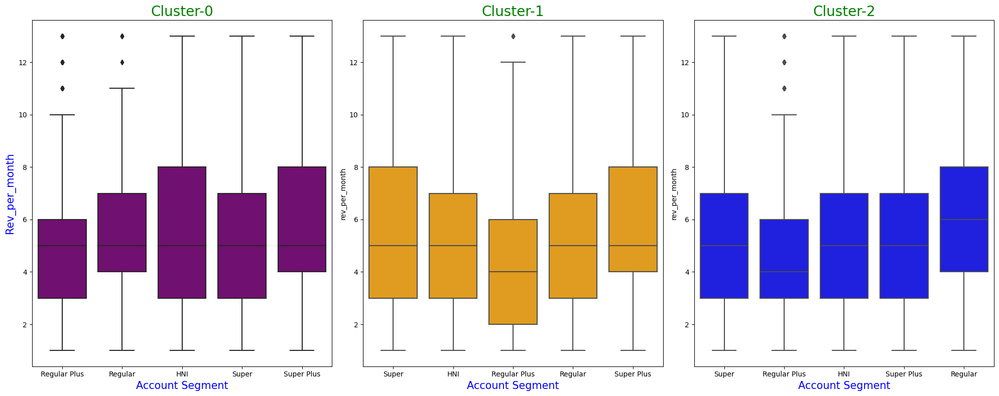

In [154]:
plt.figure(figsize=(5,3))
fig,axes = plt.subplots(1,3)
fig.set_size_inches(20,8)

ax=sns.boxplot(data=clust_0_df, y= 'rev_per_month', x='account_segment', color='purple',ax=axes[0])
ax.set_title("Cluster-0",color='green',fontsize=20)
ax.set_xlabel("Account Segment",color='blue',fontsize=15)
ax.set_ylabel("Rev_per_month",color='blue',fontsize=15)
#ax.set_xticks(color='purple')
#ax.set_yticks(color='purple')

ax1=sns.boxplot(data=clust_1_df, y= 'rev_per_month', x='account_segment', color='orange',ax=axes[1])
ax1.set_title("Cluster-1",color='green',fontsize=20)
ax1.set_xlabel("Account Segment",color='blue',fontsize=15)
#ax1.set_xticks(color='purple')
#ax1.set_yticks(color='purple')

ax2=sns.boxplot(data=clust_2_df, y= 'rev_per_month', x='account_segment', color='blue',ax=axes[2])
ax2.set_title("Cluster-2",color='green',fontsize=20)
ax2.set_xlabel("Account Segment",color='blue',fontsize=15)
#ax2.set_xticks(color='purple',rotation=0)
#ax2.set_yticks(color='purple')

fig.tight_layout()
plt.show()

**Insights**

* Maximum revenue is generated by HNI accounts in cluster 0.
* In cluster-1, Super, HNI and Super plus generate maximum revenue.
* In cluster-2, Regular accounts generate max Revenue.

## Feature Selection


#### We will use Variance Inflation Factor to Select the Important features using the VIF value.



### How to check for Multicollinearity

* There are different ways of detecting (or testing) multicollinearity. One such way is Variation Inflation Factor.

* **Variance  Inflation  factor**:  Variance  inflation  factors  measure  the  inflation  in  the variances of the regression coefficients estimates due to collinearities that exist among the  predictors.  It  is  a  measure  of  how  much  the  variance  of  the  estimated  regression coefficient $\beta_k$ is "inflated" by  the  existence  of  correlation  among  the  predictor variables in the model.

* **General Rule of Thumb**:

    - If VIF is 1, then there is no correlation among the $k$th predictor and the remaining predictor variables, and  hence, the variance of $\beta_k$ is not inflated at all.
    - If VIF exceeds 5, we say there is moderate VIF, and if it is 10 or exceeding 10, it shows signs of high multi-collinearity.
    - The purpose of the analysis should dictate which threshold to use.

**We will drop the features for VIF > 5.**

In [136]:
predictors_scaled.head(2)

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,0.108108,1.0,0.054054,0.5,0.0,0.75,0.50,0.75,0.25,1.0,0.666667,1.0,0.291667,0.285714,0.344828,0.435907,1.0
1,0.000000,0.0,0.108108,1.0,1.0,0.75,0.75,0.50,0.50,1.0,0.500000,1.0,0.458333,0.000000,0.000000,0.238466,1.0


In [137]:
X = sc_churn_df.drop('Churn',axis=1)
X.shape

(11260, 17)

In [138]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [139]:
# Function to Calculate VIF 

def calculate_vif(X):
    vif = pd.DataFrame()
    vif["Features"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [140]:
# X = sc_churn_df.drop('Default',axis=1)
calculate_vif(X).sort_values(by = 'VIF',ascending = False)

,Features,VIF
5,Service_Score,17.592656
12,rev_growth_yoy,10.103968
6,Account_user_count,9.759654
15,cashback,9.384768
7,account_segment,4.447725
3,Payment,4.134365
9,Marital_Status,3.825733
2,CC_Contacted_LY,3.581888
16,Login_device,3.554259
13,coupon_used_for_payment,3.523403


In [141]:
# Dropping the Feature with Highest VIF value

X = X.drop('Service_Score',axis=1)

# Re-calculating the VIF value again

calculate_vif(X).sort_values(by = 'VIF',ascending = False)

,Features,VIF
11,rev_growth_yoy,9.426686
14,cashback,9.208328
5,Account_user_count,8.348132
6,account_segment,4.359361
3,Payment,4.111472
8,Marital_Status,3.800573
2,CC_Contacted_LY,3.536470
15,Login_device,3.504429
9,rev_per_month,3.413542
12,coupon_used_for_payment,3.409595


In [142]:
# Dropping the Feature with Highest VIF value

X = X.drop('rev_growth_yoy',axis=1)

# Re-calculating the VIF value again

calculate_vif(X).sort_values(by = 'VIF',ascending = False)

,Features,VIF
13,cashback,9.115228
5,Account_user_count,7.871928
6,account_segment,4.214658
3,Payment,4.053182
8,Marital_Status,3.684311
14,Login_device,3.454381
2,CC_Contacted_LY,3.433248
11,coupon_used_for_payment,3.400775
9,rev_per_month,3.384433
12,Day_Since_CC_connect,3.366796


In [143]:
# Dropping the Feature with Highest VIF value

X = X.drop('cashback',axis=1)

# Re-calculating the VIF value again

calculate_vif(X).sort_values(by = 'VIF',ascending = False)

,Features,VIF
5,Account_user_count,7.479328
6,account_segment,4.210045
3,Payment,4.023758
8,Marital_Status,3.675415
13,Login_device,3.413004
2,CC_Contacted_LY,3.411975
11,coupon_used_for_payment,3.332502
9,rev_per_month,3.308117
12,Day_Since_CC_connect,3.090931
7,CC_Agent_Score,3.042778


In [144]:
# Dropping the Feature with Highest VIF value

X = X.drop('Account_user_count',axis=1)

# Re-calculating the VIF value again

calculate_vif(X).sort_values(by = 'VIF',ascending = False)

,Features,VIF
5,account_segment,4.132428
3,Payment,3.925740
7,Marital_Status,3.477064
2,CC_Contacted_LY,3.339777
12,Login_device,3.338953
8,rev_per_month,3.232364
10,coupon_used_for_payment,3.118444
11,Day_Since_CC_connect,3.080066
6,CC_Agent_Score,2.996977
0,Tenure,2.495054


In [145]:
X.shape

(11260, 13)

In [146]:
X.columns

Index(['Tenure', 'City_Tier', 'CC_Contacted_LY', 'Payment', 'Gender',
       'account_segment', 'CC_Agent_Score', 'Marital_Status', 'rev_per_month',
       'Complain_ly', 'coupon_used_for_payment', 'Day_Since_CC_connect',
       'Login_device'],
      dtype='object')

In [147]:
predictors.columns

Index(['Tenure', 'City_Tier', 'CC_Contacted_LY', 'Payment', 'Gender',
       'Service_Score', 'Account_user_count', 'account_segment',
       'CC_Agent_Score', 'Marital_Status', 'rev_per_month', 'Complain_ly',
       'rev_growth_yoy', 'coupon_used_for_payment', 'Day_Since_CC_connect',
       'cashback', 'Login_device'],
      dtype='object')

In [148]:
imp_features_df_sc = sc_churn_df.drop(['Service_Score','Account_user_count','rev_growth_yoy','cashback'],axis=1)
imp_features_df_sc.head()

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,coupon_used_for_payment,Day_Since_CC_connect,Login_device,Churn
0,0.108108,1.0,0.054054,0.50,0.0,0.75,0.25,1.0,0.666667,1.0,0.285714,0.344828,1.0,1
1,0.000000,0.0,0.108108,1.00,1.0,0.50,0.50,1.0,0.500000,1.0,0.000000,0.000000,1.0,1
2,0.000000,0.0,0.702703,0.50,1.0,0.50,0.50,1.0,0.416667,1.0,0.000000,0.206897,1.0,1
3,0.000000,1.0,0.297297,0.50,1.0,0.75,1.00,1.0,0.583333,0.0,0.000000,0.206897,1.0,1
4,0.000000,0.0,0.216216,0.25,1.0,0.50,1.00,1.0,0.166667,0.0,0.285714,0.206897,1.0,1


In [149]:
imp_features_df_sc.shape

(11260, 14)

In [160]:
imp_features_df_sc.to_excel("imp_features_scaled.xlsx",index=False)

## 4) Business insights from EDA 

### a) Is the data unbalanced? If so, what can be done? Please explain in the context of the business.

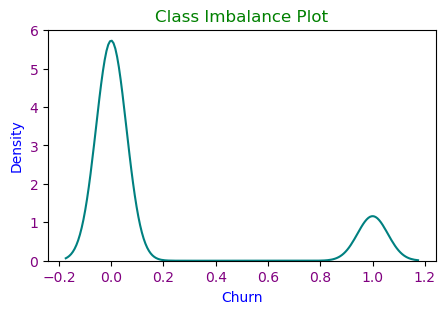

In [166]:
# checking if data is balanced
plt.figure(figsize=(5,3))
sns.kdeplot(data=churn_df, x="Churn",color='teal')
plt.title("Class Imbalance Plot",color='green')
plt.xlabel("Churn",color='blue')
plt.ylabel("Density",color='blue')
plt.xticks(color='purple')
plt.yticks(color='purple')
plt.show()

* Here the distribution of Target variable is Skewed.
* In the Target feature 'Churn' there is a Significant data imbalance,with a Majority class of 83.16% and a Minority class of 16.83% .
* To handle this class imbalance, an Up-sampling process is carried out where Synthetically generated data points corresponding to minority class are injected into the datasets.
* We can use SMOTE technique for balancing the Data.

In [167]:
churn_df.Churn.value_counts(normalize=True)

Churn
0    0.831616
1    0.168384
Name: proportion, dtype: float64

### b) Any business insights using clustering  (if applicable).

* Maximum Customers Prefers Moblie as their Login Device.
* Since Churners are more in Cluster-2, Providing special offers and discounts to cluster-2 customers can decrease the churn rate.
* Some offers should be given for making payment through UPI payment mode to increase its use cluster-0 & Cluster-2.
* E-Wallet payment mode should be provided with offers in cluster-0.
* Maximum churners use Debit card as payment mode across clusters.
* More Churners belong to Regular plus account across clusters.
* Some promotional offers should be given to these customers so that they dom't Churn.
* It is observed that the newly joined customers having low Tenure Churns most,so more concern should be given to the newly joined customers and their cause of churning should be figured out.

### c) Any other business insights.

* Introducing Personalized offers or Promotions can decrease Churn rate.
* Tier-1 customers have high churn rate, suggesting some incentives or discounted offer can help in Retaining customers.
* UPI and E-wallet payment mode should be encouraged to increase customers.
* Tenure period should me Maximized to Retain the customers.
* Customer care services should be improvised so that the customers complaint can be resolved quickly and efficiently.
* Customozed services should be offered to different account segment customers to retain customers.
* Launch tailoring offers to multi user account holders to retain customers.


## ----------------------------------------------**Capstone Project Note - 2**----------------------------------------

## 1). Model building and interpretation

### a. Build various models (You can choose to build models for either or all of descriptive, predictive or prescriptive purposes)

### b. Test your predictive model against the test set using various appropriate performance metrics

### c.Interpretation of the model(s)


## 2). Model Tuning and business implication

### a.Ensemble modelling, wherever applicable

### b. Any other model tuning measures(if applicable)

### c. Interpretation of the most optimum model and its implication on the business

**Loading the Dataset**

In [2]:
model_df_sc = pd.read_excel("churn_df_clean_scaled.xlsx")

In [3]:
model_df_sc.head()

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device,Churn
0,0.108108,1.0,0.054054,0.50,0,0.75,0.50,0.75,0.25,1.0,0.666667,1,0.291667,0.285714,0.344828,0.435907,1,1
1,0.000000,0.0,0.108108,1.00,1,0.75,0.75,0.50,0.50,1.0,0.500000,1,0.458333,0.000000,0.000000,0.238466,1,1
2,0.000000,0.0,0.702703,0.50,1,0.50,0.75,0.50,0.50,1.0,0.416667,1,0.416667,0.000000,0.206897,0.462819,1,1
3,0.000000,1.0,0.297297,0.50,1,0.50,0.75,0.75,1.00,1.0,0.583333,0,0.791667,0.000000,0.206897,0.305089,1,1
4,0.000000,0.0,0.216216,0.25,1,0.50,0.50,0.50,1.00,1.0,0.166667,0,0.291667,0.285714,0.206897,0.282477,1,1


**Splitting the data into Train Test Split:**

In [4]:
X = model_df_sc.drop('Churn',axis=1)
y = model_df_sc['Churn']

**Train-Test Split**

In [5]:
from sklearn.model_selection import train_test_split

In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42,stratify=model_df_sc['Churn'])

In [7]:
print("Shape of X_train :",X_train.shape)
print("Shape of X_test :",X_test.shape)
print("Shape of y_train :",y_train.shape)
print("Shape of y_test :",y_test.shape)

Shape of X_train : (7882, 17)
Shape of X_test : (3378, 17)
Shape of y_train : (7882,)
Shape of y_test : (3378,)


In [8]:
y_train.value_counts(normalize=True)

Churn
0    0.831642
1    0.168358
Name: proportion, dtype: float64

In [9]:
y_test.value_counts(normalize=True)

Churn
0    0.831557
1    0.168443
Name: proportion, dtype: float64

### Treating target imbalance using SMOTE

In [10]:
from imblearn.over_sampling import SMOTE 

In [11]:
sm = SMOTE(random_state=42, sampling_strategy = .75)
X_train_smote, y_train_smote = sm.fit_resample(X_train, y_train)

In [12]:
y_train_smote.value_counts(1)

Churn
0    0.571441
1    0.428559
Name: proportion, dtype: float64

## Logistic Regression Model

In [13]:
from sklearn.linear_model import LogisticRegression

In [14]:
lgt_model = LogisticRegression(solver='newton-cg',max_iter=10000,penalty=None,verbose=True,n_jobs=-1,random_state=42)
lgt_model.fit(X_train,y_train)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    4.0s finished


LogisticRegression(max_iter=10000, n_jobs=-1, penalty=None, random_state=42,
                   solver='newton-cg', verbose=True)

**Accuracy of Training and Test Data.**

In [15]:
print("Accuracy of the Training Data: ",lgt_model.score(X_train,y_train))
print("Accuracy of the Test Data: ",lgt_model.score(X_test,y_test))

Accuracy of the Training Data:  0.8822633849276833
Accuracy of the Test Data:  0.8875074008288928


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predicting on Training and Test dataset:**

In [16]:
ytrain_pred = lgt_model.predict(X_train)
ytest_pred = lgt_model.predict(X_test)

**Classification Report**

In [17]:
print("Classification Report of the Training data:\n\n",metrics.classification_report(y_train,ytrain_pred),'\n')
print("Classification Report of the Test data:\n\n",metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.90      0.97      0.93      6555
           1       0.75      0.45      0.56      1327

    accuracy                           0.88      7882
   macro avg       0.82      0.71      0.75      7882
weighted avg       0.87      0.88      0.87      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.90      0.97      0.93      2809
           1       0.78      0.47      0.58       569

    accuracy                           0.89      3378
   macro avg       0.84      0.72      0.76      3378
weighted avg       0.88      0.89      0.88      3378



**Insights:**

**---------------------------------------------Test set-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 89%.
        * 89% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 47% and Recall for class 0(Non-churn) is 97%.
        * 47% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,47% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 97% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 78% and for class 0(Non-Churne) is 90%.
        * 78% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 90% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix : Train dataset**

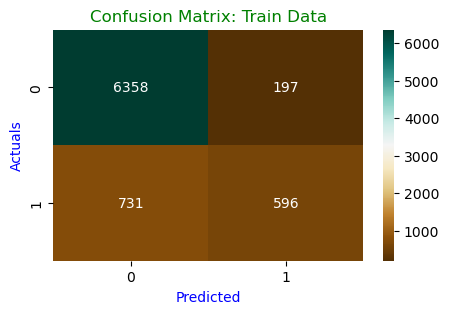

In [18]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Matrix: Train Data",color='green');

**Confusion Matrix : Test Dataset**

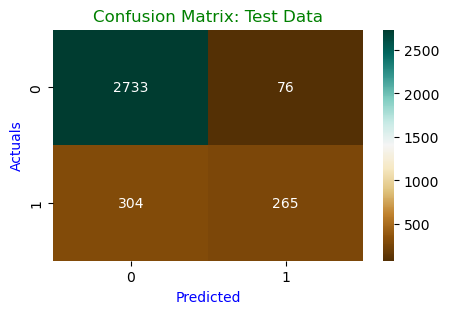

In [19]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Matrix: Test Data",color='green');

**AUC and ROC Curve : Training data:**

In [20]:
from sklearn.metrics import roc_auc_score

AUC: 0.870


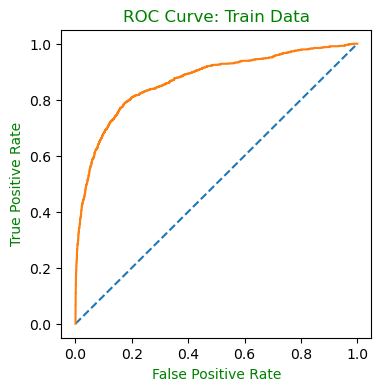

In [21]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = lgt_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_train,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train,probs)
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve: Train Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.plot(train_fpr,train_tpr);

AUC: 0.866


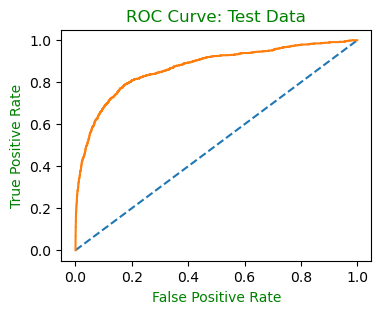

In [22]:
plt.figure(figsize=(4,3))
# predict probabilities
probs = lgt_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
test_auc = roc_auc_score(y_test,probs)
print('AUC: %.3f' % test_auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve: Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.plot(train_fpr,train_tpr);

**Observations:**

* AUC for Train data is 87% and AUC for Test data is 86%.
* The AUC  & ROC curve  shows that  is covering almost the same area for Train and Test data. Therefore, this can be considered   a good optimized model. 


### Comparison Table

In [23]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train,lgt_model.predict_proba(X_train)[:,1]),
                          'auc_Test':roc_auc_score(y_test,lgt_model.predict_proba(X_test)[:,1])},index=['Logistic Regression'])
resultsDf

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.86968,0.866379


## Building Logistic regression model on Balanced dataset using SMOTE

In [24]:
lgt_smote = LogisticRegression(random_state=42)
lgt_smote.fit(X_train_smote,y_train_smote)

LogisticRegression(random_state=42)

**Accuracy of Training and Test Data.**

In [25]:
print("Accuracy of the Training Data: ",lgt_smote.score(X_train_smote,y_train_smote))
print("Accuracy of the Test Data: ",lgt_smote.score(X_test,y_test))

Accuracy of the Training Data:  0.8136169470839508
Accuracy of the Test Data:  0.8155713439905269


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [26]:
ytrain_pred = lgt_smote.predict(X_train_smote)
ytest_pred = lgt_smote.predict(X_test)

**Classification Report**

In [27]:
print("Classification Report of the Training data:\n\n",metrics.classification_report(y_train_smote,ytrain_pred),'\n')
print("Classification Report of the Test data:\n\n",metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.84      0.83      0.84      6555
           1       0.78      0.79      0.78      4916

    accuracy                           0.81     11471
   macro avg       0.81      0.81      0.81     11471
weighted avg       0.81      0.81      0.81     11471
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.95      0.82      0.88      2809
           1       0.47      0.77      0.58       569

    accuracy                           0.82      3378
   macro avg       0.71      0.80      0.73      3378
weighted avg       0.87      0.82      0.83      3378



**Insights:**

**---------------------------------------------Test set Smote Data-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 82%.
        * 82% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 77% and Recall for class 0(Non-churn) is 82%.
        * 77% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,77% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 82% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 47% and for class 0(Non-Churne) is 95%.
        * 47% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 95% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

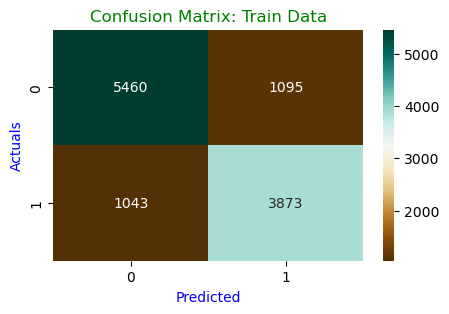

In [28]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_train_smote,ytrain_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Matrix: Train Data",color='green');

<Figure size 500x300 with 0 Axes>

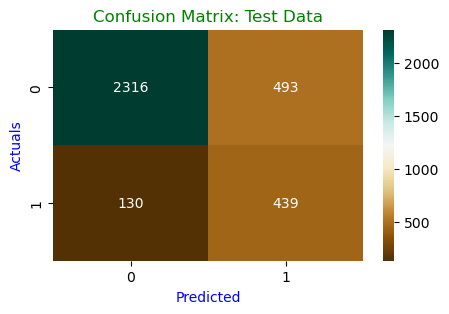

<Figure size 500x300 with 0 Axes>

In [29]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Matrix: Test Data",color='green');plt.figure(figsize=(5,3))

**Measuring and Plotting AUC-ROC Curve**

AUC for the Training Data: 0.877
AUC for the Test Data: 0.865


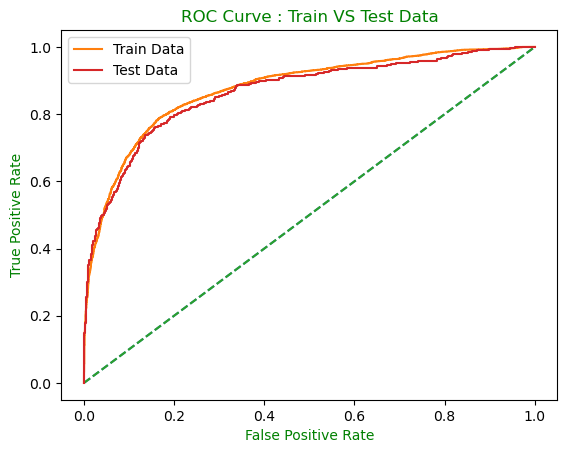

In [30]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = lgt_smote.predict_proba(X_train_smote)[:,1]
auc = metrics.roc_auc_score(y_train_smote,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train_smote,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data')

# AUC and ROC for the test data

# calculate AUC
probs1 = lgt_smote.predict_proba(X_test)[:,1]
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label='Test Data')

plt.title("ROC Curve : Train VS Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 87% and AUC for Test data is 86%.
* The AUC  & ROC curve  shows that  is covering almost the same area for Train and Test data. Therefore, this can be considered   a good Generalized model. 


In [31]:
resultsDf1 = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train_smote,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train_smote,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train_smote, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train_smote,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train_smote,lgt_smote.predict_proba(X_train_smote)[:,1]),
                          'auc_Test':roc_auc_score(y_test,lgt_smote.predict_proba(X_test)[:,1])},index=['Logistic Regression Smote' ])
Metrices_table = pd.concat([resultsDf,resultsDf1],axis=0)
Metrices_table
#resultsDf1

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381


## Hyperparameter Tuning

### Applying GridSearchCV for Logistic Regression:

In [32]:
from sklearn.model_selection import GridSearchCV

In [33]:
grid = {'penalty':['l2'],
        'solver':['newton-cg','liblinear','lbfgs','sag'],
        'tol':[0.0001,0.00001]}

In [34]:
grid_search = GridSearchCV(estimator=lgt_model,param_grid=grid,cv=5,n_jobs=-1,scoring='f1',verbose=1)
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.2s finished


GridSearchCV(cv=5,
             estimator=LogisticRegression(max_iter=10000, n_jobs=-1,
                                          penalty=None, random_state=42,
                                          solver='newton-cg', verbose=True),
             n_jobs=-1,
             param_grid={'penalty': ['l2'],
                         'solver': ['newton-cg', 'liblinear', 'lbfgs', 'sag'],
                         'tol': [0.0001, 1e-05]},
             scoring='f1', verbose=1)

In [35]:
print(grid_search.best_params_,"\n")
print(grid_search.best_estimator_)

{'penalty': 'l2', 'solver': 'newton-cg', 'tol': 0.0001} 

LogisticRegression(max_iter=10000, n_jobs=-1, random_state=42,
                   solver='newton-cg', verbose=True)


**Building model on Best parameters**

In [36]:
best_model_lgt = grid_search.best_estimator_
best_model_lgt.fit(X_train,y_train)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.1s finished


LogisticRegression(max_iter=10000, n_jobs=-1, random_state=42,
                   solver='newton-cg', verbose=True)

**Accuracy of Train and Test data**

In [37]:
print("Accuracy on Train Data: ",best_model_lgt.score(X_train,y_train))
print("Accuracy on Test Data: ",best_model_lgt.score(X_test,y_test))

Accuracy on Train Data:  0.8818827708703375
Accuracy on Test Data:  0.8895796329188869


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [38]:
ytrain_pred = best_model_lgt.predict(X_train)
ytest_pred = best_model_lgt.predict(X_test)

**Classification Report**

In [39]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.89      0.97      0.93      6555
           1       0.76      0.44      0.55      1327

    accuracy                           0.88      7882
   macro avg       0.83      0.70      0.74      7882
weighted avg       0.87      0.88      0.87      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.90      0.98      0.94      2809
           1       0.80      0.46      0.58       569

    accuracy                           0.89      3378
   macro avg       0.85      0.72      0.76      3378
weighted avg       0.88      0.89      0.88      3378



**Insights:**

**---------------------------------------------Test set Tuned Model-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 89%.
        * 89% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 46% and Recall for class 0(Non-churn) is 98%.
        * 46% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,46% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 98% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 80% and for class 0(Non-Churne) is 90%.
        * 80% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 90% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

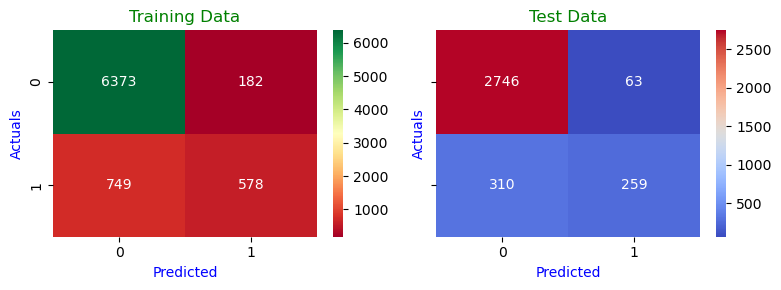

In [40]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**Measuring and Plotting AUC-ROC Curve**

AUC for the Training Data: 0.869
AUC for the Test Data: 0.866


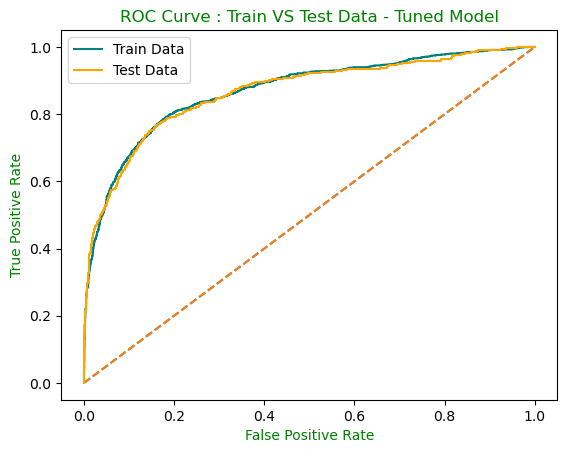

In [41]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = best_model_lgt.predict_proba(X_train)[:,1]
auc = metrics.roc_auc_score(y_train,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = best_model_lgt.predict_proba(X_test)[:,1]
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data - Tuned Model",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 86% and AUC for Test data is 86%.
* The AUC  & ROC curve  shows that  is covering almost the same area for Train and Test data. Therefore, this can be considered   a good optimized model. 


**Comparison Table**

In [42]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train,best_model_lgt.predict_proba(X_train)[:,1]),
                          'auc_Test':roc_auc_score(y_test,best_model_lgt.predict_proba(X_test)[:,1])},index=['Logistic Regression Tuned'])
#resultsDf
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858


**Insights**

* Accuarcy is almost same for Base and Tuned Model for Logistic Regression.
* Accuracy on Smote Dataset is less than Base and Tuned Model.

## Model building on Important features

In [43]:
imp_feature_df = pd.read_excel("imp_features_scaled.xlsx")
imp_feature_df.head(2)

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,coupon_used_for_payment,Day_Since_CC_connect,Login_device,Churn
0,0.108108,1.0,0.054054,0.5,0,0.75,0.25,1.0,0.666667,1,0.285714,0.344828,1,1
1,0.000000,0.0,0.108108,1.0,1,0.50,0.50,1.0,0.500000,1,0.000000,0.000000,1,1


In [44]:
X_imp = imp_feature_df.drop('Churn',axis=1)
y_imp = imp_feature_df['Churn']

In [45]:
X_train_imp, X_test_imp, y_train_imp, y_test_imp = train_test_split(X_imp, y_imp, test_size=0.30, random_state=42,stratify=y)

In [46]:
print("Shape of X_train :",X_train_imp.shape)
print("Shape of X_test :",X_test_imp.shape)
print("Shape of y_train :",y_train_imp.shape)
print("Shape of y_test :",y_test_imp.shape)

Shape of X_train : (7882, 13)
Shape of X_test : (3378, 13)
Shape of y_train : (7882,)
Shape of y_test : (3378,)


In [47]:
display(y_train_imp.value_counts(1))
display(y_test_imp.value_counts(1))


Churn
0    0.831642
1    0.168358
Name: proportion, dtype: float64

Churn
0    0.831557
1    0.168443
Name: proportion, dtype: float64

In [48]:
lgt_imp = LogisticRegression()
lgt_imp.fit(X_train_imp,y_train_imp)

LogisticRegression()

**Accuracy of Train and Test data:**

In [49]:
print("Accuracy of the Training Data: ",lgt_imp.score(X_train_imp,y_train_imp))
print("Accuracy of the Test Data: ",lgt_imp.score(X_test_imp,y_test_imp))

Accuracy of the Training Data:  0.8798528292311596
Accuracy of the Test Data:  0.8833629366489046


In [50]:
ytrain_pred = lgt_imp.predict(X_train_imp)
ytest_pred = lgt_imp.predict(X_test_imp)

In [51]:
print('Classification Report of the training data:\n\n',metrics.classification_report(y_train_imp,ytrain_pred),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(y_test_imp,ytest_pred),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0       0.89      0.97      0.93      6555
           1       0.75      0.42      0.54      1327

    accuracy                           0.88      7882
   macro avg       0.82      0.70      0.74      7882
weighted avg       0.87      0.88      0.87      7882
 

Classification Report of the test data:

               precision    recall  f1-score   support

           0       0.89      0.98      0.93      2809
           1       0.78      0.43      0.55       569

    accuracy                           0.88      3378
   macro avg       0.84      0.70      0.74      3378
weighted avg       0.87      0.88      0.87      3378
 



**Insights:**

**---------------------------------------------Test set Imp Features-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 88%.
        * 88% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 43% and Recall for class 0(Non-churn) is 98%.
        * 43% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,43% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 98% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 78% and for class 0(Non-Churne) is 89%.
        * 78% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 89% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

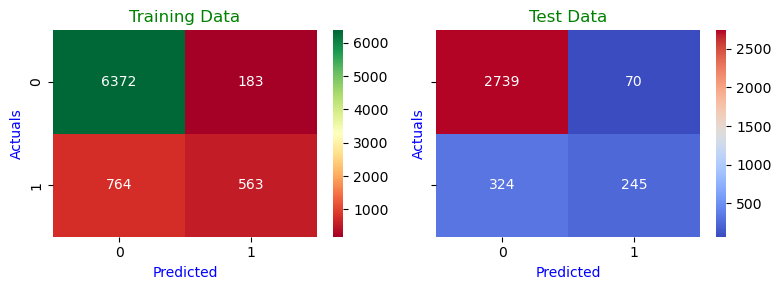

In [52]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train_imp,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test_imp,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

AUC for the Training Data: 0.866
AUC for the Test Data: 0.862


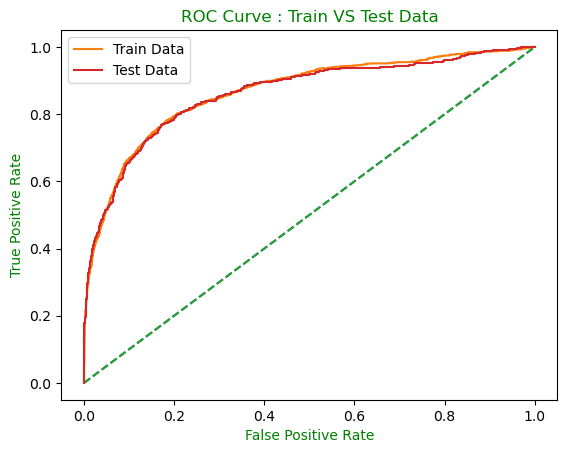

In [53]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = lgt_imp.predict_proba(X_train_imp)[:,1]
auc = metrics.roc_auc_score(y_train_imp,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train_imp,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data')

# AUC and ROC for the test data

# calculate AUC
probs1 = lgt_imp.predict_proba(X_test_imp)[:,1]
auc = metrics.roc_auc_score(y_test_imp,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test_imp,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label='Test Data')

plt.title("ROC Curve : Train VS Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 86% and AUC for Test data is 86%.
* The AUC  & ROC curve  shows that  is covering almost the same area for Train and Test data. Therefore, this can be considered   a good optimized model. 


**Note**

* The Accuracy of Train and Test data is same for model with Important Features and with Complete dataset.
* So we will build all oure models on Complete Datasets only.

## Linear Discriminant Analysis

In [54]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [55]:
lda_model = LinearDiscriminantAnalysis()
lda_model.fit(X_train,y_train)

LinearDiscriminantAnalysis()

**Accuracy of Train and Test data:**

In [56]:
print("Accuracy of the Training Data: ",lda_model.score(X_train,y_train))
print("Accuracy of the Test Data: ",lda_model.score(X_test,y_test))

Accuracy of the Training Data:  0.8763004313625983
Accuracy of the Test Data:  0.8804026050917703


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions on Train and Test dataset**

In [57]:
ytrain_pred = lda_model.predict(X_train)
ytest_pred = lda_model.predict(X_test)

**Classification Report**

In [58]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.89      0.97      0.93      6555
           1       0.75      0.40      0.52      1327

    accuracy                           0.88      7882
   macro avg       0.82      0.69      0.73      7882
weighted avg       0.87      0.88      0.86      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.89      0.98      0.93      2809
           1       0.78      0.40      0.53       569

    accuracy                           0.88      3378
   macro avg       0.84      0.69      0.73      3378
weighted avg       0.87      0.88      0.86      3378



**Insights:**

**---------------------------------------------Test set-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 88%.
        * 88% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 40% and Recall for class 0(Non-churn) is 98%.
        * 40% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,40% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 98% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 78% and for class 0(Non-Churne) is 89%.
        * 78% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 89% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

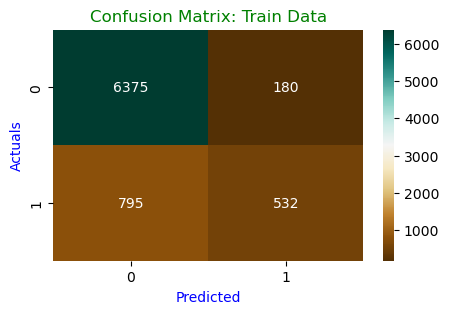

In [59]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.title("Confusion Matrix: Train Data",color='green')
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');

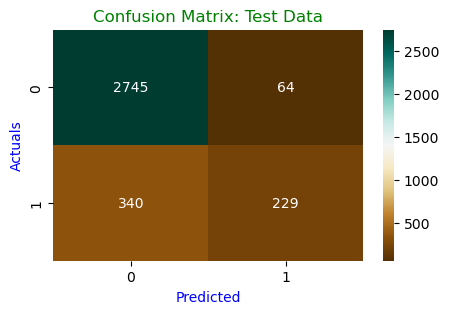

In [60]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.title("Confusion Matrix: Test Data",color='green')
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');

**AUC - ROC Curve : Train Data**

AUC: 0.858


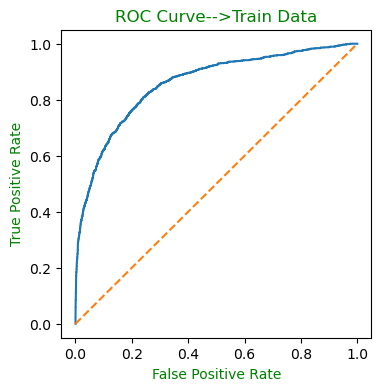

In [61]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = lda_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_train,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Train Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**AUC - ROC Curve : Test Data**

AUC: 0.857


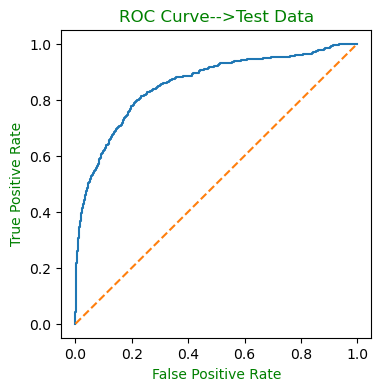

In [62]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = lda_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_test,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_test,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**Observations:**

* AUC for Train data is 85% and AUC for Test data is 85%.
* The AUC  & ROC curve  shows that  is covering almost the same area for Train and Test data. Therefore, this can be considered   a good optimized model. 


**Comparison Table**

In [63]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train,lda_model.predict_proba(X_train)[:,1]),
                          'auc_Test':roc_auc_score(y_test,lda_model.predict_proba(X_test)[:,1])},index=['LDA' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table
#resultsDf1

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028


## Building LDA model on balanced dataset using SMOTE

In [64]:
lda_smote = LinearDiscriminantAnalysis()
lda_smote.fit(X_train_smote,y_train_smote)

LinearDiscriminantAnalysis()

**Accuracy of Train and Test data:**

In [65]:
print("Accuracy of the Training Data: ",lda_smote.score(X_train_smote,y_train_smote))
print("Accuracy of the Test Data: ",lda_smote.score(X_test,y_test))

Accuracy of the Training Data:  0.800540493418185
Accuracy of the Test Data:  0.7960331557134399


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [66]:
ytrain_pred = lda_smote.predict(X_train_smote)
ytest_pred = lda_smote.predict(X_test)

**Classification Report**

In [67]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train_smote,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.83      0.81      0.82      6555
           1       0.76      0.78      0.77      4916

    accuracy                           0.80     11471
   macro avg       0.80      0.80      0.80     11471
weighted avg       0.80      0.80      0.80     11471
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.95      0.80      0.87      2809
           1       0.44      0.78      0.56       569

    accuracy                           0.80      3378
   macro avg       0.69      0.79      0.71      3378
weighted avg       0.86      0.80      0.82      3378



**Insights:**

**---------------------------------------------Test set Smote Data-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 80%.
        * 80% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 78% and Recall for class 0(Non-churn) is 80%.
        * 78% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,78% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 80% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 44% and for class 0(Non-Churne) is 95%.
        * 44% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 95% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix : Train Data**

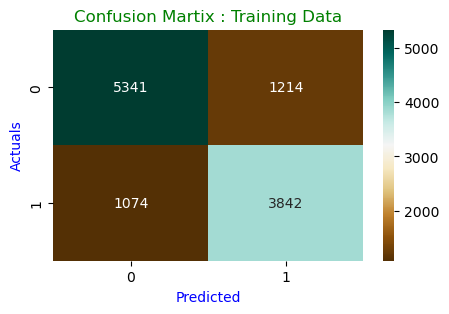

In [68]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_train_smote,ytrain_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Martix : Training Data",color='green');

**Confusion Matrix : Test Data**

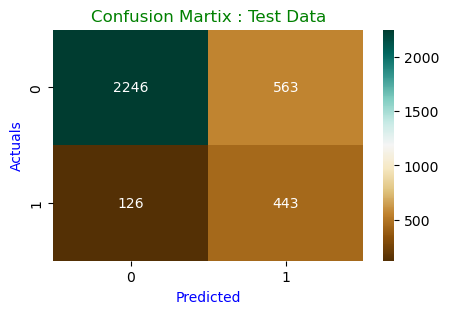

In [69]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Martix : Test Data",color='green');

**AUC - ROC Curve : Train Data**

AUC: 0.873


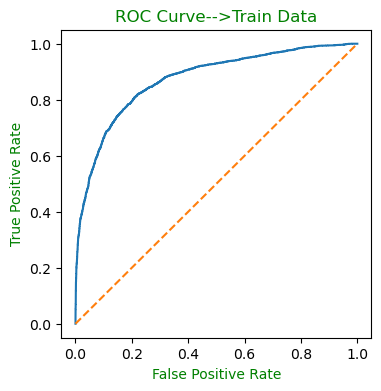

In [70]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = lda_smote.predict_proba(X_train_smote)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_train_smote,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train_smote,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Train Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**AUC - ROC Curve : Test Data**

AUC: 0.863


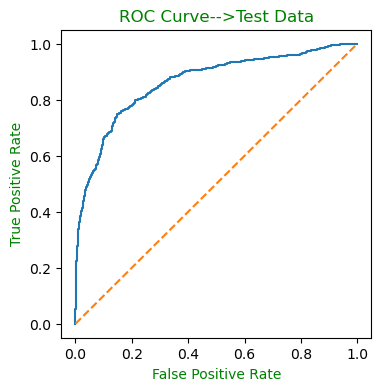

In [71]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = lda_smote.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_test,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_test,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**Observations:**

* AUC for Train data is 87% and AUC for Test data is 86%.
* The AUC  & ROC curve  shows that  is covering almost the same area for Train and Test data. Therefore, this can be considered   a good optimized model. 


**Comparison Table**

In [72]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train_smote,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train_smote,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train_smote, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train_smote,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train_smote,lda_smote.predict_proba(X_train_smote)[:,1]),
                          'auc_Test':roc_auc_score(y_test,lda_smote.predict_proba(X_test)[:,1])},index=['LDA Smote' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309


## Building LDA model using GridSearchCV

In [73]:
param_grid = { 'solver': [ 'lsqr', 'eigen'],
               'tol' : [0.0001,0.0002,0.0003],
               'shrinkage' : ['auto', 'None'],
    
              }    

In [74]:
grid_search = GridSearchCV(estimator = lda_model, param_grid = param_grid, cv = 10, n_jobs=-1,scoring='f1')
grid_search.fit(X_train,y_train)

C:\Users\USER\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
60 fits failed out of a total of 120.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
60 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\USER\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\USER\anaconda3\Lib\site-packages\sklearn\discriminant_analysis.py", line 571, in fit
    self._validate_params()
  File "C:\Users\USER\anaconda3\Lib\site-packages\sklearn\base.py", line 600, in _validate_params
    validate_parameter_constraints(
  File "C:\Users\USER\anaconda3\Lib\site-packag

GridSearchCV(cv=10, estimator=LinearDiscriminantAnalysis(), n_jobs=-1,
             param_grid={'shrinkage': ['auto', 'None'],
                         'solver': ['lsqr', 'eigen'],
                         'tol': [0.0001, 0.0002, 0.0003]},
             scoring='f1')

In [75]:
# getting best parameters used out of all the combinations given in grid search
print(grid_search.best_params_)
print(grid_search.best_estimator_)

{'shrinkage': 'auto', 'solver': 'lsqr', 'tol': 0.0001}
LinearDiscriminantAnalysis(shrinkage='auto', solver='lsqr')


**Building model on Best parameters**

In [76]:
best_model_lda = grid_search.best_estimator_
best_model_lda.fit(X_train,y_train)

LinearDiscriminantAnalysis(shrinkage='auto', solver='lsqr')

**Accuracy of Train and Test Data**

In [77]:
print("Accuracy on Train Data: ",best_model_lda.score(X_train,y_train))
print("Accuracy on Test Data: ",best_model_lda.score(X_test,y_test))

Accuracy on Train Data:  0.8768079167723928
Accuracy on Test Data:  0.8804026050917703


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [78]:
ytrain_pred = best_model_lda.predict(X_train)
ytest_pred = best_model_lda.predict(X_test)

**Classification Report**

In [79]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.89      0.97      0.93      6555
           1       0.75      0.40      0.52      1327

    accuracy                           0.88      7882
   macro avg       0.82      0.69      0.73      7882
weighted avg       0.87      0.88      0.86      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.89      0.98      0.93      2809
           1       0.78      0.40      0.53       569

    accuracy                           0.88      3378
   macro avg       0.84      0.69      0.73      3378
weighted avg       0.87      0.88      0.86      3378



**Insights:**

**---------------------------------------------Test set Tuned Model-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 88%.
        * 88% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 40% and Recall for class 0(Non-churn) is 98%.
        * 40% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,40% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 98% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 78% and for class 0(Non-Churne) is 89%.
        * 78% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 89% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

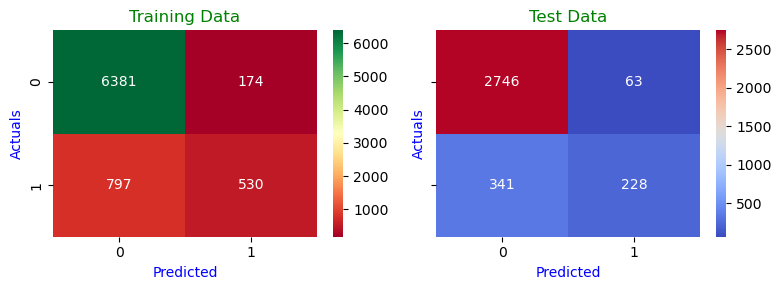

In [80]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**Measuring and Plotting AUC-ROC Curve**

AUC for the Training Data: 0.858
AUC for the Test Data: 0.857


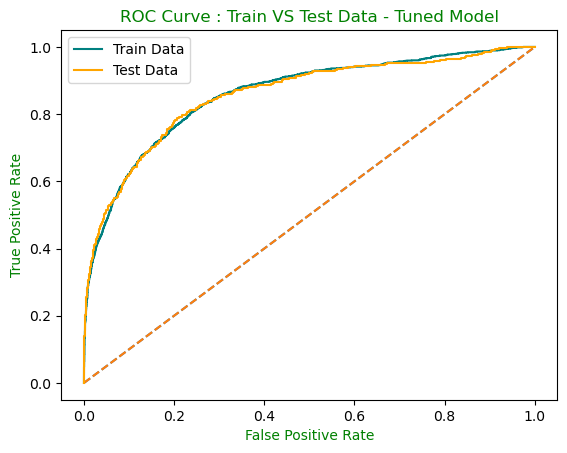

In [81]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = best_model_lda.predict_proba(X_train)[:,1]
auc = metrics.roc_auc_score(y_train,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = best_model_lda.predict_proba(X_test)[:,1]
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data - Tuned Model",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 85% and AUC for Test data is 85%.
* The AUC  & ROC curve  shows that  is covering almost the same area for Train and Test data. Therefore, this can be considered   a good optimized model. 


**Comparison Table**

In [82]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train,best_model_lda.predict_proba(X_train)[:,1]),
                          'auc_Test':roc_auc_score(y_test,best_model_lda.predict_proba(X_test)[:,1])},index=['LDA Tuned' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971


**Observations**

* For LDA Model, Accuracy and AUC score are almost same for Base and Tuned model.
* Model build on balanced dataset have much less accuracy than Base and Tuned model but AUC score is slightly more than Base and Tuned Model.

## Support Vector Classifier (SVC)

In [83]:
from sklearn import svm

In [84]:
svc_model = svm.SVC(kernel='linear',random_state=42)
svc_model.fit(X_train,y_train)

SVC(kernel='linear', random_state=42)

**Accuracy of Train and Test data:**

In [85]:
print("Accuracy of the Training Data: ",svc_model.score(X_train,y_train))
print("Accuracy of the Test Data: ",svc_model.score(X_test,y_test))

Accuracy of the Training Data:  0.8828977416899264
Accuracy of the Test Data:  0.8872113676731794


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [86]:
ytrain_pred = svc_model.predict(X_train)
ytest_pred = svc_model.predict(X_test)

**Classification Report**

In [87]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.89      0.98      0.93      6555
           1       0.80      0.40      0.54      1327

    accuracy                           0.88      7882
   macro avg       0.85      0.69      0.73      7882
weighted avg       0.88      0.88      0.87      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.89      0.98      0.94      2809
           1       0.83      0.41      0.55       569

    accuracy                           0.89      3378
   macro avg       0.86      0.70      0.74      3378
weighted avg       0.88      0.89      0.87      3378



**Insights:**

**---------------------------------------------Test set-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 89%.
        * 89% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 41% and Recall for class 0(Non-churn) is 98%.
        * 41% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,41% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 98% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 83% and for class 0(Non-Churne) is 89%.
        * 83% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 89% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**


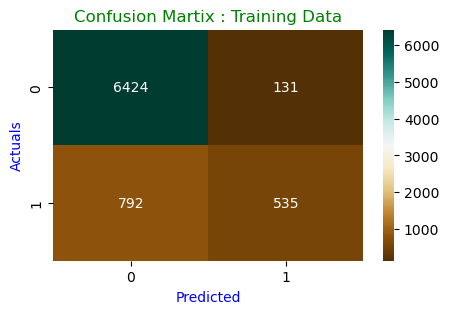

In [88]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Martix : Training Data",color='green');

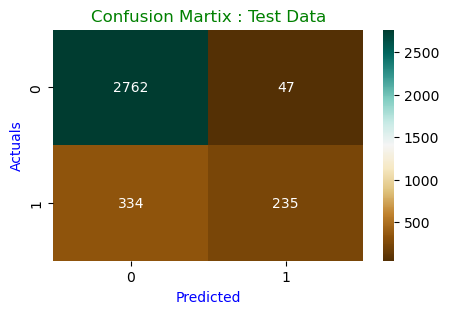

In [89]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Martix : Test Data",color='green');

**AUC - ROC Curve : Train Data**

AUC of Training Data: 0.692


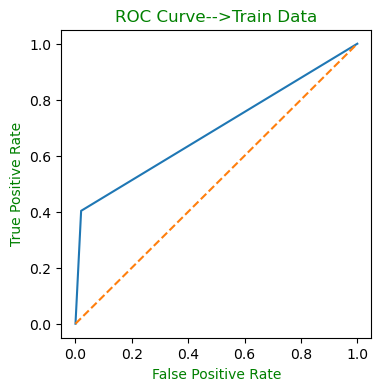

In [90]:
plt.figure(figsize=(4,4))
# Gettin the predictions in terms of probability 
probs = svc_model.predict(X_train)
# AUC score
auc = roc_auc_score(y_train, probs)
print("AUC of Training Data: {:.3f}".format(auc))
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train,probs)
# plot the roc curve for the model
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
plt.title("ROC Curve-->Train Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show();

**AUC - ROC Curve : Test data**

AUC of Test Data: 0.698


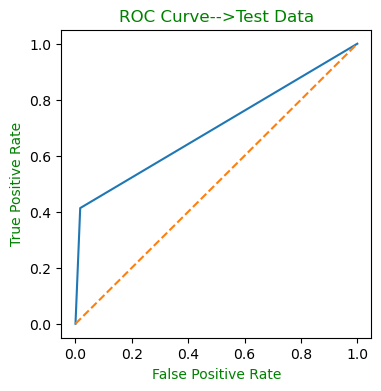

In [91]:
plt.figure(figsize=(4,4))
# Gettin the predictions in terms of probability 
probs = svc_model.predict(X_test)
# AUC score
auc = roc_auc_score(y_test, probs)
print("AUC of Test Data: {:.3f}".format(auc))
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_test,probs)
# plot the roc curve for the model
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
plt.title("ROC Curve-->Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show();

**Observations:**

* AUC for Train data is 69% and AUC for Test data is 69%.
* The AUC  & ROC curve  shows that  is covering almost the same area for Train and Test data. 
* Since the AUC score is very less as compared to the above models so it not considered a Good Model.

In [92]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train,svc_model.predict(X_train)),
                          'auc_Test':roc_auc_score(y_test,svc_model.predict(X_test))},index=['Support Vector Classifier' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137


## Support Vector Machine on Balanced Dataset

In [93]:
svc_smote = svm.SVC(kernel='linear',random_state=42)
svc_smote.fit(X_train_smote,y_train_smote)

SVC(kernel='linear', random_state=42)

**Accuracy on Train and Test dataset**

In [94]:
print("Accuracy of the Training Data: ",svc_smote.score(X_train_smote,y_train_smote))
print("Accuracy of the Test Data: ",svc_smote.score(X_test,y_test))

Accuracy of the Training Data:  0.8172783541103653
Accuracy of the Test Data:  0.8164594434576673


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [95]:
ytrain_pred = svc_smote.predict(X_train_smote)
ytest_pred = svc_smote.predict(X_test)

**Classification Report**

In [96]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train_smote,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred),'\n')

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.85      0.83      0.84      6555
           1       0.78      0.80      0.79      4916

    accuracy                           0.82     11471
   macro avg       0.81      0.81      0.81     11471
weighted avg       0.82      0.82      0.82     11471
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.95      0.82      0.88      2809
           1       0.47      0.78      0.59       569

    accuracy                           0.82      3378
   macro avg       0.71      0.80      0.74      3378
weighted avg       0.87      0.82      0.83      3378
 



**Insights:**

**---------------------------------------------Test set Smote Data-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 82%.
        * 82% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 78% and Recall for class 0(Non-churn) is 82%.
        * 78% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,78% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 82% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 47% and for class 0(Non-Churne) is 95%.
        * 47% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 95% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

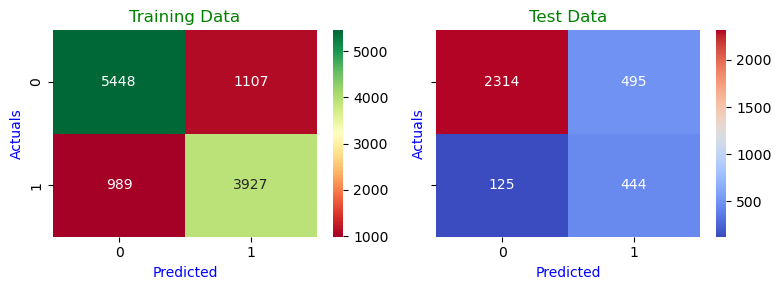

In [97]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train_smote,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**AUC - ROC Curve**

AUC for the Training Data: 0.815
AUC for the Test Data: 0.802


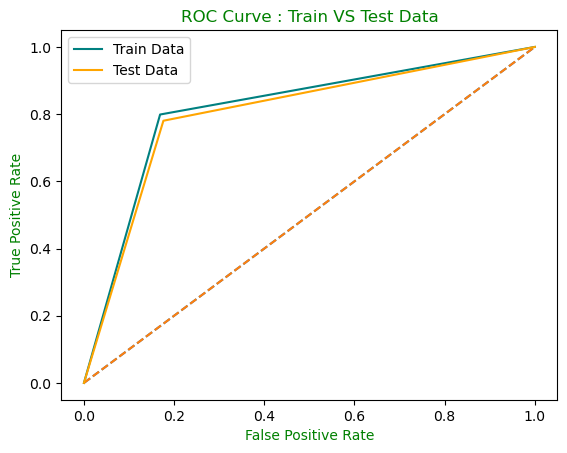

In [98]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = svc_smote.predict(X_train_smote)
auc = metrics.roc_auc_score(y_train_smote,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train_smote,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = svc_smote.predict(X_test)
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 81% and AUC for Test data is 80%.
* The AUC  & ROC curve  shows that  is covering almost the same area for Train and Test data. Therefore, this can be considered   a Good optimized model. 


**Comparison Table**

In [99]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train_smote,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train_smote,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train_smote, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train_smote,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train_smote,svc_smote.predict(X_train_smote)),
                          'auc_Test':roc_auc_score(y_test,svc_smote.predict(X_test))},index=['SVC Smote' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049


## Applying GridsearchCV on SVM

In [100]:
param_grid = {
               'kernel': ['linear','rbf','poly'],
               'C': [0.01,0.1,1,10],
               'gamma': [0.01,0.1,0.2],
               'degree': [2,3],
    
             }

In [101]:
grid_search = GridSearchCV(estimator = svc_model, param_grid = param_grid, cv = 5, n_jobs=-1,scoring='f1')
grid_search.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=SVC(kernel='linear', random_state=42), n_jobs=-1,
             param_grid={'C': [0.01, 0.1, 1, 10], 'degree': [2, 3],
                         'gamma': [0.01, 0.1, 0.2],
                         'kernel': ['linear', 'rbf', 'poly']},
             scoring='f1')

In [102]:
print(grid_search.best_params_,"\n")
print(grid_search.best_estimator_)

{'C': 10, 'degree': 2, 'gamma': 0.2, 'kernel': 'rbf'} 

SVC(C=10, degree=2, gamma=0.2, random_state=42)


**Building model on Best parameters**

In [103]:
best_model_svc = grid_search.best_estimator_
best_model_svc.fit(X_train,y_train)

SVC(C=10, degree=2, gamma=0.2, random_state=42)

**Accuracy of Train and Test Data**

In [104]:
print("Accuracy on Train Data: ",best_model_svc.score(X_train,y_train))
print("Accuracy on Test Data: ",best_model_svc.score(X_test,y_test))

Accuracy on Train Data:  0.9340268967267191
Accuracy on Test Data:  0.9129662522202486


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [105]:
ytrain_pred = best_model_svc.predict(X_train)
ytest_pred = best_model_svc.predict(X_test)

**Classification Report**

In [106]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.94      0.99      0.96      6555
           1       0.92      0.66      0.77      1327

    accuracy                           0.93      7882
   macro avg       0.93      0.83      0.87      7882
weighted avg       0.93      0.93      0.93      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.92      0.98      0.95      2809
           1       0.85      0.59      0.70       569

    accuracy                           0.91      3378
   macro avg       0.88      0.78      0.82      3378
weighted avg       0.91      0.91      0.91      3378



**Insights:**

**---------------------------------------------Test set Tuned Model-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 91%.
        * 91% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 59% and Recall for class 0(Non-churn) is 98%.
        * 59% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,59% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 98% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 85% and for class 0(Non-Churne) is 92%.
        * 85% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 92% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

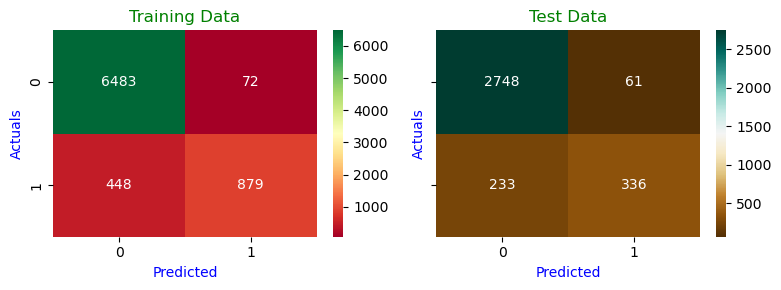

In [107]:
import sklearn.metrics as metrics
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)

#Plotting confusion matrix for the different models for the Training Data     #plasma
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='BrBG',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**Measuring and Plotting AUC-ROC Curve**

AUC for the Training Data: 0.826
AUC for the Test Data: 0.784


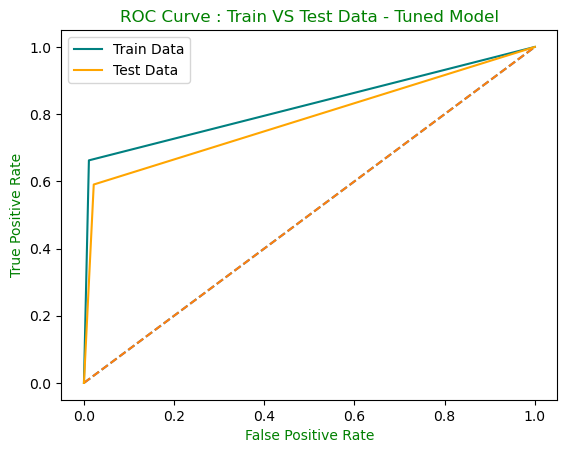

In [108]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = best_model_svc.predict(X_train)
auc = metrics.roc_auc_score(y_train,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = best_model_svc.predict(X_test)
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data - Tuned Model",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 82% and AUC for Test data is 78%.
* From the AUC values & ROC curve for the Train and Test data ,it shows that Test data is not covering a large area as compared   to the train data.
* It is not able to distinguish between Positive and Negative Classes much.

**Comparison Table**

In [109]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train,best_model_svc.predict(X_train)),
                          'auc_Test':roc_auc_score(y_test,best_model_svc.predict(X_test))},index=['SVC Tuned' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397


**Insights**

* SVC Tuned model is giving better accuarcy and more AUC Score than the Base and Smote Model.
* Also, the model is neither overfit nor underfit.

## K-nearest Neighbour (KNN Model)

In [110]:
from sklearn.neighbors import KNeighborsClassifier

In [111]:
# initiantiate learning model (k = 3)

knn = KNeighborsClassifier(n_neighbors=3,metric='euclidean')
# fitting the model
knn_model3 = knn.fit(X_train,y_train)
# evaluate accuracy
print("For K = 3 -------> ")
print("Accuracy Score for Training Data is: ", knn_model3.score(X_train, y_train))
print("Accuracy Score for Test Data is: ", knn_model3.score(X_test, y_test))


# initiantiate learning model (k = 5)
knn = KNeighborsClassifier(n_neighbors = 5,metric='euclidean')
knn_model5 = knn.fit(X_train,y_train)
#print("Accuracy Score for K=5 is ", knn_model.score(X_test, y_test))
print("\nFor K = 5 -------> ")
print("Accuracy Score for Training Data is: ", knn_model5.score(X_train, y_train))
print("Accuracy Score for Test Data is: ", knn_model5.score(X_test, y_test))


# initiantiate learning model (k = 7)
knn = KNeighborsClassifier(n_neighbors = 7,metric='euclidean')
knn_model7 =knn.fit(X_train,y_train)
#print("Accuracy Score for K=7 is ", knn_model.score(X_test, y_test))
print("\nFor K = 7 -------> ")
print("Accuracy Score for Training Data is: ", knn_model7.score(X_train, y_train))
print("Accuracy Score for Test Data is: ", knn_model7.score(X_test, y_test))

# initiantiate learning model (k = 9)
knn = KNeighborsClassifier(n_neighbors=9,metric='euclidean')
knn_model9 = knn.fit(X_train,y_train)
print("\nFor K = 9 -------> ")
print("Accuracy Score for Training Data is: ", knn_model9.score(X_train, y_train))
print("Accuracy Score for Test Data is: ", knn_model9.score(X_test, y_test))

For K = 3 -------> 
Accuracy Score for Training Data is:  0.9836335955341284
Accuracy Score for Test Data is:  0.9552989934872705

For K = 5 -------> 
Accuracy Score for Training Data is:  0.9755138289774169
Accuracy Score for Test Data is:  0.9496743635287153

For K = 7 -------> 
Accuracy Score for Training Data is:  0.9667597056584624
Accuracy Score for Test Data is:  0.9357608052101836

For K = 9 -------> 
Accuracy Score for Training Data is:  0.9517888860695255
Accuracy Score for Test Data is:  0.9212551805802249


* Here K=3 is giving Better Accuracy.

**Building model with K=3 Neighbors.**

**Predictions**

In [112]:
ytrain_pred = knn_model3.predict(X_train)
ytest_pred = knn_model3.predict(X_test)

**Classification Report**

In [113]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.99      0.99      0.99      6555
           1       0.96      0.94      0.95      1327

    accuracy                           0.98      7882
   macro avg       0.98      0.97      0.97      7882
weighted avg       0.98      0.98      0.98      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.97      0.98      0.97      2809
           1       0.89      0.84      0.86       569

    accuracy                           0.96      3378
   macro avg       0.93      0.91      0.92      3378
weighted avg       0.95      0.96      0.95      3378



**Insights:**

**---------------------------------------------Test set KNN_3-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 96%.
        * 96% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 84% and Recall for class 0(Non-churn) is 98%.
        * 84% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,84% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 98% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 89% and for class 0(Non-Churne) is 97%.
        * 89% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 97% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

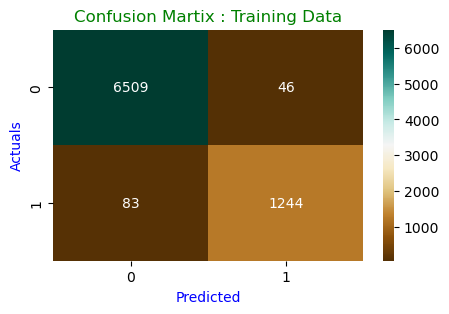

In [114]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Martix : Training Data",color='green');

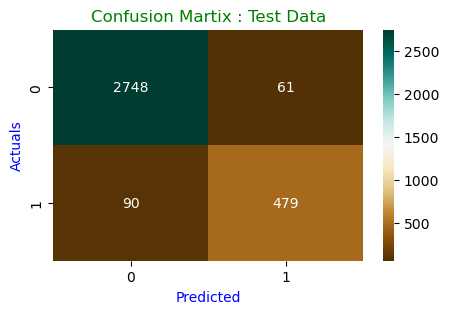

In [115]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Martix : Test Data",color='green');

**AUC - ROC Curve : Train Data**

AUC: 0.998


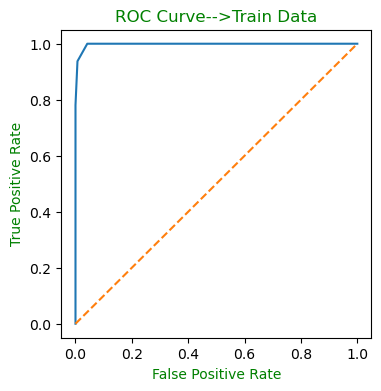

In [116]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = knn_model3.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_train,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Train Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**AUC - ROC Curve : Test Data**

AUC: 0.969


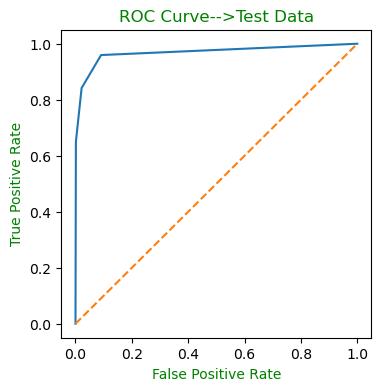

In [117]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = knn_model3.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_test,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_test,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**Observations:**

* AUC for Train data is 99% and AUC for Test data is 96%.
* The AUC  & ROC curve  shows that Test data is covering slightly less than Train data. 
* The AUC score is very high and is able to distinguish between Positive and Negative classes very well.
* This is a Good Generalized Model.

**Comparison Table**

In [118]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train,knn_model3.predict_proba(X_train)[:,1]),
                          'auc_Test':roc_auc_score(y_test,knn_model3.predict_proba(X_test)[:,1])},index=['KNN_3' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


**Cross Validation on KNN**

In [119]:
knn = KNeighborsClassifier(n_neighbors=3)
scores = cross_val_score(knn, X, y, cv=10, scoring='accuracy')
print("Accuracy of each Fold  : \n ",scores)
print("\nAverage score : ",scores.mean())

Accuracy of each Fold  : 
  [0.98134991 0.97690941 0.97868561 0.97602131 0.97602131 0.98312611
 0.97602131 0.97690941 0.97424512 0.96980462]

Average score :  0.9769094138543517


In [120]:
k_range = list(range(1, 25))
k_scores = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X, y, cv=10, scoring='accuracy')
    k_scores.append(scores.mean())
print(k_scores)

[0.9806394316163412, 0.9722912966252221, 0.9769094138543517, 0.9699822380106571, 0.9745115452930729, 0.963854351687389, 0.9654529307282415, 0.9573712255772646, 0.9600355239786855, 0.9466252220248667, 0.9492007104795738, 0.9365008880994672, 0.9400532859680284, 0.9172291296625221, 0.9207815275310833, 0.9104795737122557, 0.914120781527531, 0.9052397868561279, 0.9079928952042629, 0.8993783303730017, 0.9029307282415632, 0.897246891651865, 0.8995559502664298, 0.8929840142095916]


Text(0, 0.5, 'Cross-Validated-Accuracy')

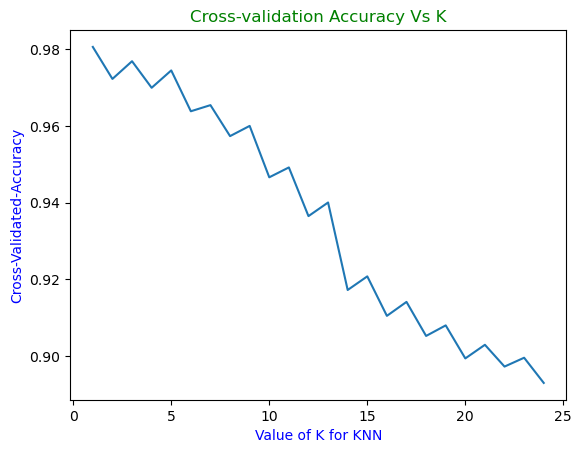

In [121]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(k_range, k_scores)
plt.title("Cross-validation Accuracy Vs K",color='green')
plt.xlabel('Value of K for KNN',color='blue')
plt.ylabel('Cross-Validated-Accuracy',color='blue')

* The above visual representation helps us to understand the accuracy is ~98% for K=1 for KNN.

### Let's Run the KNN with no of neighbours to be 1,3,5..29 and Find the optimal number of neighbours from K=1,3,5,7....29 using the Mis classification error

**Hint: Misclassification error (MCE) = 1 - Test accuracy score. Calculated MCE for each model with neighbours = 1,3,5...29 and find the model with lowest MCE**

In [122]:
# empty list that will hold accuracy scores
ac_scores = []

# perform accuracy metrics for values from 1,3,5....29
for k in range(1,31,2):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    # evaluate test accuracy
    scores = knn.score(X_test, y_test)
    ac_scores.append(scores)

# changing to misclassification error
print("Misclassification Error")
MCE = [1 - x for x in ac_scores]
MCE

Misclassification Error


[0.026346950858496143,
 0.04470100651272946,
 0.05032563647128474,
 0.06423919478981643,
 0.07874481941977507,
 0.0932504440497336,
 0.09917110716400235,
 0.10686796921255182,
 0.11367673179396087,
 0.12226169330965064,
 0.12433392539964472,
 0.12255772646536411,
 0.12581409117821196,
 0.13055062166962694,
 0.1320307874481942]

**Plot misclassification error vs k (with k value on X-axis) using matplotlib**

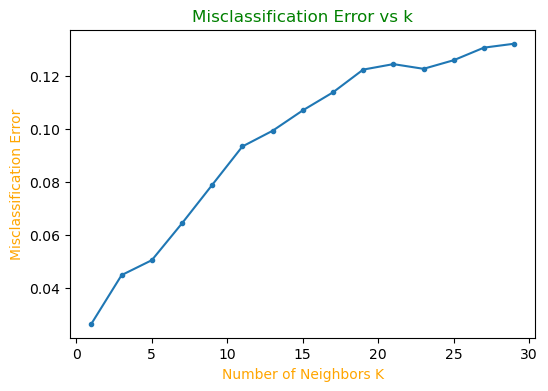

In [123]:
plt.figure(figsize=(6,4))
# plot misclassification error vs k
plt.plot(range(1,31,2), MCE,marker = '.')
plt.title("Misclassification Error vs k",color='green')
plt.xlabel('Number of Neighbors K',color = 'orange')
plt.ylabel('Misclassification Error',color='orange')
plt.show()

**Observations**

* MCE is low for K=1.

**Let's Build model on parameter K=1**

In [124]:
knn_1 = KNeighborsClassifier(n_neighbors=1)
knn_1.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=1)

**Accuracy of Train and Test data**

In [125]:
print("Accuracy of Train data: ",knn_1.score(X_train,y_train))
print("Accuracy of Test data: ",knn_1.score(X_test,y_test))

Accuracy of Train data:  1.0
Accuracy of Test data:  0.9736530491415039


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data doesn't differ much ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [126]:
ytrain_pred = knn_1.predict(X_train)
ytest_pred = knn_1.predict(X_test)

**Classification Report**

In [127]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred),'\n')

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6555
           1       1.00      1.00      1.00      1327

    accuracy                           1.00      7882
   macro avg       1.00      1.00      1.00      7882
weighted avg       1.00      1.00      1.00      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.98      0.98      0.98      2809
           1       0.92      0.92      0.92       569

    accuracy                           0.97      3378
   macro avg       0.95      0.95      0.95      3378
weighted avg       0.97      0.97      0.97      3378
 



**Insights:**

**---------------------------------------------Test set KNN_1-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 97%.
        * 97% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 92% and Recall for class 0(Non-churn) is 98%.
        * 92% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,92% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 98% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 92% and for class 0(Non-Churne) is 98%.
        * 92% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 98% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Note:**

* Here we found that Precission and Recall are same for both the Classes (Churn and Non-Churn).
* This is a Very good Trade-off between Precisssion and Recall.
* This can be considered as a Very good model in terms of Precisssion, Recall, f1 score and Accuracy.
* This model is Neither Overfit nor Underfit.

**Confusion Matrix**

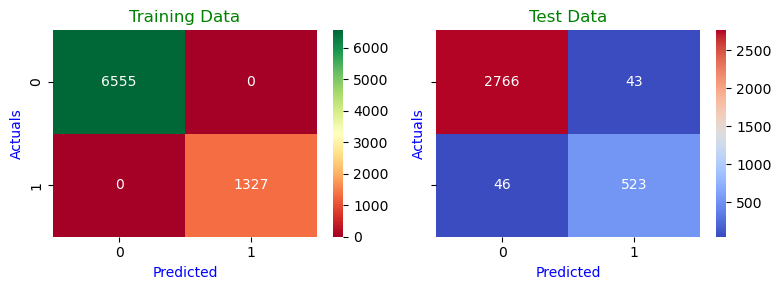

In [128]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')


#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**Plotting AUC - ROC Curve**

AUC for the Training Data: 1.000
AUC for the Test Data: 0.952


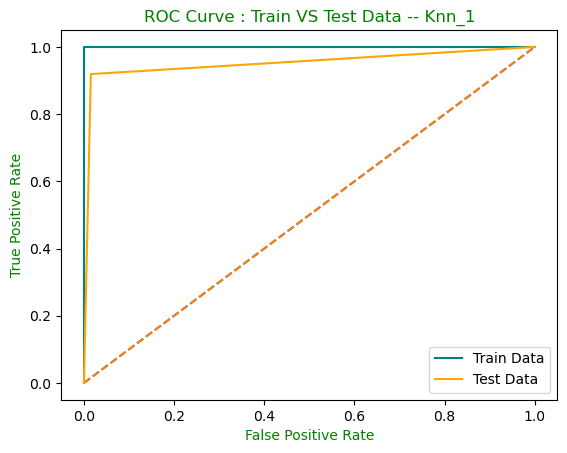

In [129]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = knn_1.predict_proba(X_train)[:,1]
auc = metrics.roc_auc_score(y_train,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = knn_1.predict_proba(X_test)[:,1]
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data -- Knn_1",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 100% and AUC for Test data is 95%.
* It is a Good Generalized Model.
* The AUC  & ROC curve  shows that Test data is covering slightly lesser area than Train data. 
* The AUC score is very high and is able to distinguish between Positive and Negative classes very well.


**Comparison Table**

In [130]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train,knn_1.predict_proba(X_train)[:,1]),
                          'auc_Test':roc_auc_score(y_test,knn_1.predict_proba(X_test)[:,1])},index=['KNN_1'])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


## Building KNN model using SMOTE

In [131]:
# initiantiate learning model (k = 3)

knn = KNeighborsClassifier(n_neighbors=3,metric='euclidean')
# fitting the model
knn_smote_3 = knn.fit(X_train_smote,y_train_smote)
# evaluate accuracy
print("For K = 3 -------> ")
print("Accuracy Score for Training Data is: ", knn_smote_3.score(X_train_smote, y_train_smote))
print("Accuracy Score for Test Data is: ", knn_smote_3.score(X_test, y_test))


# initiantiate learning model (k = 5)
knn = KNeighborsClassifier(n_neighbors = 5,metric='euclidean')
knn_smote_5 = knn.fit(X_train_smote,y_train_smote)
#print("Accuracy Score for K=5 is ", knn_model.score(X_test, y_test))
print("\nFor K = 5 -------> ")
print("Accuracy Score for Training Data is: ", knn_smote_5.score(X_train_smote, y_train_smote))
print("Accuracy Score for Test Data is: ", knn_smote_5.score(X_test, y_test))


# initiantiate learning model (k = 7)
knn = KNeighborsClassifier(n_neighbors = 7,metric='euclidean')
knn_smote_7 =knn.fit(X_train_smote,y_train_smote)
#print("Accuracy Score for K=7 is ", knn_model.score(X_test, y_test))
print("\nFor K = 7 -------> ")
print("Accuracy Score for Training Data is: ", knn_smote_7.score(X_train_smote, y_train_smote))
print("Accuracy Score for Test Data is: ", knn_smote_7.score(X_test, y_test))

# initiantiate learning model (k = 9)
knn = KNeighborsClassifier(n_neighbors=9,metric='euclidean')
knn_smote_9 = knn.fit(X_train_smote,y_train_smote)
print("\nFor K = 9 -------> ")
print("Accuracy Score for Training Data is: ", knn_smote_9.score(X_train_smote, y_train_smote))
print("Accuracy Score for Test Data is: ", knn_smote_9.score(X_test, y_test))

For K = 3 -------> 
Accuracy Score for Training Data is:  0.9899747188562462
Accuracy Score for Test Data is:  0.9520426287744227

For K = 5 -------> 
Accuracy Score for Training Data is:  0.9768982651904804
Accuracy Score for Test Data is:  0.9295441089402013

For K = 7 -------> 
Accuracy Score for Training Data is:  0.9656525150379217
Accuracy Score for Test Data is:  0.9114860864416815

For K = 9 -------> 
Accuracy Score for Training Data is:  0.9518786505099817
Accuracy Score for Test Data is:  0.8898756660746003


* Here theAccuracy is Good for K = 3.

**Building Model with K=3 neighbors.**

**Predictions**

In [132]:
ytrain_pred = knn_smote_3.predict(X_train_smote)
ytest_pred = knn_smote_3.predict(X_test)

**Classification Report**

In [133]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train_smote,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       1.00      0.98      0.99      6555
           1       0.98      1.00      0.99      4916

    accuracy                           0.99     11471
   macro avg       0.99      0.99      0.99     11471
weighted avg       0.99      0.99      0.99     11471
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.99      0.95      0.97      2809
           1       0.81      0.94      0.87       569

    accuracy                           0.95      3378
   macro avg       0.90      0.95      0.92      3378
weighted avg       0.96      0.95      0.95      3378



**Insights:**

**---------------------------------------------Test set Smote data KNN_3-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 95%.
        * 95% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 94% and Recall for class 0(Non-churn) is 95%.
        * 94% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,94% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 95% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 81% and for class 0(Non-Churne) is 99%.
        * 81% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 99% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

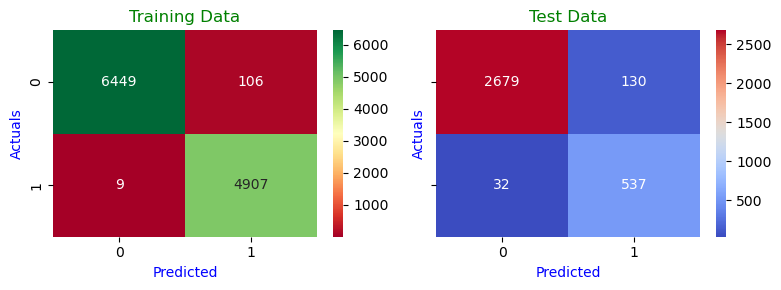

In [134]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
#fig.figsize=(5,5)
#plt.figure(figsize=(5,5))
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train_smote,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**AUC - ROC Curve : Train data**

AUC for the Training Data: 1.000
AUC for the Test Data: 0.973


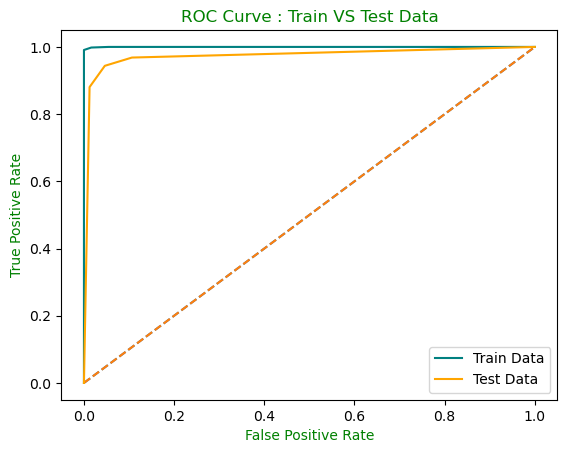

In [135]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = knn_smote_3.predict_proba(X_train_smote)[:,1]
auc = metrics.roc_auc_score(y_train_smote,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train_smote,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = knn_smote_3.predict_proba(X_test)[:,1]
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 100% and AUC for Test data is 97%.
* The AUC  & ROC curve  shows that  is covering almost the same area for Train and Test data. Therefore, this can be considered   a Good optimized model. 
* Also the AUC score is very high and is able to distinguish between Positive and Negative classes vey well.


**Comparison Table**

In [136]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train_smote,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train_smote,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train_smote, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train_smote,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train_smote,knn_smote_3.predict_proba(X_train_smote)[:,1]),
                          'auc_Test':roc_auc_score(y_test,knn_smote_3.predict_proba(X_test)[:,1])},index=['KNN_3 Smote' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


## GridSearchCV for KNearestNeighbours(KNN):

In [137]:
knn = KNeighborsClassifier()
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [138]:
knn_grid = {'n_neighbors': list(range(1,10)),'weights':['uniform', 'distance'],
            'metric':['minkowski','euclidean','manhattan'],'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']}

grid_search = GridSearchCV(estimator=knn,param_grid=knn_grid,cv=10)
grid_search.fit(X_train,y_train)

GridSearchCV(cv=10, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'metric': ['minkowski', 'euclidean', 'manhattan'],
                         'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9],
                         'weights': ['uniform', 'distance']})

In [139]:
print(grid_search.best_params_)
print(grid_search.best_estimator_)

{'algorithm': 'auto', 'metric': 'manhattan', 'n_neighbors': 1, 'weights': 'uniform'}
KNeighborsClassifier(metric='manhattan', n_neighbors=1)


**Building models on Best parametrs**

In [140]:
best_model_knn = grid_search.best_estimator_
best_model_knn.fit(X_train,y_train)

KNeighborsClassifier(metric='manhattan', n_neighbors=1)

**Accuracy of Train and Test Data**

In [141]:
print("Accuracy Score for Training Data is: ", best_model_knn.score(X_train, y_train))
print("Accuracy Score for Test Data is: ", best_model_knn.score(X_test, y_test))

Accuracy Score for Training Data is:  1.0
Accuracy Score for Test Data is:  0.9846062759029012


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [142]:
ytrain_pred = best_model_knn.predict(X_train)
ytest_pred = best_model_knn.predict(X_test)

**Classification Report**

In [143]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6555
           1       1.00      1.00      1.00      1327

    accuracy                           1.00      7882
   macro avg       1.00      1.00      1.00      7882
weighted avg       1.00      1.00      1.00      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.99      0.99      0.99      2809
           1       0.95      0.96      0.95       569

    accuracy                           0.98      3378
   macro avg       0.97      0.97      0.97      3378
weighted avg       0.98      0.98      0.98      3378



**Insights:**

**---------------------------------------------Test set Tuned Model KNN_1-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 98%.
        * 98% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 96% and Recall for class 0(Non-churn) is 99%.
        * 96% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,96% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 99% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 95% and for class 0(Non-Churne) is 99%.
        * 95% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 99% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

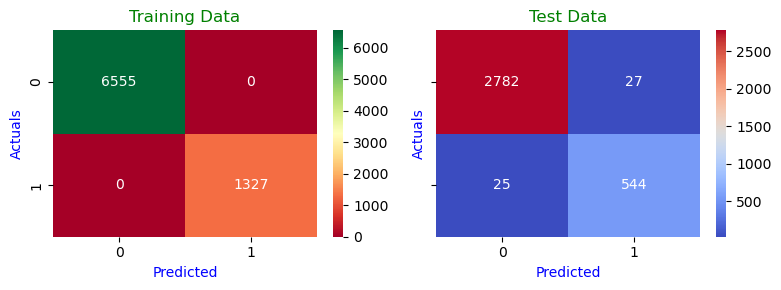

In [144]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**Measuring and Plotting AUC-ROC Curve**

AUC for the Training Data: 1.000
AUC for the Test Data: 0.973


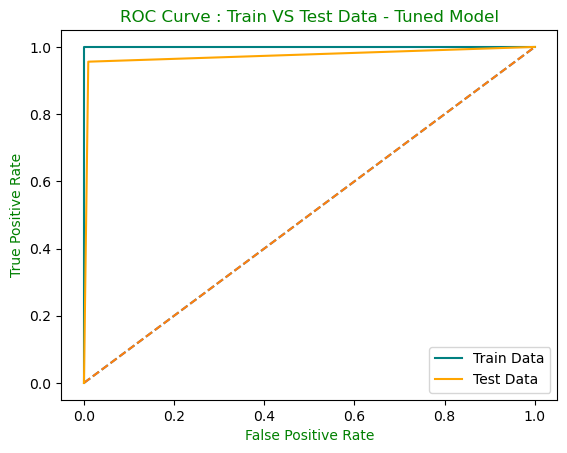

In [145]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = best_model_knn.predict_proba(X_train)[:,1]
auc = metrics.roc_auc_score(y_train,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = best_model_knn.predict_proba(X_test)[:,1]
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data - Tuned Model",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 100% and AUC for Test data is 97%.
* The AUC  & ROC curve  shows that  is covering almost the same area for Train and Test data. Therefore, this can be considered   a Good optimized model. 
* Also the AUC score is very high and is able to distinguish between Positive and Negative classes vey well.


**Comparison Table**

In [146]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train,best_model_knn.predict(X_train)),
                          'auc_Test':roc_auc_score(y_test,best_model_knn.predict(X_test))},index=['KNN Tuned' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


**Observations**

* For KNN Model, we are getting better accuracy with n-neighbours = 1.
* KNN Tuned model is giving better accuracy and AUC Score than KNN base and Smote Model.

## Naive Bayes Model

In [147]:
from sklearn.naive_bayes import GaussianNB

In [148]:
NB_model = GaussianNB()
NB_model.fit(X_train,y_train)

GaussianNB()

**Accuracy of the Train and Test data**

In [149]:
print("Accuracy Score for Training Data is: ", NB_model.score(X_train, y_train))
print("Accuracy Score for Test Data is: ", NB_model.score(X_test, y_test))

Accuracy Score for Training Data is:  0.8705912205024106
Accuracy Score for Test Data is:  0.8587921847246892


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [150]:
ytrain_pred = NB_model.predict(X_train)
ytest_pred = NB_model.predict(X_test)

**Classification Report**

In [151]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.91      0.93      0.92      6555
           1       0.63      0.57      0.60      1327

    accuracy                           0.87      7882
   macro avg       0.77      0.75      0.76      7882
weighted avg       0.87      0.87      0.87      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.91      0.92      0.92      2809
           1       0.58      0.57      0.57       569

    accuracy                           0.86      3378
   macro avg       0.75      0.74      0.74      3378
weighted avg       0.86      0.86      0.86      3378



**Insights:**

**---------------------------------------------Test set-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 86%.
        * 86% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 57% and Recall for class 0(Non-churn) is 92%.
        * 57% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,57% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 92% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 58% and for class 0(Non-Churne) is 91%.
        * 58% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 91% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

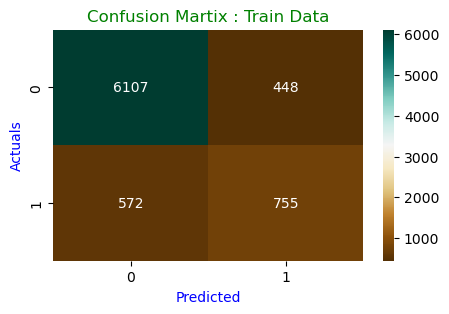

In [152]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Martix : Train Data",color='green');

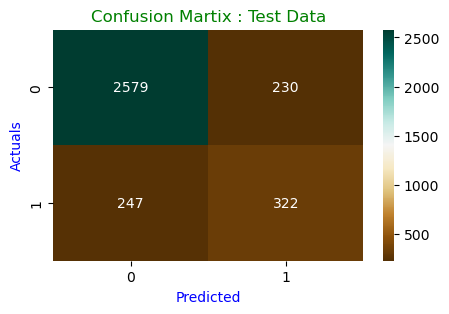

In [153]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Martix : Test Data",color='green');

**AUC - ROC Curve : Train Data**

AUC: 0.831


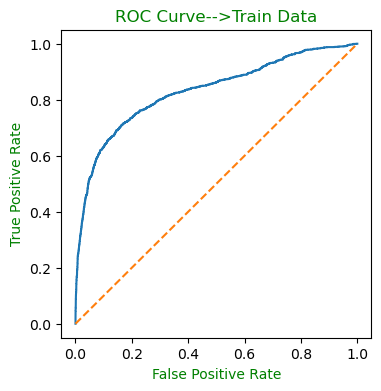

In [154]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = NB_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_train,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Train Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**AUC - ROC Curve : Test Data**

AUC: 0.819


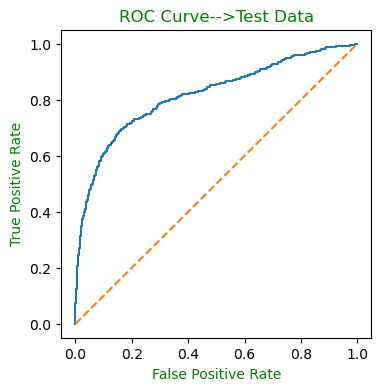

In [155]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = NB_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_test,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_test,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**Observations:**

* AUC for Train data is 83% and AUC for Test data is 81%.
* The AUC  & ROC curve  shows that  is covering almost the same area for Train and Test data. Therefore, this can be considered   a Good optimized model. 
* Also the AUC score is Good and is able to distinguish between Positive and Negative classes.


**Comparison Table**

In [156]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train,NB_model.predict_proba(X_train)[:,1]),
                          'auc_Test':roc_auc_score(y_test,NB_model.predict_proba(X_test)[:,1])},index=['Naive Bayes Classifier' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


## Building Naive Bayes model using SMOTE

In [157]:
NB_smote = GaussianNB()
NB_smote.fit(X_train_smote,y_train_smote)

GaussianNB()

**Accuracy of the Train and Test data**

In [158]:
print("Accuracy Score for Training Data is: ", NB_smote.score(X_train_smote, y_train_smote))
print("Accuracy Score for Test Data is: ", NB_smote.score(X_test, y_test))

Accuracy Score for Training Data is:  0.7530293784325691
Accuracy Score for Test Data is:  0.7181764357608053


**validness of models (over fitting or under fitting)**

* The Accuracy of Train data is more than the Test data,Hence our model is slightly Overfit.

**Predictions**

In [159]:
ytrain_pred = NB_smote.predict(X_train_smote)
ytest_pred = NB_smote.predict(X_test)

**Classification Report**

In [160]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train_smote,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.83      0.72      0.77      6555
           1       0.68      0.80      0.74      4916

    accuracy                           0.75     11471
   macro avg       0.75      0.76      0.75     11471
weighted avg       0.76      0.75      0.75     11471
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.94      0.71      0.81      2809
           1       0.35      0.77      0.48       569

    accuracy                           0.72      3378
   macro avg       0.64      0.74      0.64      3378
weighted avg       0.84      0.72      0.75      3378



**Insights:**

**---------------------------------------------Test set Smote Data-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 72%.
        * 72% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 77% and Recall for class 0(Non-churn) is 71%.
        * 77% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,77% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 71% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 35% and for class 0(Non-Churne) is 94%.
        * 35% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 94% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

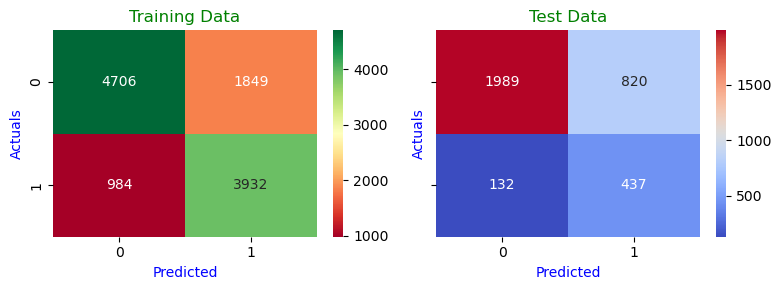

In [161]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train_smote,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**Measuring and Plotting AUC-ROC Curve**

AUC for the Training Data: 0.837
AUC for the Test Data: 0.810


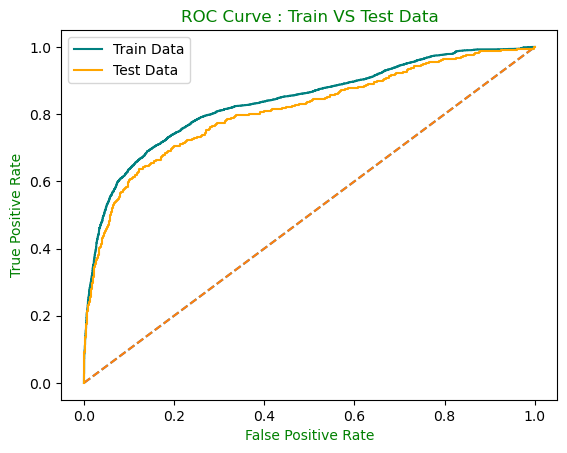

In [162]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = NB_smote.predict_proba(X_train_smote)[:,1]
auc = metrics.roc_auc_score(y_train_smote,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train_smote,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = NB_smote.predict_proba(X_test)[:,1]
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 83% and AUC for Test data is 81%.
* The AUC  & ROC curve  shows that  is covering almost the same area for Train and Test data. Therefore, this can be considered   an optimized model. 
* Also the AUC score is Good and is able to distinguish between Positive and Negative classes well.


**Comparison Table**

In [163]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train_smote,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train_smote,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train_smote, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train_smote,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train_smote,NB_smote.predict_proba(X_train_smote)[:,1]),
                          'auc_Test':roc_auc_score(y_test,NB_smote.predict_proba(X_test)[:,1])},index=['Naive Bayes Smote' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


**Observations**

* Naive Bayes Base model is giving better Accuracy than Smote Model.

## Decission Tree Model

**Loading Unscaled dataset**

In [164]:
churn_US_df = pd.read_excel("churn_df_clean.xlsx")
churn_US_df.head(2)

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,1,4,3,6,2,0,3,3,3,2,2,9,1,11,1.0,5.0,159.93,1
1,1,0,1,8,4,1,3,4,2,3,2,7,1,15,0.0,0.0,120.90,1


In [165]:
X_us = churn_US_df.drop('Churn',axis=1)
y_us = churn_US_df['Churn']

In [166]:
X_train_us, X_test_us, y_train_us, y_test_us = train_test_split(X_us, y_us, test_size=0.30,stratify=y, random_state=42)

In [167]:
print("Shape of X_train :",X_train_us.shape)
print("Shape of X_test :",X_test_us.shape)
print("Shape of y_train :",y_train_us.shape)
print("Shape of y_test :",y_test_us.shape)

Shape of X_train : (7882, 17)
Shape of X_test : (3378, 17)
Shape of y_train : (7882,)
Shape of y_test : (3378,)


In [168]:
display(y_train_us.value_counts(1))
display(y_test_us.value_counts(1))

Churn
0    0.831642
1    0.168358
Name: proportion, dtype: float64

Churn
0    0.831557
1    0.168443
Name: proportion, dtype: float64

In [169]:
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train_us,y_train_us)

DecisionTreeClassifier(random_state=42)

**Accuracy of the Train and Test data**

In [170]:
print("Accuracy Score for Training Data is: ", dt_model.score(X_train_us, y_train_us))
print("Accuracy Score for Test Data is: ", dt_model.score(X_test_us, y_test_us))

Accuracy Score for Training Data is:  1.0
Accuracy Score for Test Data is:  0.9547069271758437


**validness of models (over fitting or under fitting):**

* The Accuracy of the Train data is slightly less than Test data,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [171]:
ytrain_pred = dt_model.predict(X_train_us)
ytest_pred = dt_model.predict(X_test_us)

**Classification Report**

In [172]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train_us,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test_us,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6555
           1       1.00      1.00      1.00      1327

    accuracy                           1.00      7882
   macro avg       1.00      1.00      1.00      7882
weighted avg       1.00      1.00      1.00      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.97      0.98      0.97      2809
           1       0.87      0.85      0.86       569

    accuracy                           0.95      3378
   macro avg       0.92      0.91      0.92      3378
weighted avg       0.95      0.95      0.95      3378



**Insights:**

**---------------------------------------------Test set-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 95%.
        * 95% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 85% and Recall for class 0(Non-churn) is 98%.
        * 85% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,85% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 98% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 87% and for class 0(Non-Churne) is 97%.
        * 87% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 97% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

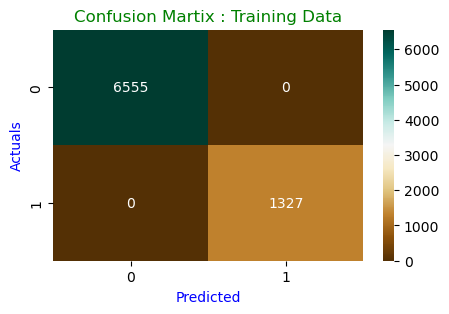

In [173]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_train_us,ytrain_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Martix : Training Data",color='green');

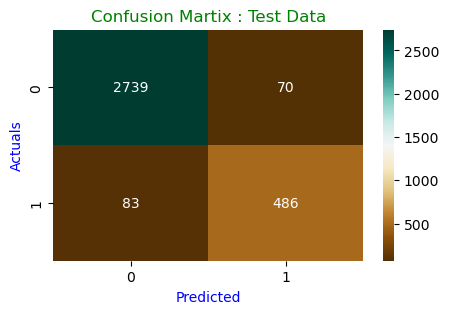

In [174]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_test_us,ytest_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Martix : Test Data",color='green');

**AUC - ROC Curve : Train data**

AUC: 1.000


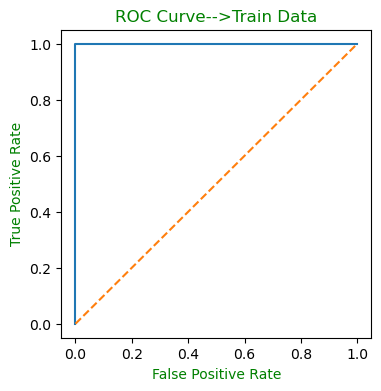

In [175]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = dt_model.predict_proba(X_train_us)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_train_us,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train_us,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Train Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**AUC - ROC Curve : Test Data**

AUC: 0.915


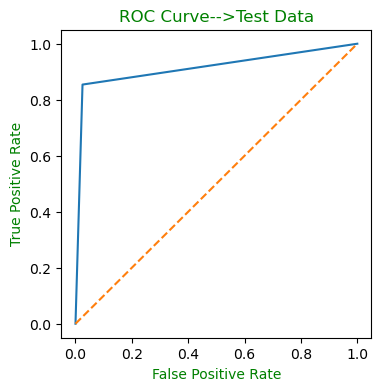

In [176]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = dt_model.predict_proba(X_test_us)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_test_us,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_test_us,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**Observations:**

* AUC for Train data is 100% and AUC for Test data is 91%.
* From the AUC values & ROC curve for the Train and Test data ,it shows that Test data is covering lesser area as compared to     the Train data.
* As AUC score is greater than 90%, so it is able distinguish between the Positive and Negative classes  well.

**Feature Importance:**

In [177]:
dt_model.feature_importances_

array([0.31395431, 0.03312992, 0.05922719, 0.05023841, 0.00968876,
       0.00850653, 0.03072866, 0.03301676, 0.06220167, 0.04072584,
       0.05630594, 0.05591371, 0.04197246, 0.01039747, 0.09536725,
       0.07066263, 0.02796249])

In [178]:
print(pd.DataFrame(dt_model.feature_importances_, columns=['Imp'], index=X_train_us.columns).sort_values(by="Imp", ascending=False))

                              Imp
Tenure                   0.313954
Day_Since_CC_connect     0.095367
cashback                 0.070663
CC_Agent_Score           0.062202
CC_Contacted_LY          0.059227
rev_per_month            0.056306
Complain_ly              0.055914
Payment                  0.050238
rev_growth_yoy           0.041972
Marital_Status           0.040726
City_Tier                0.033130
account_segment          0.033017
Account_user_count       0.030729
Login_device             0.027962
coupon_used_for_payment  0.010397
Gender                   0.009689
Service_Score            0.008507


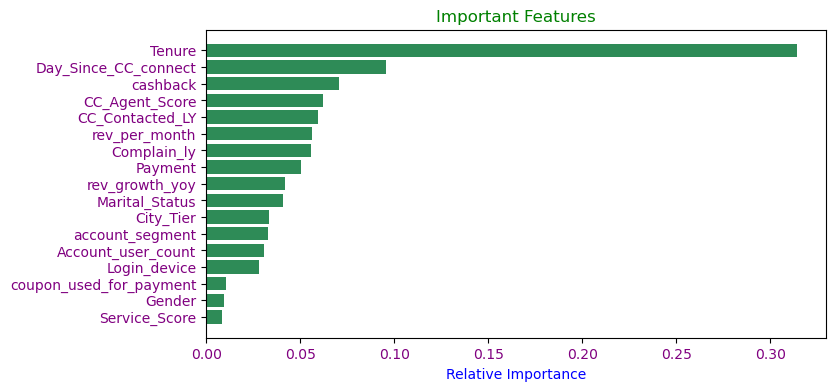

In [180]:
imp = dt_model.feature_importances_
indices = np.argsort(imp)
feature_names = list(X_train_us.columns)

plt.figure(figsize=(8,4))

plt.barh(range(len(indices)), imp[indices], color="seagreen", align="center")
plt.title("Important Features",color='green')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices],color='purple')
plt.xticks(color='purple')
plt.xlabel("Relative Importance",color='blue')
plt.show()

**Insights**

* The 1st Five Important Features of Decision Tree Base Model are: Tenure, Days_since_CC_connect, cashback, Cc_Agent_Score and CC_Contacted_LY.


**Comparison Table**

In [181]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train_us,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test_us,ytest_pred),
                          'recall_Train':recall_score(y_train_us,ytrain_pred),
                          'recall_Test':recall_score(y_test_us,ytest_pred),
                          'precision_Train': precision_score(y_train_us, ytrain_pred),
                          'precision_Test': precision_score(y_test_us, ytest_pred),  
                          'f1_Train': f1_score(y_train_us,ytrain_pred),
                          'f1_Test': f1_score(y_test_us,ytest_pred),
                          'auc_Train':roc_auc_score(y_train_us,dt_model.predict_proba(X_train_us)[:,1]),
                          'auc_Test':roc_auc_score(y_test_us,dt_model.predict_proba(X_test_us)[:,1])},index=['Decission Tree Classifier' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


**Decission Tree on Scaled Data**

In [182]:
dt_scaled = DecisionTreeClassifier(random_state=42)
dt_scaled.fit(X_train,y_train)

DecisionTreeClassifier(random_state=42)

**Accuracy of the Train and Test data**

In [183]:
print("Accuracy Score for Training Data is: ", dt_scaled.score(X_train, y_train))
print("Accuracy Score for Test Data is: ", dt_scaled.score(X_test, y_test))

Accuracy Score for Training Data is:  1.0
Accuracy Score for Test Data is:  0.9547069271758437


**Note**

* Accuracy is same for Scaled and Unscaled Dataset.

## Building Decission Tree model over balanced dataset using SMOTE

In [184]:
dt_smote = DecisionTreeClassifier(random_state=42)
dt_smote.fit(X_train_smote,y_train_smote)

DecisionTreeClassifier(random_state=42)

**Accuracy of the Train and Test data**

In [185]:
print("Accuracy Score for Training Data is: ", dt_smote.score(X_train_smote, y_train_smote))
print("Accuracy Score for Test Data is: ", dt_smote.score(X_test, y_test))

Accuracy Score for Training Data is:  1.0
Accuracy Score for Test Data is:  0.9283599763173476


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data differ by only 8%, Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [186]:
ytrain_pred = dt_smote.predict(X_train_smote)
ytest_pred = dt_smote.predict(X_test)

**Classification Report**

In [187]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train_smote,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6555
           1       1.00      1.00      1.00      4916

    accuracy                           1.00     11471
   macro avg       1.00      1.00      1.00     11471
weighted avg       1.00      1.00      1.00     11471
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.96      0.95      0.96      2809
           1       0.77      0.81      0.79       569

    accuracy                           0.93      3378
   macro avg       0.87      0.88      0.87      3378
weighted avg       0.93      0.93      0.93      3378



**Insights:**

**---------------------------------------------Test set-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 93%.
        * 93% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 81% and Recall for class 0(Non-churn) is 95%.
        * 81% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,81% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 95% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 77% and for class 0(Non-Churne) is 96%.
        * 77% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 96% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

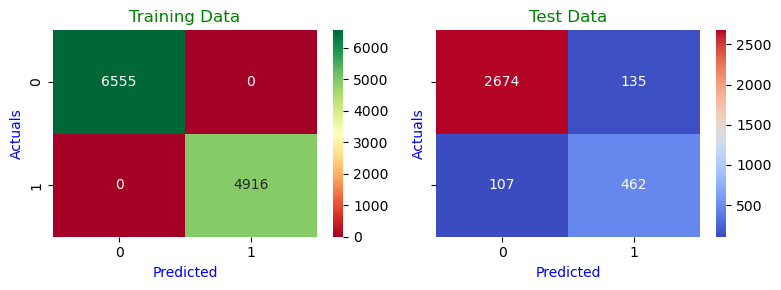

In [188]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train_smote,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')


#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**Measuring and Plotting AUC-ROC Curve**

AUC for the Training Data: 1.000
AUC for the Test Data: 0.882


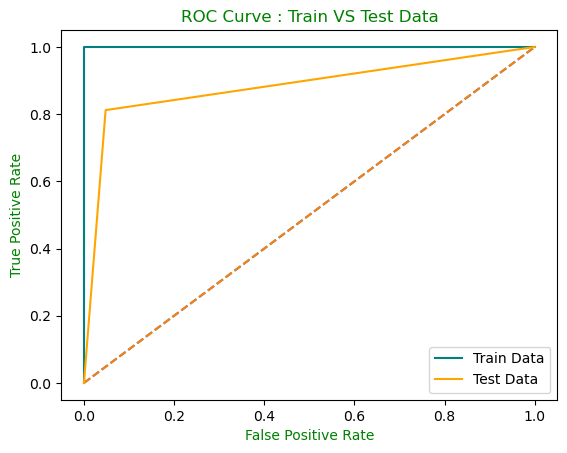

In [189]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = dt_smote.predict_proba(X_train_smote)[:,1]
auc = metrics.roc_auc_score(y_train_smote,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train_smote,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = dt_smote.predict_proba(X_test)[:,1]
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 100% and AUC for Test data is 88%.
* From the AUC values & ROC curve for the Train and Test data ,it shows that Test data is not covering a large area as           compared to the train data.

**Comparison Table**

In [190]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train_smote,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train_smote,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train_smote, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train_smote,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train_smote,dt_smote.predict_proba(X_train_smote)[:,1]),
                          'auc_Test':roc_auc_score(y_test,dt_smote.predict_proba(X_test)[:,1])},index=['Decission Tree Smote' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


## Applying GridsearchCV on Decission Tree Model

In [191]:
## Unscaled Data

grid = {'criterion':["gini", "entropy", "log_loss"],
        'max_depth':[10,20,30],
        'min_samples_split':[2,3,5,7],
        'min_samples_leaf':[2,3,4,5],
        'min_impurity_decrease':[0.001,0.0001],
        }
grid_search = GridSearchCV(estimator = dt_model, param_grid = grid, cv = 10,n_jobs=-1,scoring='accuracy',verbose=1)
grid_search.fit(X_train_us,y_train_us)

Fitting 10 folds for each of 288 candidates, totalling 2880 fits


GridSearchCV(cv=10, estimator=DecisionTreeClassifier(random_state=42),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [10, 20, 30],
                         'min_impurity_decrease': [0.001, 0.0001],
                         'min_samples_leaf': [2, 3, 4, 5],
                         'min_samples_split': [2, 3, 5, 7]},
             scoring='accuracy', verbose=1)

In [192]:
print(grid_search.best_params_,"\n")
print(grid_search.best_estimator_)

{'criterion': 'entropy', 'max_depth': 30, 'min_impurity_decrease': 0.0001, 'min_samples_leaf': 2, 'min_samples_split': 2} 

DecisionTreeClassifier(criterion='entropy', max_depth=30,
                       min_impurity_decrease=0.0001, min_samples_leaf=2,
                       random_state=42)


**Building model on best parameters**

In [193]:
best_model_dt = grid_search.best_estimator_
best_model_dt.fit(X_train_us,y_train_us)

DecisionTreeClassifier(criterion='entropy', max_depth=30,
                       min_impurity_decrease=0.0001, min_samples_leaf=2,
                       random_state=42)

**Accuracy of the Training and Test Data**

In [194]:
print("Accuracy of Train data: ",best_model_dt.score(X_train_us,y_train_us))
print("Accuracy of Test data: ",best_model_dt.score(X_test_us,y_test_us))

Accuracy of Train data:  0.9911190053285968
Accuracy of Test data:  0.9440497335701599


**validness of models (over fitting or under fitting):**

* There is not much difference between Accuracy of the Train data and Test data, Hence our model is Neither Overfit nor Underfit.


**Predictions**

In [225]:
ytrain_pred = best_model_dt.predict(X_train_us)
ytest_pred = best_model_dt.predict(X_test_us)

**Classification Report**

In [196]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train_us,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test_us,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.99      1.00      0.99      6555
           1       1.00      0.95      0.97      1327

    accuracy                           0.99      7882
   macro avg       0.99      0.97      0.98      7882
weighted avg       0.99      0.99      0.99      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.96      0.97      0.97      2809
           1       0.85      0.82      0.83       569

    accuracy                           0.94      3378
   macro avg       0.90      0.89      0.90      3378
weighted avg       0.94      0.94      0.94      3378



**Insights:**

**---------------------------------------------Test set Tuned Model-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 94%.
        * 94% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 82% and Recall for class 0(Non-churn) is 97%.
        * 82% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,82% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 97% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 85% and for class 0(Non-Churne) is 96%.
        * 85% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 96% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

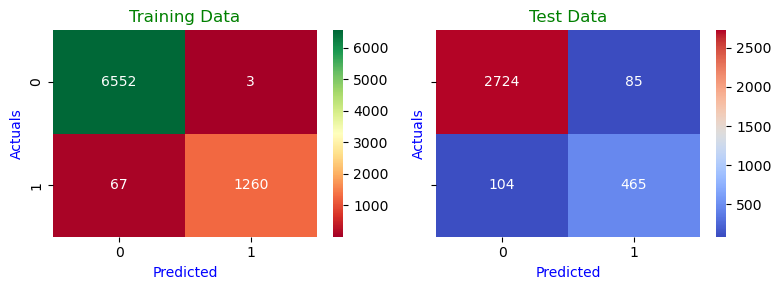

In [197]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train_us,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')


#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test_us,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**Measuring and Plotting AUC-ROC Curve**

AUC for the Training Data: 1.000
AUC for the Test Data: 0.920


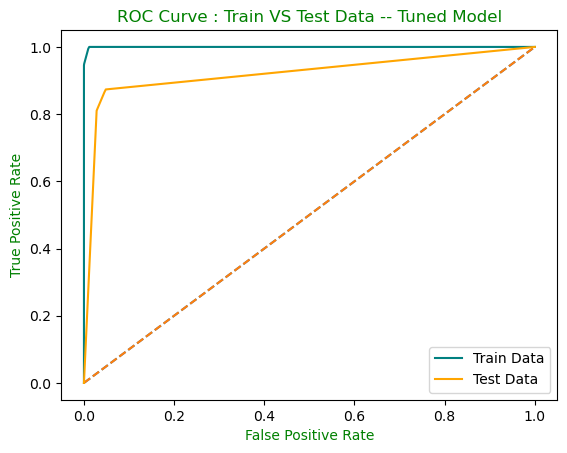

In [198]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = best_model_dt.predict_proba(X_train_us)[:,1]
auc = metrics.roc_auc_score(y_train_us,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train_us,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = best_model_dt.predict_proba(X_test_us)[:,1]
auc = metrics.roc_auc_score(y_test_us,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test_us,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data -- Tuned Model",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 100% and AUC for Test data is 92%.
* From the AUC values & ROC curve for the Train and Test data ,it shows that Test data is covering a less area as compared to the train data.
* Since the AUC score is good it is able to distinguish between Positive and Negative classes well.

**Feature Importance**

In [199]:
imp = pd.DataFrame(best_model_dt.feature_importances_, columns=["Imp"], index=X_train_us.columns).sort_values(by="Imp", ascending=False)
imp

,Imp
Tenure,0.318282
Day_Since_CC_connect,0.087865
CC_Agent_Score,0.071950
CC_Contacted_LY,0.067826
cashback,0.060355
rev_growth_yoy,0.057940
rev_per_month,0.050462
Complain_ly,0.049414
Payment,0.049367
Marital_Status,0.036707


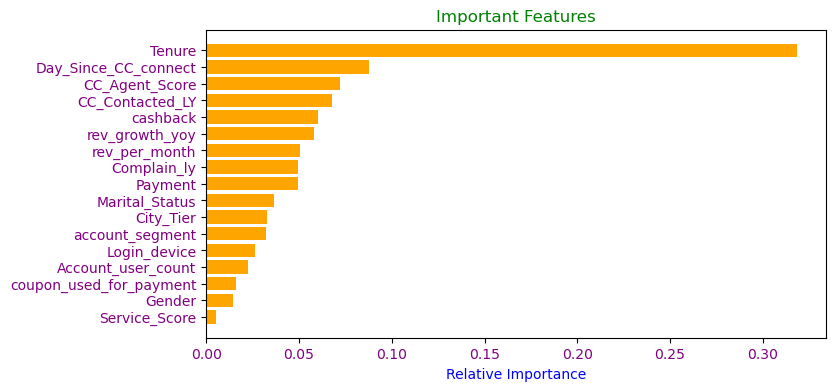

In [200]:
imp = best_model_dt.feature_importances_
indices = np.argsort(imp)
feature_names = list(X_train_us.columns)

plt.figure(figsize=(8,4))

plt.barh(range(len(indices)), imp[indices], color="orange")
plt.title("Important Features",color='green')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices],color='purple')
plt.xticks(color='purple')
plt.xlabel("Relative Importance",color='blue')
plt.show()

* The 1st Five important Features for decision Tree Tuned Model are: Tenure, Day_since_CC_connect, CC_Agent_Score, CC_Contacted_LY and cashback.

**Comparison Model**

In [201]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train_us,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test_us,ytest_pred),
                          'recall_Train':recall_score(y_train_us,ytrain_pred),
                          'recall_Test':recall_score(y_test_us,ytest_pred),
                          'precision_Train': precision_score(y_train_us, ytrain_pred),
                          'precision_Test': precision_score(y_test_us, ytest_pred),  
                          'f1_Train': f1_score(y_train_us,ytrain_pred),
                          'f1_Test': f1_score(y_test_us,ytest_pred),
                          'auc_Train':roc_auc_score(y_train_us,best_model_dt.predict_proba(X_train_us)[:,1]),
                          'auc_Test':roc_auc_score(y_test_us,best_model_dt.predict_proba(X_test_us)[:,1])},index=['Decission Tree Tuned' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


**Observations**

* Accuracy and AUC Score are almost same for the base and Tuned model.

## Random Forest

In [202]:
from sklearn.ensemble import RandomForestClassifier

In [203]:
RF_model = RandomForestClassifier(n_estimators=100,random_state=42)
RF_model.fit(X_train,y_train)

RandomForestClassifier(random_state=42)

**Accuracy of Train and Test data**

In [204]:
print("Accuracy on Training data: ",RF_model.score(X_train,y_train))
print("Accuracy on Test data: ",RF_model.score(X_test,y_test))

Accuracy on Training data:  1.0
Accuracy on Test data:  0.9683244523386619


**Predictions**

In [205]:
ytrain_pred = RF_model.predict(X_train)
ytest_pred = RF_model.predict(X_test)

**Classification Report**

In [206]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6555
           1       1.00      1.00      1.00      1327

    accuracy                           1.00      7882
   macro avg       1.00      1.00      1.00      7882
weighted avg       1.00      1.00      1.00      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.97      0.99      0.98      2809
           1       0.97      0.84      0.90       569

    accuracy                           0.97      3378
   macro avg       0.97      0.92      0.94      3378
weighted avg       0.97      0.97      0.97      3378



**Insights:**

**---------------------------------------------Test set-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 97%.
        * 97% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 84% and Recall for class 0(Non-churn) is 99%.
        * 84% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,84% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 99% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 97% and for class 0(Non-Churne) is 97%.
        * 97% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 97% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

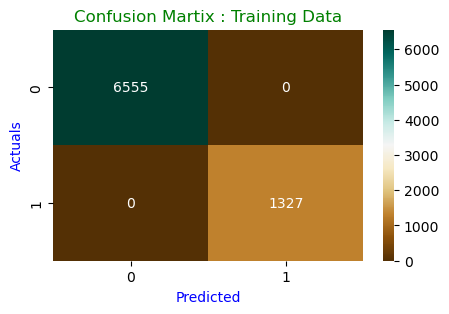

In [207]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Martix : Training Data",color='green');

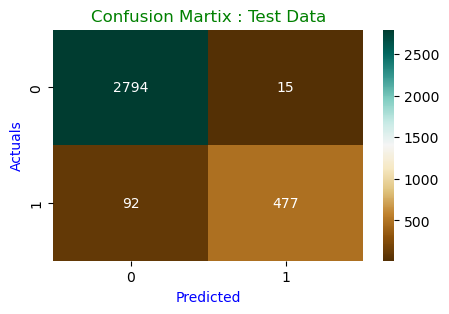

In [208]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Martix : Test Data",color='green');

**AUC - ROC Curve : Train Data**

AUC: 1.000


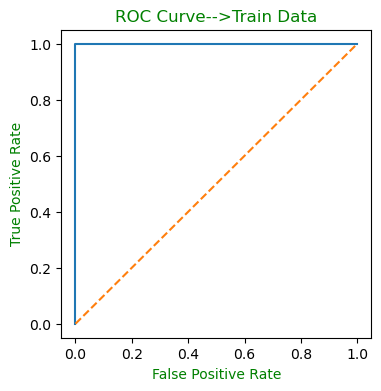

In [209]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = RF_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_train,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Train Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**AUC - ROC Curve : Test Data**

AUC: 0.992


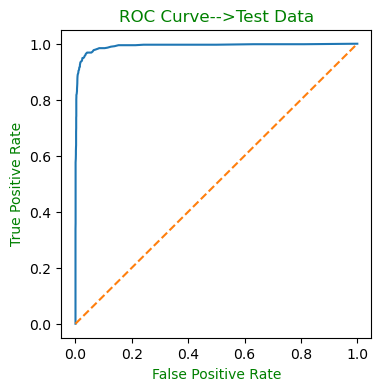

In [210]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = RF_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_test,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_test,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**Observations:**

* AUC for Train data is 100% and AUC for Test data is 99%.
* The AUC & ROC curve shows that it is covering the same area for Train and Test data. Therefore, this is considered a           Generalized good model. 
* Also the AUC score is very high and is able to distinguish between Positive and Negative classes very well.


**Feature importance of Random Forest**

In [211]:

imp = pd.DataFrame(RF_model.feature_importances_, columns=["Imp"], index=X_train.columns).sort_values(by="Imp", ascending=False)
imp

,Imp
Tenure,0.262680
cashback,0.089537
CC_Contacted_LY,0.071107
Day_Since_CC_connect,0.068907
Complain_ly,0.062392
rev_growth_yoy,0.061271
rev_per_month,0.056778
CC_Agent_Score,0.054448
Payment,0.047344
account_segment,0.038758


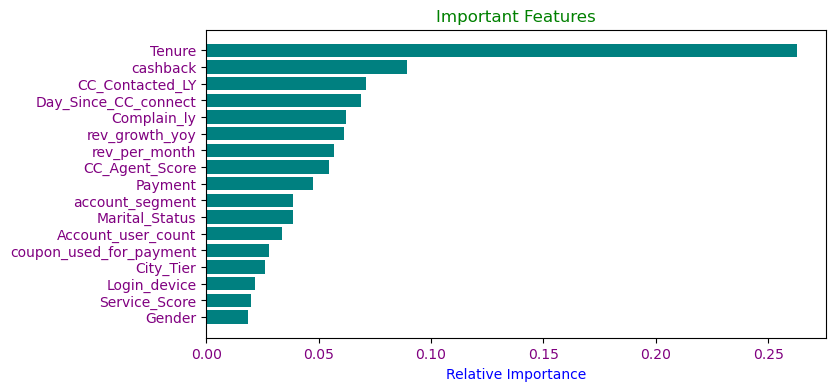

In [212]:
imp = RF_model.feature_importances_
indices = np.argsort(imp)
feature_names = list(X_train.columns)

plt.figure(figsize=(8,4))

plt.barh(range(len(indices)), imp[indices], color="teal")
plt.title("Important Features",color='green')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices],color='purple')
plt.xticks(color='purple')
plt.xlabel("Relative Importance",color='blue')
plt.show()

* The 1st Five Important Features of Random Forest Model are: Tenure, cashback, CC_Contacted_LY, Day_since_CC_connect and Complain_ly.

**Comparison Table**

In [213]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train,RF_model.predict_proba(X_train)[:,1]),
                          'auc_Test':roc_auc_score(y_test,RF_model.predict_proba(X_test)[:,1])},index=['Random Forest'])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


**Cross Validation**

In [214]:
scores = cross_val_score(RF_model, X, y, cv=10, scoring='accuracy')
print("Accuracy of Each Fold: \n",scores)
print("\nAverage Accuracy : ",scores.mean())

Accuracy of Each Fold: 
 [0.98667851 0.98223801 0.99023091 0.98579041 0.98046181 0.98312611
 0.98756661 0.98046181 0.98223801 0.97779751]

Average Accuracy :  0.9836589698046181


## Building Random forest model over balanced dataset

In [215]:
rf_smote = RandomForestClassifier(n_estimators=500,random_state=42)
rf_smote.fit(X_train_smote,y_train_smote)

RandomForestClassifier(n_estimators=500, random_state=42)

**Accuracy of Train and Test data**

In [216]:
print("Accuracy on Train data: ",rf_smote.score(X_train_smote,y_train_smote))
print("Accuracy on Test data: ",rf_smote.score(X_test,y_test))

Accuracy on Train data:  1.0
Accuracy on Test data:  0.9698046181172292


**validness of models (over fitting or under fitting):**

* There is not much difference between Train and Test Accuracy, Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [217]:
ytrain_pred = rf_smote.predict(X_train_smote)
ytest_pred = rf_smote.predict(X_test)

**Classification Report**

In [218]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train_smote,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6555
           1       1.00      1.00      1.00      4916

    accuracy                           1.00     11471
   macro avg       1.00      1.00      1.00     11471
weighted avg       1.00      1.00      1.00     11471
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.98      0.99      0.98      2809
           1       0.93      0.88      0.91       569

    accuracy                           0.97      3378
   macro avg       0.95      0.94      0.94      3378
weighted avg       0.97      0.97      0.97      3378



**Insights:**

**---------------------------------------------Test set Smote Data-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 97%.
        * 97% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 88% and Recall for class 0(Non-churn) is 99%.
        * 88% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,88% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 99% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 93% and for class 0(Non-Churne) is 98%.
        * 93% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 98% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

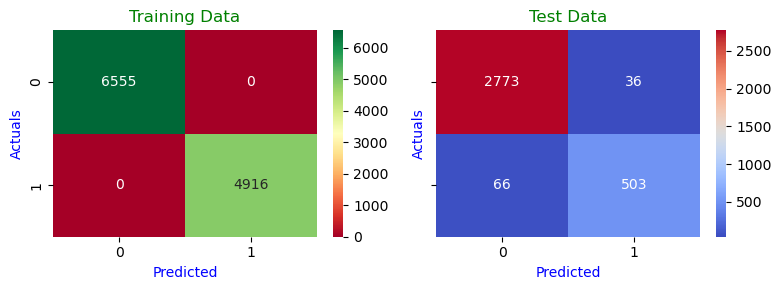

In [219]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train_smote,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**Measuring and Plotting AUC-ROC Curve**

AUC for the Training Data: 1.000
AUC for the Test Data: 0.991


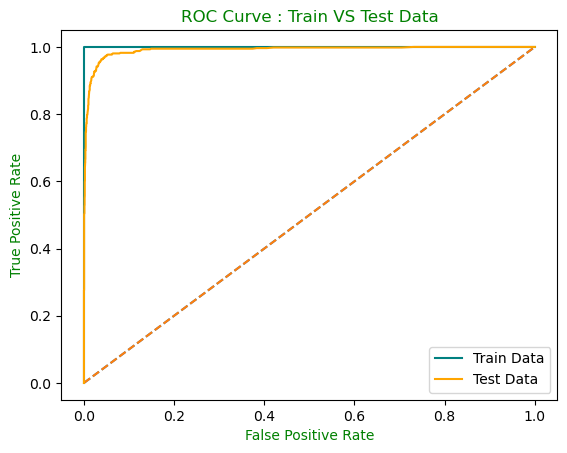

In [220]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = rf_smote.predict_proba(X_train_smote)[:,1]
auc = metrics.roc_auc_score(y_train_smote,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train_smote,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = rf_smote.predict_proba(X_test)[:,1]
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 100% and AUC for Test data is 99%.
* The AUC & ROC curve shows that it is covering almost the same area for Train and Test data. Therefore, this is considered a      Generalized good model. 
* Also the AUC score is very high and is able to distinguish between Positive and Negative classes very well.


**Comparison Table**

In [221]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train_smote,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train_smote,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train_smote, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train_smote,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train_smote,rf_smote.predict_proba(X_train_smote)[:,1]),
                          'auc_Test':roc_auc_score(y_test,rf_smote.predict_proba(X_test)[:,1])},index=['Random Forest Smote' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


## Applying GridSearchCV on Random Forest

In [222]:
Param_grid = {
              'min_samples_split' : [10,20,30],
              'min_samples_leaf':[5,10,15],
              'max_depth':[5,10,15,20],'max_features' : ["sqrt", "log2"],
              'n_estimators':[50,100,150]
             }

In [223]:
grid_search = GridSearchCV(estimator=RF_model,param_grid=Param_grid,cv=5)
grid_search.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
             param_grid={'max_depth': [5, 10, 15, 20],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [5, 10, 15],
                         'min_samples_split': [10, 20, 30],
                         'n_estimators': [50, 100, 150]})

In [224]:
print(grid_search.best_params_,"\n")
print(grid_search.best_estimator_)

{'max_depth': 15, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'min_samples_split': 10, 'n_estimators': 50} 

RandomForestClassifier(max_depth=15, min_samples_leaf=5, min_samples_split=10,
                       n_estimators=50, random_state=42)


**Building model on best parameters**

In [226]:
best_modelRF = grid_search.best_estimator_
best_modelRF.fit(X_train,y_train)

RandomForestClassifier(max_depth=15, min_samples_leaf=5, min_samples_split=10,
                       n_estimators=50, random_state=42)

**Accuracy of Train and Test Data**

In [227]:
print("Accuracy on Train data: ",best_modelRF.score(X_train,y_train))
print("Accuracy on Test data: ",best_modelRF.score(X_test,y_test))

Accuracy on Train data:  0.9691702613549861
Accuracy on Test data:  0.9342806394316163


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [228]:
ytrain_pred = best_modelRF.predict(X_train)
ytest_pred = best_modelRF.predict(X_test)

**Classification Report**

In [229]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.97      1.00      0.98      6555
           1       0.98      0.83      0.90      1327

    accuracy                           0.97      7882
   macro avg       0.97      0.91      0.94      7882
weighted avg       0.97      0.97      0.97      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.94      0.99      0.96      2809
           1       0.90      0.68      0.78       569

    accuracy                           0.93      3378
   macro avg       0.92      0.83      0.87      3378
weighted avg       0.93      0.93      0.93      3378



**Insights:**

**---------------------------------------------Test set Tuned Model-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 93%.
        * 93% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 68% and Recall for class 0(Non-churn) is 99%.
        * 68% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,68% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 99% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 90% and for class 0(Non-Churne) is 94%.
        * 90% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 94% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.
        

**Confusion Matrix**

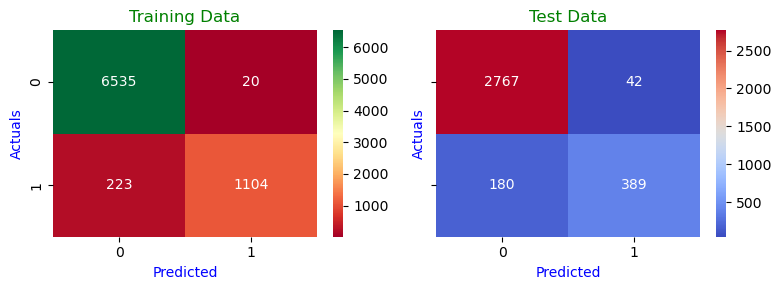

In [230]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**Measuring and Plotting AUC-ROC Curve**

AUC for the Training Data: 0.997
AUC for the Test Data: 0.976


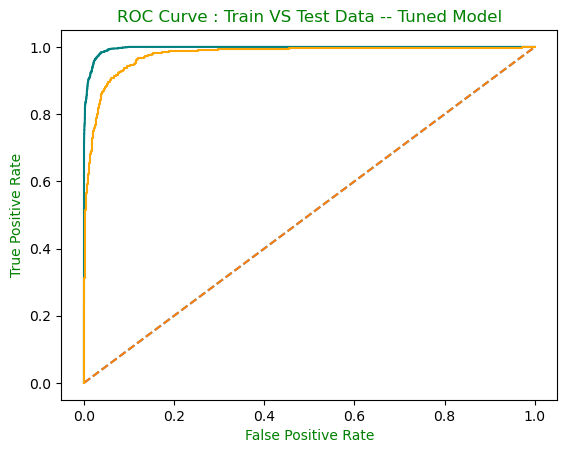

In [231]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = best_modelRF.predict_proba(X_train)[:,1]
auc = metrics.roc_auc_score(y_train,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = best_modelRF.predict_proba(X_test)[:,1]
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data -- Tuned Model",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.show()

**Observations:**

* AUC for Train data is 99% and AUC for Test data is 97%.
* The AUC & ROC curve shows that it is covering almost the same area for Train and Test data. Therefore, this is considered a           Generalized good model. 
* Also the AUC score is very high and is able to distinguish between Positive and Negative classes very well.


**Feature Importance**

In [232]:
best_modelRF.feature_importances_

array([0.32120488, 0.02704618, 0.05752936, 0.03827801, 0.0176904 ,
       0.01159733, 0.02596952, 0.0408089 , 0.05061203, 0.04416671,
       0.04770827, 0.08425771, 0.05111099, 0.02295391, 0.07064516,
       0.07159759, 0.01682305])

In [233]:
imp = pd.DataFrame(best_modelRF.feature_importances_, columns=["Imp"], index=X_train.columns).sort_values(by="Imp", ascending=False)
imp

,Imp
Tenure,0.321205
Complain_ly,0.084258
cashback,0.071598
Day_Since_CC_connect,0.070645
CC_Contacted_LY,0.057529
rev_growth_yoy,0.051111
CC_Agent_Score,0.050612
rev_per_month,0.047708
Marital_Status,0.044167
account_segment,0.040809


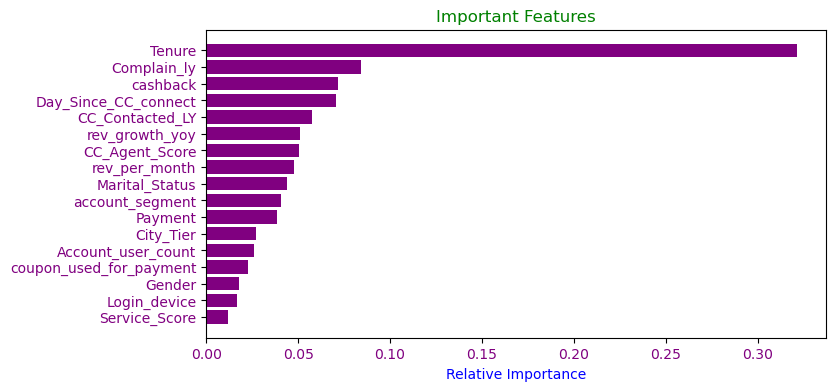

In [234]:
imp = best_modelRF.feature_importances_
indices = np.argsort(imp)
feature_names = list(X_train.columns)

plt.figure(figsize=(8,4))

plt.barh(range(len(indices)), imp[indices], color="purple")
plt.title("Important Features",color='green')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices],color='purple')
plt.xticks(color='purple')
plt.xlabel("Relative Importance",color='blue')
plt.show()

* The 1st Five Important Features of Random Forest Tuned model are: Tenure, Complain_ly, cashback, Day_Since_CC_connect and CC_Contacted_LY.

**Comparison Table**

In [235]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                           'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                           'recall_Train':recall_score(y_train,ytrain_pred),
                           'recall_Test':recall_score(y_test,ytest_pred),
                           'precision_Train': precision_score(y_train, ytrain_pred),
                           'precision_Test': precision_score(y_test, ytest_pred),  
                           'f1_Train': f1_score(y_train,ytrain_pred),
                           'f1_Test': f1_score(y_test,ytest_pred),
                           'auc_Train':roc_auc_score(y_train,best_modelRF.predict_proba(X_train)[:,1]),
                           'auc_Test':roc_auc_score(y_test,best_modelRF.predict_proba(X_test)[:,1])},index=['Random Forest Tuned'])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


**Observations**

* Random Forest Base and Smote model are giving better Accuracy and AUC Score than Tuned model.

## Bagging Classifier

In [236]:
from sklearn.ensemble import BaggingClassifier

In [237]:
bgcl = BaggingClassifier(random_state=42)
bgcl.fit(X_train, y_train)

BaggingClassifier(random_state=42)

**Accuracy of Train and Test Dataset**

In [238]:
print("Accuracy of Train Data  : ",bgcl.score(X_train,y_train))
print("Accuracy of Test Data  : ",bgcl.score(X_test,y_test))

Accuracy of Train Data  :  0.9965744734838874
Accuracy of Test Data  :  0.9600355239786856


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [239]:
ytrain_pred = bgcl.predict(X_train)
ytest_pred = bgcl.predict(X_test)

**Classification Report**

In [240]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred),'\n')

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6555
           1       1.00      0.98      0.99      1327

    accuracy                           1.00      7882
   macro avg       1.00      0.99      0.99      7882
weighted avg       1.00      1.00      1.00      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.97      0.99      0.98      2809
           1       0.93      0.83      0.87       569

    accuracy                           0.96      3378
   macro avg       0.95      0.91      0.93      3378
weighted avg       0.96      0.96      0.96      3378
 



**Insights:**

**---------------------------------------------Test set-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 96%.
        * 96% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 83% and Recall for class 0(Non-churn) is 99%.
        * 83% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,83% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 99% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 93% and for class 0(Non-Churne) is 97%.
        * 93% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 97% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

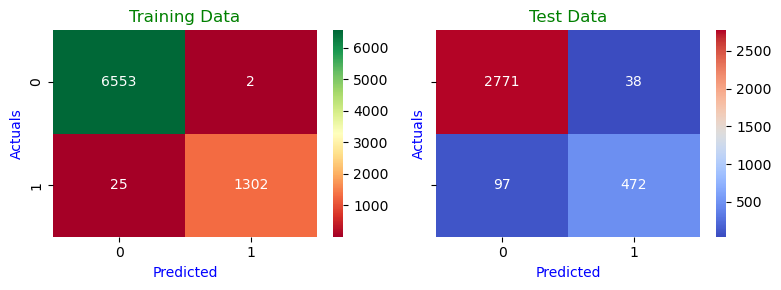

In [241]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**AUC -ROC Curve : Train Data**

AUC: 1.000


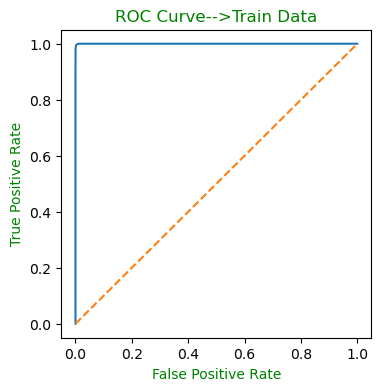

In [242]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = bgcl.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_train,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Train Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**AUC - ROC Curve : Test data**

AUC: 0.983


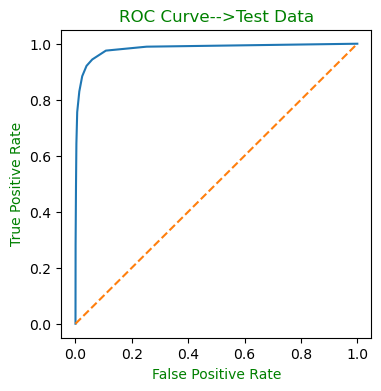

In [243]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = bgcl.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_test,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_test,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**Observations:**

* AUC for Train data is 100% and AUC for Test data is 98%.
* The AUC & ROC curve shows that it is covering almost the same area for Train and Test data. Therefore, this is considered a           Generalized good model. 
* Also the AUC score is very high and is able to distinguish between Positive and Negative classes vey well.


**Comparison Table**

In [244]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                           'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                           'recall_Train':recall_score(y_train,ytrain_pred),
                           'recall_Test':recall_score(y_test,ytest_pred),
                           'precision_Train': precision_score(y_train, ytrain_pred),
                           'precision_Test': precision_score(y_test, ytest_pred),  
                           'f1_Train': f1_score(y_train,ytrain_pred),
                           'f1_Test': f1_score(y_test,ytest_pred),
                           'auc_Train':roc_auc_score(y_train,bgcl.predict_proba(X_train)[:,1]),
                           'auc_Test':roc_auc_score(y_test,bgcl.predict_proba(X_test)[:,1])},index=['Bagging Classifier'])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


In [245]:
# Fitting the model with RF_model as base_estimator

bgcl_rf = BaggingClassifier(estimator=RF_model,random_state=42)
bgcl_rf.fit(X_train, y_train)

BaggingClassifier(estimator=RandomForestClassifier(random_state=42),
                  random_state=42)

In [246]:
print("Accuracy of Train Data : ",bgcl_rf.score(X_train,y_train))
print("Accuracy of Test Data : ",bgcl_rf.score(X_test,y_test))

Accuracy of Train Data :  0.9945445318447095
Accuracy of Test Data :  0.9517465956187093


In [247]:
# Fitting the model with dtree as base_estimator

bgcl_dt = BaggingClassifier(estimator=dt_model,random_state=42)
bgcl_dt.fit(X_train, y_train)

BaggingClassifier(estimator=DecisionTreeClassifier(random_state=42),
                  random_state=42)

In [248]:
print("Accuracy of Train Data : ",bgcl_dt.score(X_train,y_train))
print("Accuracy of Test Data : ",bgcl_dt.score(X_test,y_test))

Accuracy of Train Data :  0.9965744734838874
Accuracy of Test Data :  0.9600355239786856


## Bagging on Smote dataset

In [249]:
bgcl_smote = BaggingClassifier(random_state=42)
bgcl_smote.fit(X_train_smote,y_train_smote)

BaggingClassifier(random_state=42)

**Accuracy of Train and Test Dataset**

In [250]:
print("Accuracy of Train Data : ",bgcl_smote.score(X_train_smote,y_train_smote))
print("Accuracy of Test Data : ",bgcl_smote.score(X_test,y_test))

Accuracy of Train Data :  0.9985180019178799
Accuracy of Test Data :  0.9585553582001184


**validness of models (over fitting or under fitting):**

* There is not much difference between Tain and Test Accuracy, hence our model is Neither Overfit nor Underfit.

**Predictions**

In [251]:
ytrain_pred = bgcl_smote.predict(X_train_smote)
ytest_pred = bgcl_smote.predict(X_test)

**Classification Report**

In [252]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train_smote,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred),'\n')

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6555
           1       1.00      1.00      1.00      4916

    accuracy                           1.00     11471
   macro avg       1.00      1.00      1.00     11471
weighted avg       1.00      1.00      1.00     11471
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.97      0.98      0.98      2809
           1       0.90      0.85      0.87       569

    accuracy                           0.96      3378
   macro avg       0.93      0.92      0.92      3378
weighted avg       0.96      0.96      0.96      3378
 



**Insights:**

**---------------------------------------------Test set Smote Data-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 96%.
        * 96% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 85% and Recall for class 0(Non-churn) is 98%.
        * 85% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,85% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 98% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 90% and for class 0(Non-Churne) is 97%.
        * 90% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 97% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

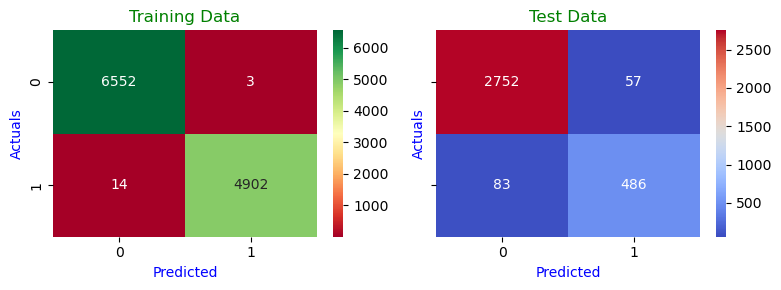

In [253]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train_smote,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**Measuring and Plotting AUC-ROC Curve**

AUC for the Training Data: 1.000
AUC for the Test Data: 0.982


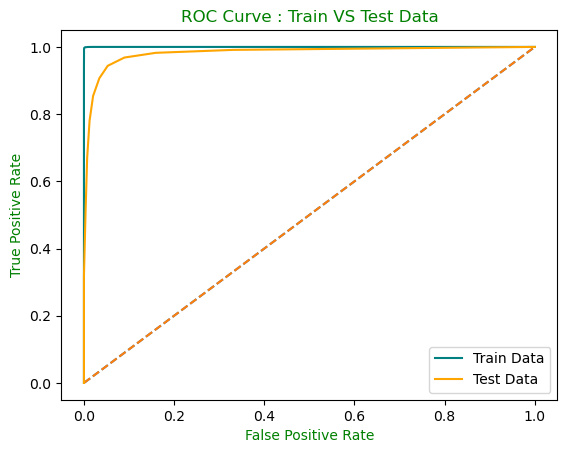

In [254]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = bgcl_smote.predict_proba(X_train_smote)[:,1]
auc = metrics.roc_auc_score(y_train_smote,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train_smote,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = bgcl_smote.predict_proba(X_test)[:,1]
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 100% and AUC for Test data is 98%.
* The AUC & ROC curve shows that it is covering almost the same area for Train and Test data. Therefore, this is considered a           Generalized good model. 
* Also the AUC score is very high and is able to distinguish between Positive and Negative classes vey well.


**Comparison Table**

In [255]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train_smote,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train_smote,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train_smote, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train_smote,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train_smote,bgcl_smote.predict_proba(X_train_smote)[:,1]),
                          'auc_Test':roc_auc_score(y_test,bgcl_smote.predict_proba(X_test)[:,1])},index=['Bagging Classifier Smote' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


In [256]:
bgcl_rf_sm = BaggingClassifier(estimator=RF_model,n_estimators=100,random_state=42)
bgcl_rf_sm.fit(X_train_smote, y_train_smote)

BaggingClassifier(estimator=RandomForestClassifier(random_state=42),
                  n_estimators=100, random_state=42)

In [257]:
print("Accuracy of Train Data : ",bgcl_rf_sm.score(X_train_smote,y_train_smote))
print("Accuracy of Test Data : ",bgcl_rf_sm.score(X_test,y_test))

Accuracy of Train Data :  0.9990410600645105
Accuracy of Test Data :  0.9585553582001184


In [258]:
bgcl_dt_sm = BaggingClassifier(estimator=dt_model,n_estimators=500,random_state=42)
bgcl_dt_sm.fit(X_train_smote, y_train_smote)

BaggingClassifier(estimator=DecisionTreeClassifier(random_state=42),
                  n_estimators=500, random_state=42)

In [259]:
print("Accuracy of Train Data : ",bgcl_dt_sm.score(X_train_smote,y_train_smote))
print("Accuracy of Test Data : ",bgcl_dt_sm.score(X_test,y_test))

Accuracy of Train Data :  1.0
Accuracy of Test Data :  0.9632918886915335


## Applying GridsearchCV on Bagging

In [260]:
param_grid = {
              "max_samples": np.arange(0.2, 1, 0.1),
              "n_estimators": [40, 50, 60],
              "max_features": np.arange(0.2, 1, 0.1),
             }

In [261]:
grid_search = GridSearchCV(estimator=bgcl,param_grid=param_grid,cv=5)
grid_search.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=BaggingClassifier(random_state=42),
             param_grid={'max_features': array([0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                         'max_samples': array([0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                         'n_estimators': [40, 50, 60]})

In [262]:
print(grid_search.best_params_,"\n")
print(grid_search.best_estimator_)

{'max_features': 0.9000000000000001, 'max_samples': 0.8000000000000003, 'n_estimators': 60} 

BaggingClassifier(max_features=0.9000000000000001,
                  max_samples=0.8000000000000003, n_estimators=60,
                  random_state=42)


**Building Model on Best Parameter**

In [263]:
best_model_bagging = grid_search.best_estimator_
best_model_bagging.fit(X_train,y_train)

BaggingClassifier(max_features=0.9000000000000001,
                  max_samples=0.8000000000000003, n_estimators=60,
                  random_state=42)

**Accuracy of Train and Test Data**

In [264]:
print("Accuracy on Train Data: ",best_model_bagging.score(X_train,y_train))
print("Accuracy on Test Data: ",best_model_bagging.score(X_test,y_test))

Accuracy on Train Data:  0.9994925145902055
Accuracy on Test Data:  0.9659561870929544


**Predictions**

In [265]:
ytrain_pred = best_model_bagging.predict(X_train)
ytest_pred = best_model_bagging.predict(X_test)

**Classification Report**

In [266]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6555
           1       1.00      1.00      1.00      1327

    accuracy                           1.00      7882
   macro avg       1.00      1.00      1.00      7882
weighted avg       1.00      1.00      1.00      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.97      0.99      0.98      2809
           1       0.97      0.82      0.89       569

    accuracy                           0.97      3378
   macro avg       0.97      0.91      0.94      3378
weighted avg       0.97      0.97      0.96      3378



**Insights:**

**---------------------------------------------Test set Tuned Model-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 97%.
        * 97% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 82% and Recall for class 0(Non-churn) is 99%.
        * 82% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,82% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 99% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 97% and for class 0(Non-Churne) is 97%.
        * 97% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 97% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.
        

**Confusion Matrix**

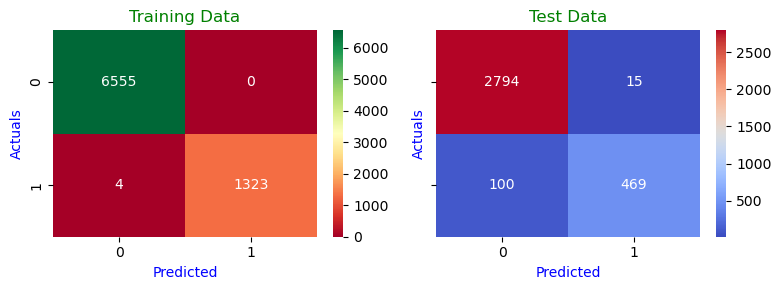

In [267]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**Measuring and Plotting AUC-ROC Curve**

AUC for the Training Data: 1.000
AUC for the Test Data: 0.991


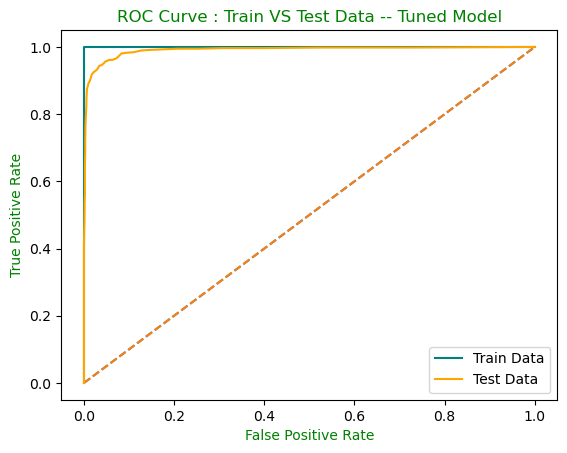

In [268]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = best_model_bagging.predict_proba(X_train)[:,1]
auc = metrics.roc_auc_score(y_train,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = best_model_bagging.predict_proba(X_test)[:,1]
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data -- Tuned Model",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 100% and AUC for Test data is 99%.
* The AUC & ROC curve shows that it is covering the same area for Train and Test data. Therefore, this is considered a           Generalized good model. 
* Also the AUC score is very high and is able to distinguish between Positive and Negative classes vey well.


**Comparison Table**

In [269]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                           'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                           'recall_Train':recall_score(y_train,ytrain_pred),
                           'recall_Test':recall_score(y_test,ytest_pred),
                           'precision_Train': precision_score(y_train, ytrain_pred),
                           'precision_Test': precision_score(y_test, ytest_pred),  
                           'f1_Train': f1_score(y_train,ytrain_pred),
                           'f1_Test': f1_score(y_test,ytest_pred),
                           'auc_Train':roc_auc_score(y_train,best_model_bagging.predict_proba(X_train)[:,1]),
                           'auc_Test':roc_auc_score(y_test,best_model_bagging.predict_proba(X_test)[:,1])},index=['Bagging Classifier Tuned'])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


**Observations**

* Accuracy is same for Base, Smote and Tuned model.
* AUC score is better for Tuned model.

## AdaBoost Classifier

In [270]:
from sklearn.ensemble import AdaBoostClassifier

In [271]:
ADB_model = AdaBoostClassifier(n_estimators=500,random_state=42)
ADB_model.fit(X_train,y_train)

AdaBoostClassifier(n_estimators=500, random_state=42)

**Accuracy of Train and Test data**

In [272]:
print("Accuracy on Train Data: ",ADB_model.score(X_train,y_train))
print("Accuracy on Test Data: ",ADB_model.score(X_test,y_test))

Accuracy on Train Data:  0.903577772139051
Accuracy on Test Data:  0.9011249259917111


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [273]:
ytrain_pred = ADB_model.predict(X_train)
ytest_pred = ADB_model.predict(X_test)

**Classification Report**

In [274]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.92      0.96      0.94      6555
           1       0.77      0.61      0.68      1327

    accuracy                           0.90      7882
   macro avg       0.85      0.79      0.81      7882
weighted avg       0.90      0.90      0.90      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.92      0.96      0.94      2809
           1       0.76      0.60      0.67       569

    accuracy                           0.90      3378
   macro avg       0.84      0.78      0.81      3378
weighted avg       0.90      0.90      0.90      3378



**Insights:**

**---------------------------------------------Test set-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 90%.
        * 90% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 60% and Recall for class 0(Non-churn) is 96%.
        * 60% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,60% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 96% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 76% and for class 0(Non-Churne) is 92%.
        * 76% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 92% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

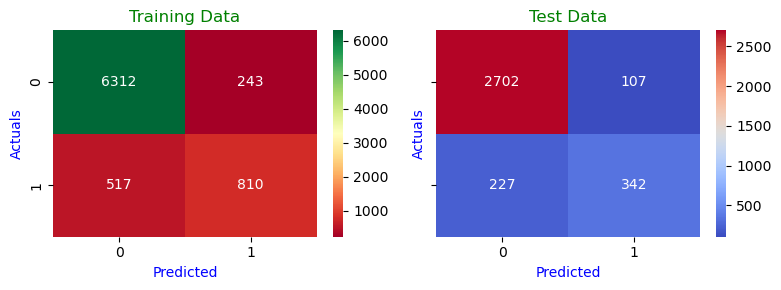

In [275]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**AUC - ROC Curve : Train Data**

AUC: 0.930


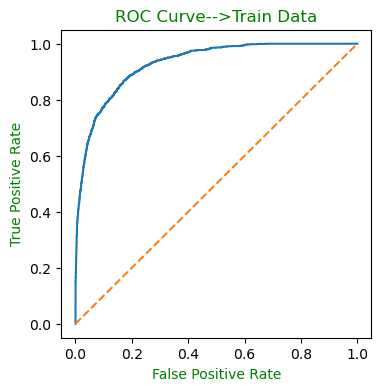

In [276]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = ADB_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_train,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Train Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**AUC - ROC Curve : Test Data**

AUC: 0.916


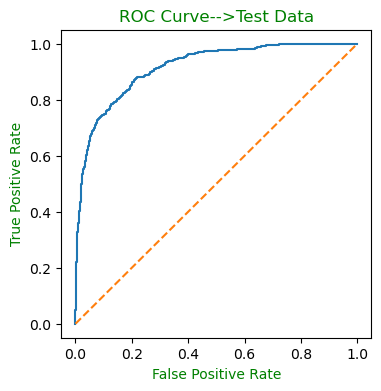

In [277]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = ADB_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_test,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_test,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**Observations:**

* AUC for Train data is 93% and AUC for Test data is 91%.
* The AUC & ROC curve shows that it is covering almost the same area for Train and Test data. Therefore, this is considered a           Generalized good model. 
* Also the AUC score is very high and is able to distinguish between Positive and Negative classes vey well.


**Comparison Table**

In [278]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                           'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                           'recall_Train':recall_score(y_train,ytrain_pred),
                           'recall_Test':recall_score(y_test,ytest_pred),
                           'precision_Train': precision_score(y_train, ytrain_pred),
                           'precision_Test': precision_score(y_test, ytest_pred),  
                           'f1_Train': f1_score(y_train,ytrain_pred),
                           'f1_Test': f1_score(y_test,ytest_pred),
                           'auc_Train':roc_auc_score(y_train,ADB_model.predict_proba(X_train)[:,1]),
                           'auc_Test':roc_auc_score(y_test,ADB_model.predict_proba(X_test)[:,1])},index=['Ada Boost Classifier'])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


**Feature Importance**

In [279]:
ADB_model.feature_importances_

array([0.176, 0.002, 0.046, 0.016, 0.004, 0.008, 0.012, 0.048, 0.006,
       0.01 , 0.034, 0.008, 0.044, 0.006, 0.066, 0.508, 0.006])

In [280]:
imp = pd.DataFrame(ADB_model.feature_importances_, columns=["Imp"], index=X_train.columns).sort_values(by="Imp", ascending=False)
imp

,Imp
cashback,0.508
Tenure,0.176
Day_Since_CC_connect,0.066
account_segment,0.048
CC_Contacted_LY,0.046
rev_growth_yoy,0.044
rev_per_month,0.034
Payment,0.016
Account_user_count,0.012
Marital_Status,0.010


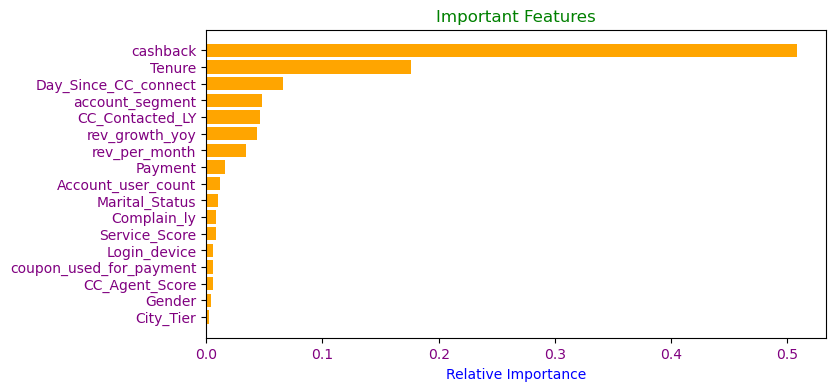

In [281]:
imp = ADB_model.feature_importances_
indices = np.argsort(imp)
feature_names = list(X_train.columns)

plt.figure(figsize=(8,4))
plt.barh(range(len(indices)), imp[indices], color='orange')
plt.title("Important Features",color='green')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices],color='purple')
plt.xticks(color='purple')
plt.xlabel("Relative Importance",color='blue')
plt.show()

* The 1st Five Important features for Ada Boost model are : cashback, Tenure, Day_since_CC_connect, account_segment and Cc_Contacted_LY.

In [282]:
ADB_rf = AdaBoostClassifier(estimator=RF_model,n_estimators=100,random_state=42)
ADB_rf.fit(X_train,y_train)

AdaBoostClassifier(estimator=RandomForestClassifier(random_state=42),
                   n_estimators=100, random_state=42)

In [283]:
print("Accuracy on Train Data: ",ADB_rf.score(X_train,y_train))
print("Accuracy on Test Data: ",ADB_rf.score(X_test,y_test))

Accuracy on Train Data:  1.0
Accuracy on Test Data:  0.970396684428656


In [284]:
ADB_dt = AdaBoostClassifier(estimator=dt_model,n_estimators=100,random_state=42)
ADB_dt.fit(X_train,y_train)

AdaBoostClassifier(estimator=DecisionTreeClassifier(random_state=42),
                   n_estimators=100, random_state=42)

In [285]:
print("Accuracy on Train Data: ",ADB_dt.score(X_train,y_train))
print("Accuracy on Test Data: ",ADB_dt.score(X_test,y_test))

Accuracy on Train Data:  1.0
Accuracy on Test Data:  0.9585553582001184


## Ada Boost on Smote Dataset

In [286]:
ADB_smote = AdaBoostClassifier(n_estimators=1000,random_state=42)
ADB_smote.fit(X_train_smote,y_train_smote)

AdaBoostClassifier(n_estimators=1000, random_state=42)

**Accuracy of the Training and Test data**

In [287]:
print("Accuracy on Train Data: ",ADB_smote.score(X_train_smote,y_train_smote))
print("Accuracy on Test Data: ",ADB_smote.score(X_test,y_test))

Accuracy on Train Data:  0.9242437450963299
Accuracy on Test Data:  0.8946121965660154


**validness of models (over fitting or under fitting):**

* There is not much defference between Accuracy of the Train data and Test data, hence our model is Neither Overfit nor Underfit.

**Predictions**

In [288]:
ytrain_pred = ADB_smote.predict(X_train_smote)
ytest_pred = ADB_smote.predict(X_test)

**Classification Report**

In [289]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train_smote,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.92      0.95      0.93      6555
           1       0.93      0.89      0.91      4916

    accuracy                           0.92     11471
   macro avg       0.93      0.92      0.92     11471
weighted avg       0.92      0.92      0.92     11471
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.93      0.95      0.94      2809
           1       0.71      0.64      0.67       569

    accuracy                           0.89      3378
   macro avg       0.82      0.79      0.80      3378
weighted avg       0.89      0.89      0.89      3378



**Insights:**

**---------------------------------------------Test set Smote data-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 89%.
        * 89% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 64% and Recall for class 0(Non-churn) is 95%.
        * 64% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,64% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 95% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 71% and for class 0(Non-Churne) is 93%.
        * 71% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 93% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

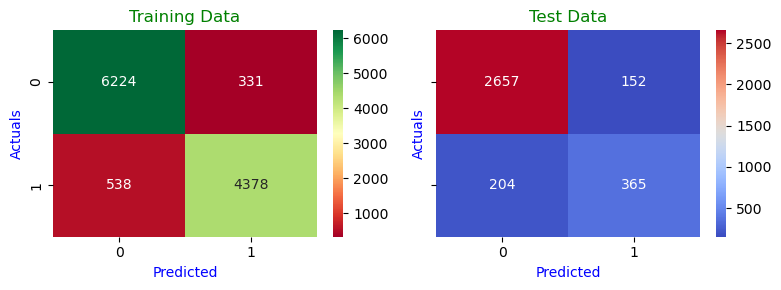

In [290]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train_smote,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**Measuring and Plotting AUC-ROC Curve**

AUC for the Training Data: 0.977
AUC for the Test Data: 0.912


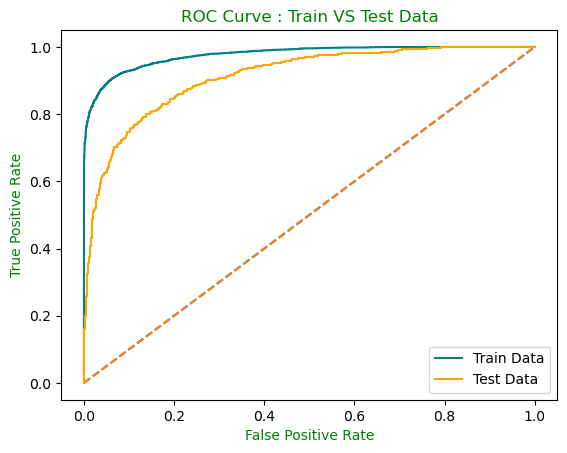

In [291]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = ADB_smote.predict_proba(X_train_smote)[:,1]
auc = metrics.roc_auc_score(y_train_smote,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train_smote,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = ADB_smote.predict_proba(X_test)[:,1]
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 97% and AUC for Test data is 91%.
* From the AUC values & ROC curve for the Train and Test data ,it shows that Test data covering a slightly less area as compared to the train data.
* But since AUC is greater than 90% so it is considered a Good Model.
* The AUC score is high and is able to distinguish between Positive and Negative classes very well.

**Comparison Table**

In [292]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train_smote,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train_smote,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train_smote, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train_smote,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train_smote,ADB_smote.predict_proba(X_train_smote)[:,1]),
                          'auc_Test':roc_auc_score(y_test,ADB_smote.predict_proba(X_test)[:,1])},index=['Ada Boost Classifier Smote' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


In [293]:
imp = pd.DataFrame(ADB_smote.feature_importances_, columns=["Imp"], index=X_train_smote.columns).sort_values(by="Imp", ascending=False)
imp

,Imp
rev_per_month,0.278
rev_growth_yoy,0.143
cashback,0.138
coupon_used_for_payment,0.095
Tenure,0.078
CC_Contacted_LY,0.057
Day_Since_CC_connect,0.041
Marital_Status,0.037
Service_Score,0.031
Account_user_count,0.028


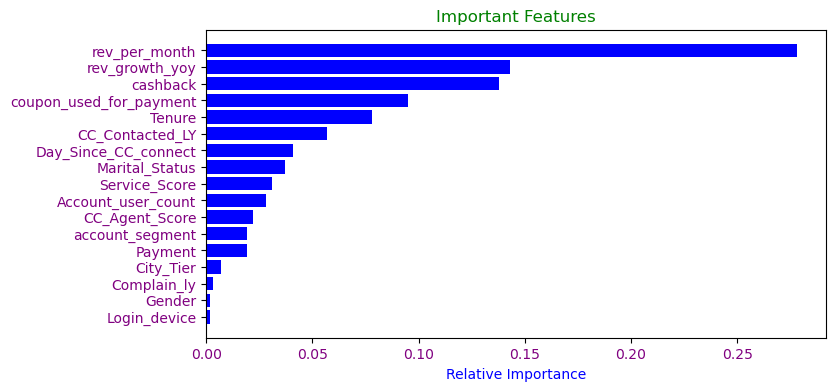

In [294]:
imp = ADB_smote.feature_importances_
indices = np.argsort(imp)
feature_names = list(X_train_smote.columns)

plt.figure(figsize=(8,4))
plt.barh(range(len(indices)), imp[indices], color='blue')
plt.title("Important Features",color='green')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices],color='purple')
plt.xticks(color='purple')
plt.xlabel("Relative Importance",color='blue')
plt.show()

In [295]:
ADB_rf_sm = AdaBoostClassifier(estimator=rf_smote,n_estimators=500,random_state=42)
ADB_rf_sm.fit(X_train_smote,y_train_smote)

AdaBoostClassifier(estimator=RandomForestClassifier(n_estimators=500,
                                                    random_state=42),
                   n_estimators=500, random_state=42)

In [296]:
print("Accuracy on Train Data: ",ADB_rf_sm.score(X_train_smote,y_train_smote))
print("Accuracy on Test Data: ",ADB_rf_sm.score(X_test,y_test))

Accuracy on Train Data:  1.0
Accuracy on Test Data:  0.9671403197158082


In [297]:
ADB_dt_sm = AdaBoostClassifier(estimator=dt_smote,n_estimators=1000,random_state=42)
ADB_dt_sm.fit(X_train_smote,y_train_smote)

AdaBoostClassifier(estimator=DecisionTreeClassifier(random_state=42),
                   n_estimators=1000, random_state=42)

In [298]:
print("Accuracy on Train Data: ",ADB_dt_sm.score(X_train_smote,y_train_smote))
print("Accuracy on Test Data: ",ADB_dt_sm.score(X_test,y_test))

Accuracy on Train Data:  1.0
Accuracy on Test Data:  0.9274718768502073


## GridSearchCV on ADA Boost:

In [299]:
Param_grid = { 'n_estimators' : [50,100,500,1000],
               'learning_rate' : [0.1,0.01,0.001,1.0],
               'algorithm' : ['SAMME', 'SAMME.R']
             }

In [300]:
grid_search = GridSearchCV(estimator=ADB_model,param_grid=Param_grid,cv=5)
grid_search.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=AdaBoostClassifier(n_estimators=500, random_state=42),
             param_grid={'algorithm': ['SAMME', 'SAMME.R'],
                         'learning_rate': [0.1, 0.01, 0.001, 1.0],
                         'n_estimators': [50, 100, 500, 1000]})

In [301]:
print(grid_search.best_params_,"\n")
print(grid_search.best_estimator_)

{'algorithm': 'SAMME.R', 'learning_rate': 1.0, 'n_estimators': 50} 

AdaBoostClassifier(random_state=42)


**Building Model on Best Parameter**

In [302]:
best_model_Adb = grid_search.best_estimator_
best_model_Adb.fit(X_train,y_train)

AdaBoostClassifier(random_state=42)

**Accuracy of Train and Test Data**

In [303]:
print("Accuracy on Train Data: ",best_model_Adb.score(X_train,y_train))
print("Accuracy on Test Data: ",best_model_Adb.score(X_test,y_test))

Accuracy on Train Data:  0.8981223039837605
Accuracy on Test Data:  0.8978685612788633


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [304]:
ytrain_pred = best_model_Adb.predict(X_train)
ytest_pred = best_model_Adb.predict(X_test)

**Classification Report**

In [305]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.92      0.96      0.94      6555
           1       0.75      0.59      0.66      1327

    accuracy                           0.90      7882
   macro avg       0.84      0.78      0.80      7882
weighted avg       0.89      0.90      0.89      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.92      0.96      0.94      2809
           1       0.75      0.59      0.66       569

    accuracy                           0.90      3378
   macro avg       0.84      0.78      0.80      3378
weighted avg       0.89      0.90      0.89      3378



**Insights:**

**---------------------------------------------Test set Tuned Model-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 90%.
        * 90% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 59% and Recall for class 0(Non-churn) is 96%.
        * 59% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,59% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 96% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 75% and for class 0(Non-Churne) is 92%.
        * 75% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 92% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

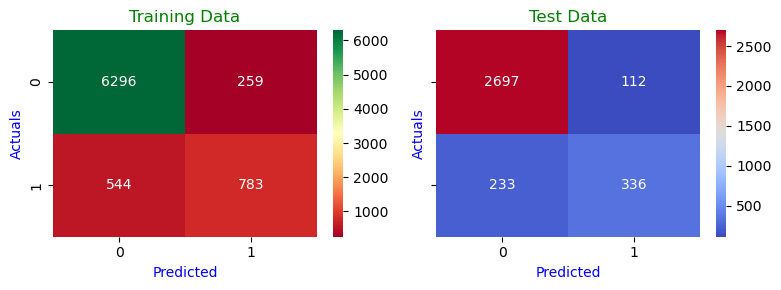

In [306]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**Measuring and Plotting AUC-ROC Curve**

AUC for the Training Data: 0.915
AUC for the Test Data: 0.911


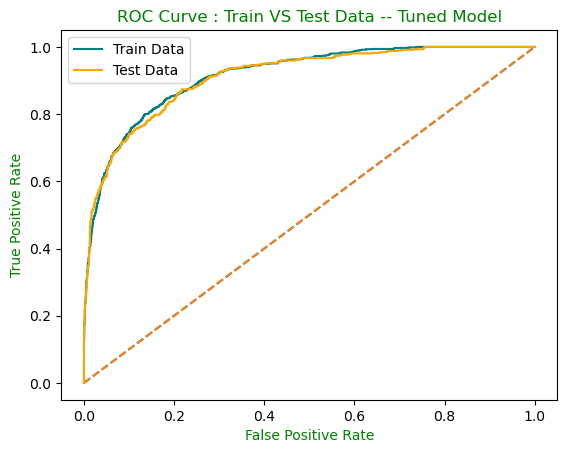

In [307]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = best_model_Adb.predict_proba(X_train)[:,1]
auc = metrics.roc_auc_score(y_train,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = best_model_Adb.predict_proba(X_test)[:,1]
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data -- Tuned Model",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 91% and AUC for Test data is 91%.
* The AUC & ROC curve shows that it is covering the same area for Train and Test data. Therefore, this is considered a           Generalized good model. 
* Also the AUC score is very high and is able to distinguish between Positive and Negative classes very well.


**Feature Importance**

In [308]:
best_model_Adb.feature_importances_

array([0.2 , 0.02, 0.04, 0.08, 0.02, 0.02, 0.04, 0.04, 0.04, 0.04, 0.06,
       0.04, 0.06, 0.02, 0.12, 0.14, 0.02])

In [309]:
imp = pd.DataFrame(best_model_Adb.feature_importances_, columns=["Imp"], index=X_train.columns).sort_values(by="Imp", ascending=False)
imp

,Imp
Tenure,0.20
cashback,0.14
Day_Since_CC_connect,0.12
Payment,0.08
rev_growth_yoy,0.06
rev_per_month,0.06
Marital_Status,0.04
Complain_ly,0.04
CC_Agent_Score,0.04
account_segment,0.04


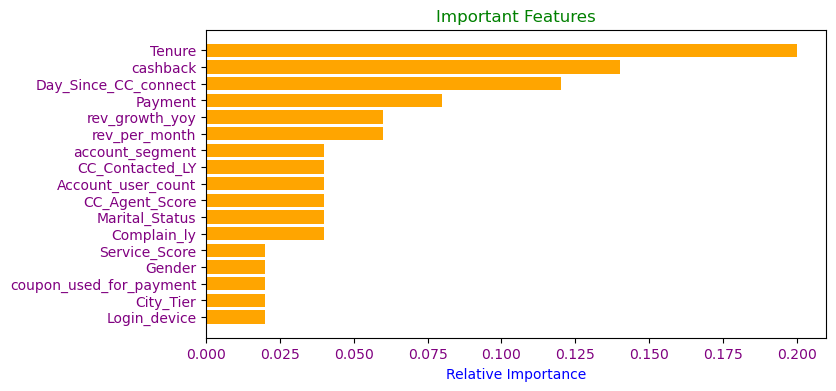

In [310]:
imp = best_model_Adb.feature_importances_
indices = np.argsort(imp)
feature_names = list(X_train.columns)

plt.figure(figsize=(8,4))
plt.barh(range(len(indices)), imp[indices], color='orange')
plt.title("Important Features",color='green')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices],color='purple')
plt.xlabel("Relative Importance",color='blue')
plt.xticks(color='purple')
plt.show()

* The 1st Five features of Adb Tuned Model are : Tenure, cashback, Day_since_CC_connect, payment, rev_growth_yoy and rev_per_month.

**Comparison Table**

In [311]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                           'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                           'recall_Train':recall_score(y_train,ytrain_pred),
                           'recall_Test':recall_score(y_test,ytest_pred),
                           'precision_Train': precision_score(y_train, ytrain_pred),
                           'precision_Test': precision_score(y_test, ytest_pred),  
                           'f1_Train': f1_score(y_train,ytrain_pred),
                           'f1_Test': f1_score(y_test,ytest_pred),
                           'auc_Train':roc_auc_score(y_train,best_model_Adb.predict_proba(X_train)[:,1]),
                           'auc_Test':roc_auc_score(y_test,best_model_Adb.predict_proba(X_test)[:,1])},index=['ADA Boost Tuned'])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


## Gradient Boost

In [312]:
from sklearn.ensemble import GradientBoostingClassifier

In [313]:
gbc_model=GradientBoostingClassifier(n_estimators=100,random_state=42)      # 1000 ---> 98%, 94%
gbc_model.fit(X_train, y_train)

GradientBoostingClassifier(random_state=42)

**Accuracy of Train and Test data**

In [314]:
print("Accuracy on Train Data: ",gbc_model.score(X_train,y_train))
print("Accuracy on Test Data: ",gbc_model.score(X_test,y_test))

Accuracy on Train Data:  0.9185485917279879
Accuracy on Test Data:  0.9094138543516874


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [315]:
ytrain_pred = gbc_model.predict(X_train)
ytest_pred = gbc_model.predict(X_test)

**Classification Report**

In [316]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.93      0.98      0.95      6555
           1       0.84      0.64      0.72      1327

    accuracy                           0.92      7882
   macro avg       0.89      0.81      0.84      7882
weighted avg       0.91      0.92      0.91      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.92      0.97      0.95      2809
           1       0.82      0.59      0.69       569

    accuracy                           0.91      3378
   macro avg       0.87      0.78      0.82      3378
weighted avg       0.90      0.91      0.90      3378



**Insights:**

**---------------------------------------------Test set-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 91%.
        * 91% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 59% and Recall for class 0(Non-churn) is 97%.
        * 59% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,59% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 97% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 82% and for class 0(Non-Churne) is 92%.
        * 82% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 92% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

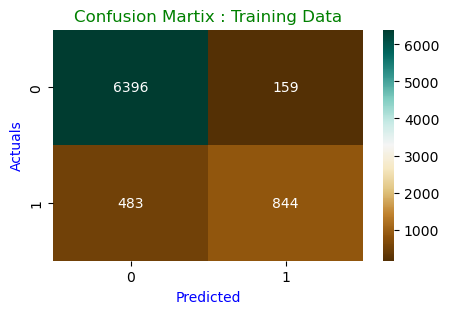

In [317]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Martix : Training Data",color='green');

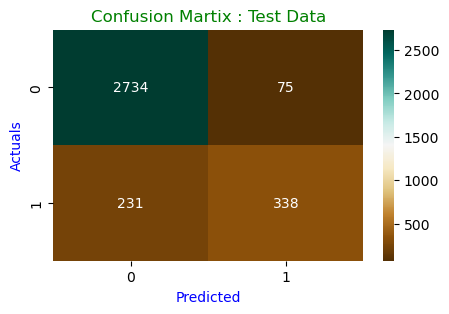

In [318]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Martix : Test Data",color='green');

**AUC - ROC Curve : Train Data**

AUC: 0.951


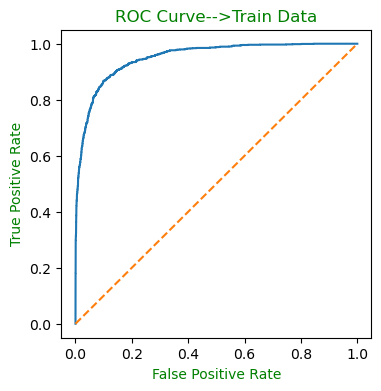

In [319]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = gbc_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_train,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Train Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**AUC - ROC : Test Data**

AUC: 0.936


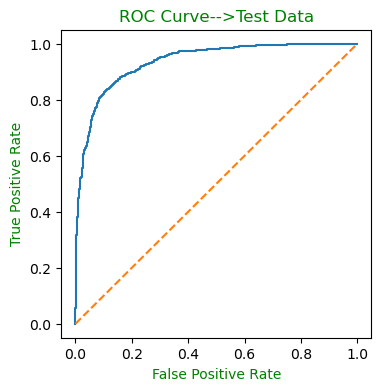

In [320]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = gbc_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_test,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_test,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**Observations:**

* AUC for Train data is 95% and AUC for Test data is 93%.
* The AUC score is very high and is able to distinguish between Positive and Negative classes vey well.
* From the AUC values & ROC curve for the Train and Test data ,it shows that Test data is covering a large area as compared   to the train data.

**Feature Importance**

In [321]:
gbc_model.feature_importances_

array([0.54552751, 0.01343083, 0.0223244 , 0.02672253, 0.00299848,
       0.0017366 , 0.01877563, 0.03201655, 0.04236156, 0.03291535,
       0.04386956, 0.11526341, 0.00697143, 0.00937975, 0.05119338,
       0.03106797, 0.00344505])

In [322]:
imp = pd.DataFrame(gbc_model.feature_importances_, columns=["Imp"], index=X_train.columns).sort_values(by="Imp", ascending=False)
imp

,Imp
Tenure,0.545528
Complain_ly,0.115263
Day_Since_CC_connect,0.051193
rev_per_month,0.043870
CC_Agent_Score,0.042362
Marital_Status,0.032915
account_segment,0.032017
cashback,0.031068
Payment,0.026723
CC_Contacted_LY,0.022324


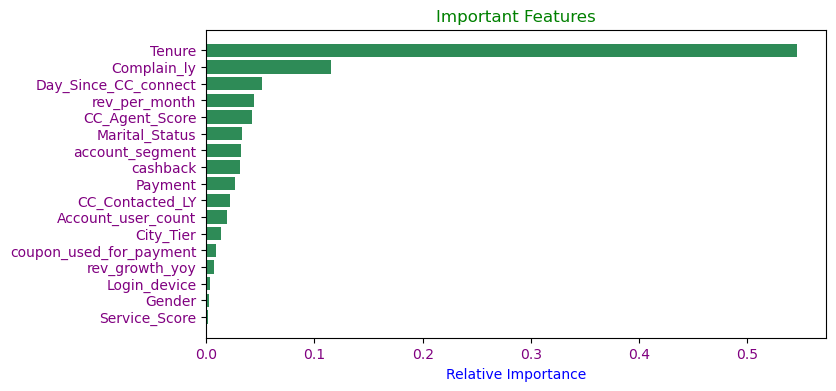

In [323]:
imp = gbc_model.feature_importances_
indices = np.argsort(imp)
feature_names = list(X_train.columns)

plt.figure(figsize=(8,4))
plt.barh(range(len(indices)), imp[indices], color='seagreen')
plt.title("Important Features",color='green')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices],color='purple')
plt.xticks(color='purple')
plt.xlabel("Relative Importance",color='blue')
plt.show()

* The 1st five important features for Gradient Boost model are: Tenure, Complain_ly, Day_since_CC_connect, CC_Agent_Score and rev_per_month.


**Comparison Table**

In [324]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                           'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                           'recall_Train':recall_score(y_train,ytrain_pred),
                           'recall_Test':recall_score(y_test,ytest_pred),
                           'precision_Train': precision_score(y_train, ytrain_pred),
                           'precision_Test': precision_score(y_test, ytest_pred),  
                           'f1_Train': f1_score(y_train,ytrain_pred),
                           'f1_Test': f1_score(y_test,ytest_pred),
                           'auc_Train':roc_auc_score(y_train,gbc_model.predict_proba(X_train)[:,1]),
                           'auc_Test':roc_auc_score(y_test,gbc_model.predict_proba(X_test)[:,1])},index=['Gradient Boost Classifier'])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


## Gradient Boosting on balanced (Smote) dataset

In [325]:
gbc_smote=GradientBoostingClassifier(n_estimators=100,random_state=42)    # 1000 --> 98%, 94%
gbc_smote.fit(X_train_smote, y_train_smote)                                # 1500 --> 99%, 94%

GradientBoostingClassifier(random_state=42)

**Accuracy of Train and Test data**

In [326]:
print("Accuracy on Train Data: ",gbc_smote.score(X_train_smote,y_train_smote))
print("Accuracy on Test Data: ",gbc_smote.score(X_test,y_test))

Accuracy on Train Data:  0.9158748147502397
Accuracy on Test Data:  0.9049733570159858


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [327]:
ytrain_pred = gbc_smote.predict(X_train_smote)
ytest_pred =gbc_smote.predict(X_test)

**Classification Report**

In [328]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train_smote,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.91      0.94      0.93      6555
           1       0.92      0.88      0.90      4916

    accuracy                           0.92     11471
   macro avg       0.92      0.91      0.91     11471
weighted avg       0.92      0.92      0.92     11471
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.94      0.94      0.94      2809
           1       0.72      0.72      0.72       569

    accuracy                           0.90      3378
   macro avg       0.83      0.83      0.83      3378
weighted avg       0.91      0.90      0.91      3378



**Insights:**

**---------------------------------------------Test set Smote Data-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 90%.
        * 90% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 72% and Recall for class 0(Non-churn) is 94%.
        * 72% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,72% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 94% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 72% and for class 0(Non-Churne) is 94%.
        * 72% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 94% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

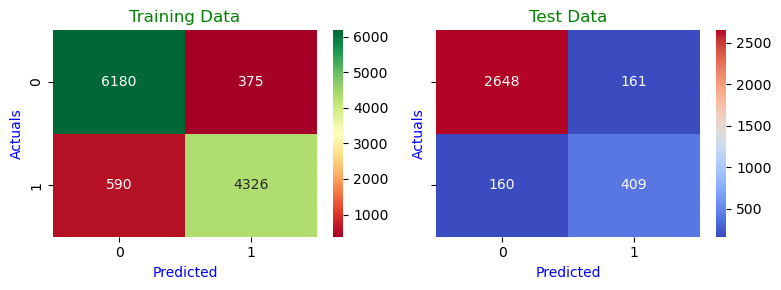

In [329]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train_smote,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**Measuring and Plotting AUC-ROC Curve**

AUC for the Training Data: 0.975
AUC for the Test Data: 0.931


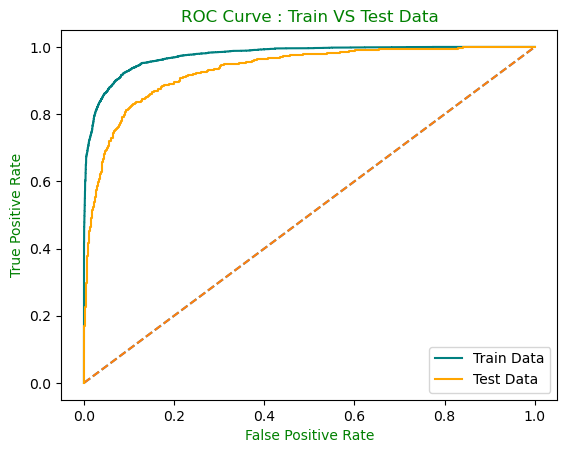

In [330]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = gbc_smote.predict_proba(X_train_smote)[:,1]
auc = metrics.roc_auc_score(y_train_smote,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train_smote,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = gbc_smote.predict_proba(X_test)[:,1]
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 97% and AUC for Test data is 93%.
* The AUC score is very high and is able to distinguish between Positive and Negative classes vey well.
* From the AUC values & ROC curve for the Train and Test data ,it shows that Test data is covering a slightly less area as compared to the train data.

**Comparison Table**

In [331]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train_smote,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train_smote,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train_smote, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train_smote,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train_smote,gbc_smote.predict_proba(X_train_smote)[:,1]),
                          'auc_Test':roc_auc_score(y_test,gbc_smote.predict_proba(X_test)[:,1])},index=['Gradient Boost Smote' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


## GridSearchCV on Gradient Boost

In [332]:
Param_grid = {'n_estimators':[50,100,150,200],'criterion' : ['friedman_mse', 'squared_error'],
              'loss' : ['log_loss', 'exponential'],'max_features' : ['sqrt', 'log2'],
               'max_depth':[3,5],'max_leaf_nodes':[2,5]}

In [333]:
grid_search = GridSearchCV(estimator=gbc_model,param_grid=Param_grid,cv=5)
grid_search.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=42),
             param_grid={'criterion': ['friedman_mse', 'squared_error'],
                         'loss': ['log_loss', 'exponential'],
                         'max_depth': [3, 5], 'max_features': ['sqrt', 'log2'],
                         'max_leaf_nodes': [2, 5],
                         'n_estimators': [50, 100, 150, 200]})

In [334]:
print(grid_search.best_params_,"\n")
print(grid_search.best_estimator_)

{'criterion': 'friedman_mse', 'loss': 'log_loss', 'max_depth': 5, 'max_features': 'sqrt', 'max_leaf_nodes': 5, 'n_estimators': 200} 

GradientBoostingClassifier(max_depth=5, max_features='sqrt', max_leaf_nodes=5,
                           n_estimators=200, random_state=42)


**Building Model on Best Parameter**

In [335]:
best_model_gdb = grid_search.best_estimator_
best_model_gdb.fit(X_train,y_train)

GradientBoostingClassifier(max_depth=5, max_features='sqrt', max_leaf_nodes=5,
                           n_estimators=200, random_state=42)

**Accuracy of Train and Test Data**

In [336]:
print("Accuracy on Train Data: ",best_model_gdb.score(X_train,y_train))
print("Accuracy on Test Data: ",best_model_gdb.score(X_test,y_test))

Accuracy on Train Data:  0.9196904339000254
Accuracy on Test Data:  0.9073416222616933


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [337]:
ytrain_pred = best_model_gdb.predict(X_train)
ytest_pred = best_model_gdb.predict(X_test)

**Classification Report**

In [338]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       0.93      0.98      0.95      6555
           1       0.85      0.64      0.73      1327

    accuracy                           0.92      7882
   macro avg       0.89      0.81      0.84      7882
weighted avg       0.92      0.92      0.91      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.92      0.97      0.95      2809
           1       0.81      0.59      0.68       569

    accuracy                           0.91      3378
   macro avg       0.86      0.78      0.81      3378
weighted avg       0.90      0.91      0.90      3378



**Insights:**

**---------------------------------------------Test set Tuned Model-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 91%.
        * 91% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 59% and Recall for class 0(Non-churn) is 97%.
        * 59% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,59% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 97% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 81% and for class 0(Non-Churne) is 92%.
        * 81% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 92% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

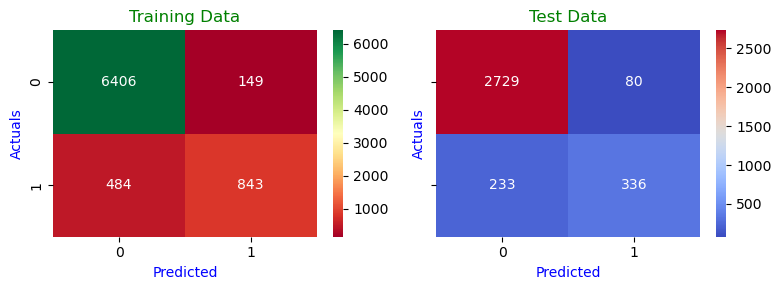

In [339]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**Measuring and Plotting AUC-ROC Curve**

AUC for the Training Data: 0.953
AUC for the Test Data: 0.937


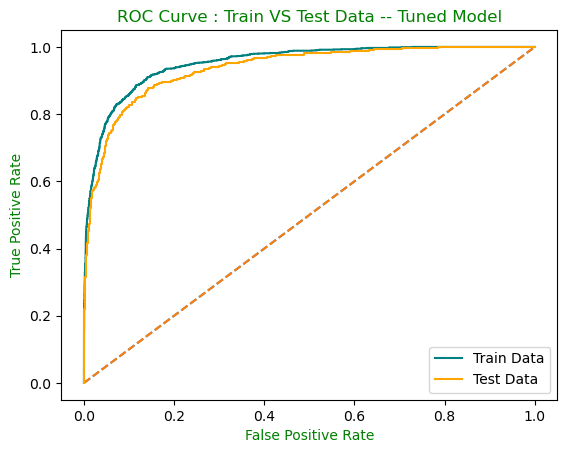

In [340]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = best_model_gdb.predict_proba(X_train)[:,1]
auc = metrics.roc_auc_score(y_train,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = best_model_gdb.predict_proba(X_test)[:,1]
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data -- Tuned Model",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 95% and AUC for Test data is 93%.
* The AUC & ROC curve shows that it is covering almost the same area for Train and Test data. Therefore, this is considered a           Generalized good model. 
* Also the AUC score is very high and is able to distinguish between Positive and Negative classes vey well.


**Feature Importance**

In [341]:
best_model_gdb.feature_importances_

array([0.49446372, 0.01315021, 0.02902173, 0.01909281, 0.00356889,
       0.00318891, 0.02175117, 0.02646559, 0.03648715, 0.04918213,
       0.05181907, 0.12225517, 0.01464923, 0.01420697, 0.05954062,
       0.03245515, 0.0087015 ])

In [342]:
imp = pd.DataFrame(best_model_gdb.feature_importances_, columns=["Imp"], index=X_train.columns).sort_values(by="Imp", ascending=False)
imp

,Imp
Tenure,0.494464
Complain_ly,0.122255
Day_Since_CC_connect,0.059541
rev_per_month,0.051819
Marital_Status,0.049182
CC_Agent_Score,0.036487
cashback,0.032455
CC_Contacted_LY,0.029022
account_segment,0.026466
Account_user_count,0.021751


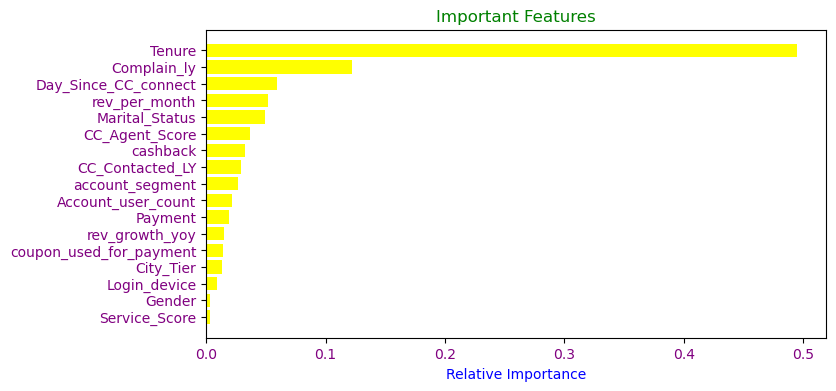

In [343]:
imp = best_model_gdb.feature_importances_
indices = np.argsort(imp)
feature_names = list(X_train.columns)

plt.figure(figsize=(8,4))
plt.barh(range(len(indices)), imp[indices], color='yellow')
plt.title("Important Features",color='green')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices],color='purple')
plt.xticks(color='purple')
plt.xlabel("Relative Importance",color='blue')
plt.show()

* The 1st five important features for Gradient Boost Tuned model are: Tenure, Complain_ly, Day_since_CC_connect, CC_Agent_Score and rev_per_month.

**Comparison Table**

In [344]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train,best_model_gdb.predict_proba(X_train)[:,1]),
                          'auc_Test':roc_auc_score(y_test,best_model_gdb.predict_proba(X_test)[:,1])},index=['Gradient Boost Tuned' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


## XGBoost Classifier

In [345]:
# import xgboost
from xgboost import XGBClassifier

In [346]:
xgb = XGBClassifier(eval_metric="logloss",random_state=42)
xgb.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=42, ...)

**Accuracy of Train and Test data**

In [347]:
print("Accuracy on Train Data: ",xgb.score(X_train,y_train))
print("Accuracy on Test Data: ",xgb.score(X_test,y_test))

Accuracy on Train Data:  0.9998731286475514
Accuracy on Test Data:  0.9706927175843695


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [348]:
ytrain_pred = xgb.predict(X_train)
ytest_pred = xgb.predict(X_test)

**Classification Report**

In [349]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6555
           1       1.00      1.00      1.00      1327

    accuracy                           1.00      7882
   macro avg       1.00      1.00      1.00      7882
weighted avg       1.00      1.00      1.00      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.97      0.99      0.98      2809
           1       0.95      0.87      0.91       569

    accuracy                           0.97      3378
   macro avg       0.96      0.93      0.95      3378
weighted avg       0.97      0.97      0.97      3378



**Insights:**

**---------------------------------------------Test set -------------------------------------------**

**Accuracy**

        * The Accuracy of model is 97%.
        * 97% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 87% and Recall for class 0(Non-churn) is 99%.
        * 87% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,87% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 99% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 95% and for class 0(Non-Churne) is 97%.
        * 95% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 97% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

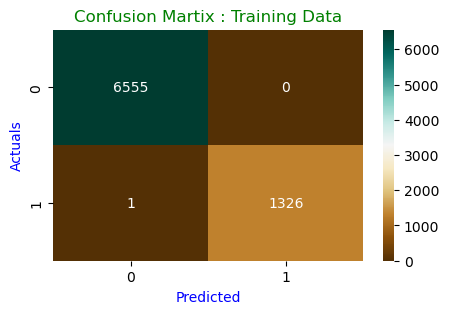

In [350]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Martix : Training Data",color='green');

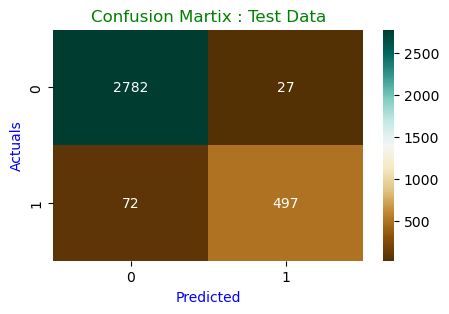

In [351]:
plt.figure(figsize=(5,3))
sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)),annot=True,fmt='.5g'
            ,cmap='BrBG');
plt.xlabel('Predicted',color='blue');
plt.ylabel('Actuals',color='blue');
plt.title("Confusion Martix : Test Data",color='green');

**AUC - ROC Curve : Train Data**

AUC: 1.000


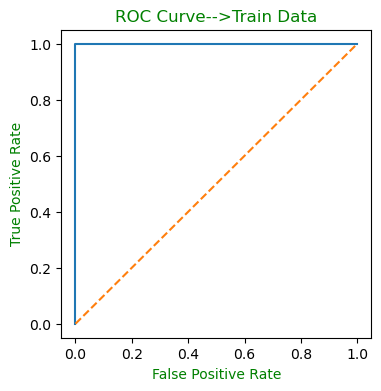

In [352]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = xgb.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_train,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Train Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**AUC - ROC Curve : Test Data**

AUC: 0.992


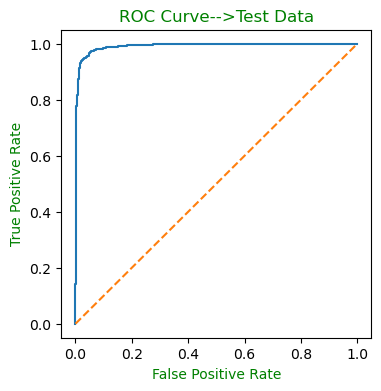

In [353]:
plt.figure(figsize=(4,4))
# predict probabilities
probs = xgb.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:,1]
# calculate AUC
auc = roc_auc_score(y_test,probs)
print("AUC: %.3f" %auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_test,probs)
plt.plot(train_fpr,train_tpr);
plt.plot([0,1], [0,1], linestyle='--')
# plot the roc curve for the model
plt.title("ROC Curve-->Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
plt.show()

**Observations:**

* AUC for Train data is 100% and AUC for Test data is 99%.
* The AUC & ROC curve shows that it is covering the same area for Train and Test data. Therefore, this is considered a           Generalized good model. 
* Also the AUC score is very high and is able to distinguish between Positive and Negative classes vey well.


**Feature Importance**

In [354]:
xgb.feature_importances_

array([0.20740688, 0.05950452, 0.03531083, 0.04403748, 0.03155109,
       0.02386374, 0.04119461, 0.05794951, 0.05865047, 0.0559273 ,
       0.04447987, 0.12398039, 0.03419699, 0.03380003, 0.05299526,
       0.0294379 , 0.06571319], dtype=float32)

In [355]:
imp = pd.DataFrame(xgb.feature_importances_, columns=["Imp"], index=X_train.columns).sort_values(by="Imp", ascending=False)
imp

,Imp
Tenure,0.207407
Complain_ly,0.123980
Login_device,0.065713
City_Tier,0.059505
CC_Agent_Score,0.058650
account_segment,0.057950
Marital_Status,0.055927
Day_Since_CC_connect,0.052995
rev_per_month,0.044480
Payment,0.044037


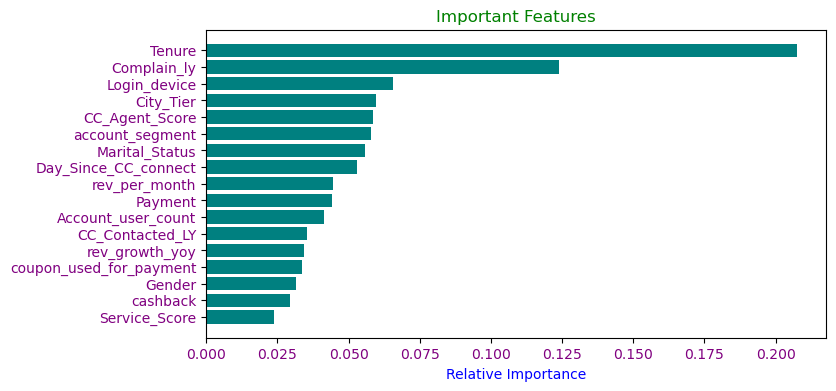

In [356]:
imp = xgb.feature_importances_
indices = np.argsort(imp)
feature_names = list(X_train.columns)

plt.figure(figsize=(8,4))
plt.barh(range(len(indices)), imp[indices], color='teal')
plt.title("Important Features",color='green')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices],color='purple')
plt.xticks(color='purple')
plt.xlabel("Relative Importance",color='blue')
plt.show()

* The 1st five important feature of XGBoost model are: Tenure, Complain_ly, Login_device, City_Tier and CC_Agent_Score.

**Comparison Table**

In [357]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                           'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                           'recall_Train':recall_score(y_train,ytrain_pred),
                           'recall_Test':recall_score(y_test,ytest_pred),
                           'precision_Train': precision_score(y_train, ytrain_pred),
                           'precision_Test': precision_score(y_test, ytest_pred),  
                           'f1_Train': f1_score(y_train,ytrain_pred),
                           'f1_Test': f1_score(y_test,ytest_pred),
                           'auc_Train':roc_auc_score(y_train,xgb.predict_proba(X_train)[:,1]),
                           'auc_Test':roc_auc_score(y_test,xgb.predict_proba(X_test)[:,1])},index=['XGBoost Classifier'])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


## XGBoost on Smote dataset

In [358]:
xgb_smote = XGBClassifier(random_state=42, eval_metric="logloss")
xgb_smote.fit(X_train_smote, y_train_smote)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=42, ...)

**Accuracy of Train and Test set**

In [359]:
print("Accuracy on Train Data: ",xgb_smote.score(X_train_smote,y_train_smote))
print("Accuracy on Test Data: ",xgb_smote.score(X_test,y_test))

Accuracy on Train Data:  0.9993897654955975
Accuracy on Test Data:  0.9650680876258141


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [360]:
ytrain_pred = xgb_smote.predict(X_train_smote)
ytest_pred = xgb_smote.predict(X_test)

**Classification Report**

In [361]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train_smote,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6555
           1       1.00      1.00      1.00      4916

    accuracy                           1.00     11471
   macro avg       1.00      1.00      1.00     11471
weighted avg       1.00      1.00      1.00     11471
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.97      0.99      0.98      2809
           1       0.92      0.87      0.89       569

    accuracy                           0.97      3378
   macro avg       0.95      0.93      0.94      3378
weighted avg       0.96      0.97      0.96      3378



**Insights:**

**---------------------------------------------Test set Smote data -------------------------------------------**

**Accuracy**

        * The Accuracy of model is 97%.
        * 97% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 87% and Recall for class 0(Non-churn) is 99%.
        * 87% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,87% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 99% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 92% and for class 0(Non-Churne) is 97%.
        * 92% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 97% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

AUC for the Training Data: 1.000
AUC for the Test Data: 0.989


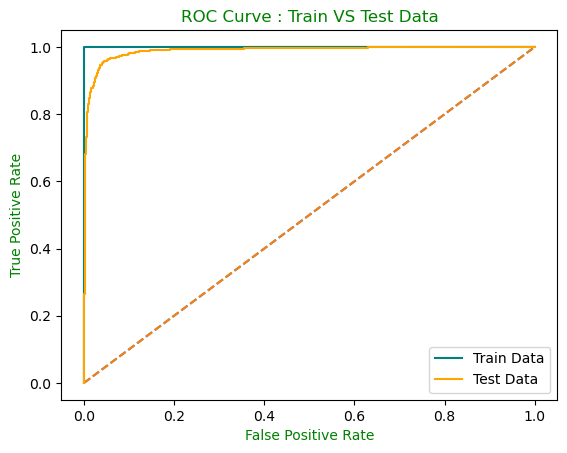

In [362]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = xgb_smote.predict_proba(X_train_smote)[:,1]
auc = metrics.roc_auc_score(y_train_smote,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train_smote,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = xgb_smote.predict_proba(X_test)[:,1]
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Feature Importance**

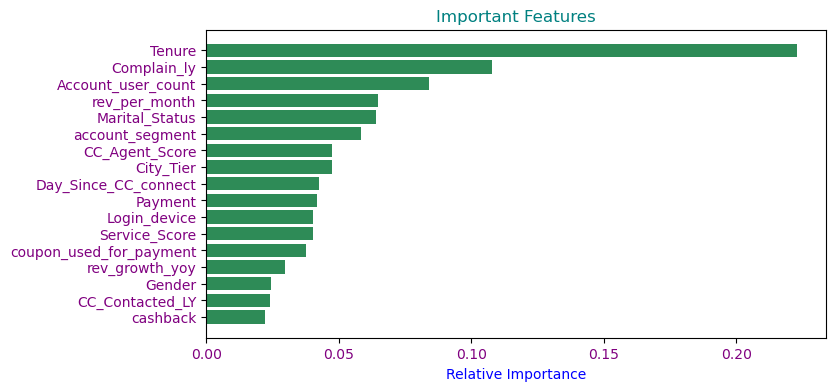

In [363]:
imp = xgb_smote.feature_importances_
indices = np.argsort(imp)
feature_names = list(X_train_smote.columns)

plt.figure(figsize=(8,4))
plt.barh(range(len(indices)), imp[indices], color='seagreen')
plt.title("Important Features",color='teal')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices],color='purple')
plt.xticks(color='purple')
plt.xlabel("Relative Importance",color='blue')
plt.show()

**Comparison Table**

In [364]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train_smote,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train_smote,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train_smote, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train_smote,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train_smote,xgb_smote.predict_proba(X_train_smote)[:,1]),
                          'auc_Test':roc_auc_score(y_test,xgb_smote.predict_proba(X_test)[:,1])},index=['XGBoost Classifier Smote' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


## Applying GridsearchCV on XGBoost

In [365]:
param_grid = {
               "n_estimators": [50,100,200],  # np.arange(10, 100, 10),
               "scale_pos_weight": [5],  # [0, 1, 2, 5],
               "subsample": [0.5,1],  # [0.5, 0.7, 0.9, 1],
               "learning_rate": [0.01,0.2,0.2],  # [0.01, 0.1, 0.2, 0.05],
               "gamma": [1,3],  # [0, 1, 3],
               "colsample_bytree": [0.9,1],  # [0.5, 0.7, 0.9, 1],
               "colsample_bylevel": [0.5,1],  # [0.5, 0.7, 0.9, 1],
            }

In [366]:
grid_search = GridSearchCV(estimator=xgb,param_grid=param_grid,cv=5)
grid_search.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False,
                                     eval_metric='logloss', feature_types=None,
                                     gamma=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=42, ...),
             param_grid={'colsample_bylevel': [0.5, 1],
                         'colsample_bytree': [0.9, 1], 'gamma': [1, 3],
                         'learning_rate': [0.01, 0.2, 0.2],
                         'n_estimators': [50, 100, 200],
                         'scale_pos_weight': [5], 'subsample': [0.5, 1]})

In [367]:
print(grid_search.best_params_,"\n")
print(grid_search.best_estimator_)

{'colsample_bylevel': 1, 'colsample_bytree': 1, 'gamma': 1, 'learning_rate': 0.2, 'n_estimators': 200, 'scale_pos_weight': 5, 'subsample': 0.5} 

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=1, colsample_bynode=None, colsample_bytree=1,
              device=None, early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=1,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)


**Building Model on Best Parameter**

In [368]:
best_model_xgb = grid_search.best_estimator_
best_model_xgb.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=1, colsample_bynode=None, colsample_bytree=1,
              device=None, early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=1,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

**Accuracy of Train and Test Data**

In [369]:
print("Accuracy on Train Data: ",best_model_xgb.score(X_train,y_train))
print("Accuracy on Test Data: ",best_model_xgb.score(X_test,y_test))

Accuracy on Train Data:  0.9969550875412332
Accuracy on Test Data:  0.9600355239786856


**validness of models (over fitting or under fitting):**

* The Accuracy of both the Train data and Test data are almost same ,Hence our model is Neither Overfit nor Underfit.

**Predictions**

In [370]:
ytrain_pred = best_model_xgb.predict(X_train)
ytest_pred = best_model_xgb.predict(X_test)

**Classification Report**

In [371]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6555
           1       0.98      1.00      0.99      1327

    accuracy                           1.00      7882
   macro avg       0.99      1.00      0.99      7882
weighted avg       1.00      1.00      1.00      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.98      0.97      0.98      2809
           1       0.87      0.90      0.88       569

    accuracy                           0.96      3378
   macro avg       0.92      0.93      0.93      3378
weighted avg       0.96      0.96      0.96      3378



**Insights:**

**---------------------------------------------Test set Tuned Model-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 96%.
        * 96% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 90% and Recall for class 0(Non-churn) is 97%.
        * 90% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,90% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 97% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 81% and for class 0(Non-Churne) is 92%.
        * 87% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 98% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

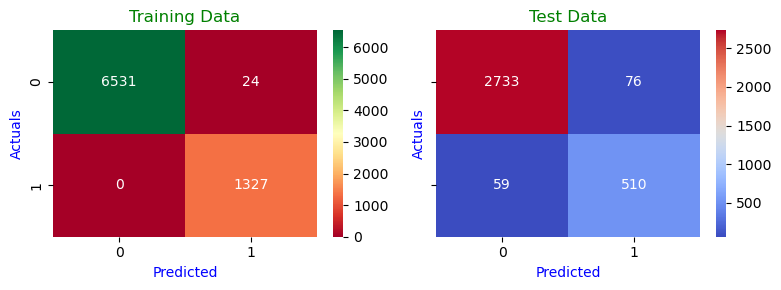

In [372]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**Measuring and Plotting AUC-ROC Curve**

AUC for the Training Data: 1.000
AUC for the Test Data: 0.988


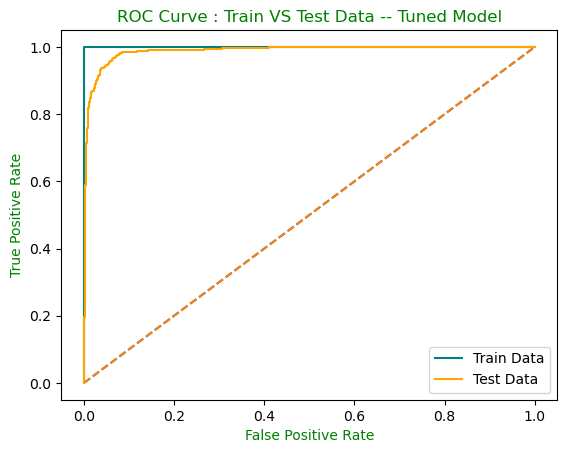

In [373]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = best_model_xgb.predict_proba(X_train)[:,1]
auc = metrics.roc_auc_score(y_train,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = best_model_xgb.predict_proba(X_test)[:,1]
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data -- Tuned Model",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 100% and AUC for Test data is 98%.
* The AUC & ROC curve shows that it is covering almost the same area for Train and Test data. Therefore, this is considered a           Generalized good model. 
* Also the AUC score is very high and is able to distinguish between Positive and Negative classes vey well.


**Feature Importance**

In [374]:
best_model_xgb.feature_importances_

array([0.17208844, 0.06297094, 0.03762107, 0.05235911, 0.04604728,
       0.03125243, 0.04682122, 0.06659883, 0.06490295, 0.05380808,
       0.05067134, 0.09543322, 0.03862417, 0.03740928, 0.05202527,
       0.04051917, 0.05084715], dtype=float32)

In [375]:
imp = pd.DataFrame(best_model_xgb.feature_importances_, columns=["Imp"], index=X_train.columns).sort_values(by="Imp", ascending=False)
imp

,Imp
Tenure,0.172088
Complain_ly,0.095433
account_segment,0.066599
CC_Agent_Score,0.064903
City_Tier,0.062971
Marital_Status,0.053808
Payment,0.052359
Day_Since_CC_connect,0.052025
Login_device,0.050847
rev_per_month,0.050671


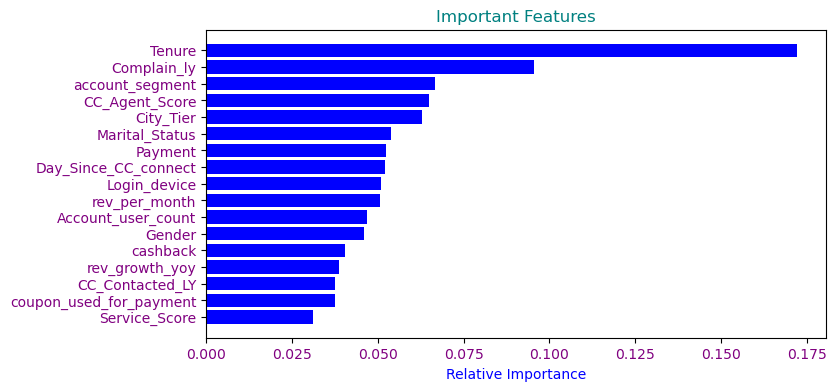

In [376]:
imp = best_model_xgb.feature_importances_
indices = np.argsort(imp)
feature_names = list(X_train.columns)

plt.figure(figsize=(8,4))
plt.barh(range(len(indices)), imp[indices], color='blue')
plt.title("Important Features",color='teal')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices],color='purple')
plt.xticks(color='purple')
plt.xlabel("Relative Importance",color='blue')
plt.show()

* The 1st five Important features of XGBoost Tuned model are: Tenure, Complain_ly, CC_Agent_Score, account_segment and City_Tier.

**Comparison Table**

In [377]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                          'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                          'recall_Train':recall_score(y_train,ytrain_pred),
                          'recall_Test':recall_score(y_test,ytest_pred),
                          'precision_Train': precision_score(y_train, ytrain_pred),
                          'precision_Test': precision_score(y_test, ytest_pred),  
                          'f1_Train': f1_score(y_train,ytrain_pred),
                          'f1_Test': f1_score(y_test,ytest_pred),
                          'auc_Train':roc_auc_score(y_train,best_model_xgb.predict_proba(X_train)[:,1]),
                          'auc_Test':roc_auc_score(y_test,best_model_xgb.predict_proba(X_test)[:,1])},index=['XGBoost Classifier Tuned' ])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


## LightGBM Classifier

In [320]:
# !pip install lightgbm

In [13]:
import lightgbm

In [14]:
lgbm_model = lightgbm.LGBMClassifier(n_estimators=4000,random_state=42)
lgbm_model.fit(X_train,y_train)

[LightGBM] [Info] Number of positive: 1327, number of negative: 6555
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003155 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 416
[LightGBM] [Info] Number of data points in the train set: 7882, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.168358 -> initscore=-1.597307
[LightGBM] [Info] Start training from score -1.597307
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LGBMClassifier(n_estimators=4000, random_state=42)

**Accuracy of Train and Test set**

In [15]:
print("Accuracy on Train Data: ",lgbm_model.score(X_train,y_train))
print("Accuracy on Test Data: ",lgbm_model.score(X_test,y_test))

Accuracy on Train Data:  1.0
Accuracy on Test Data:  0.9834221432800474


**Predictions**

In [16]:
ytrain_pred = lgbm_model.predict(X_train)
ytest_pred = lgbm_model.predict(X_test)

**Classification Report**

In [17]:
print('Classification Report of the Training data:\n\n',metrics.classification_report(y_train,ytrain_pred),'\n')
print('Classification Report of the Test data:\n\n',metrics.classification_report(y_test,ytest_pred))

Classification Report of the Training data:

               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6555
           1       1.00      1.00      1.00      1327

    accuracy                           1.00      7882
   macro avg       1.00      1.00      1.00      7882
weighted avg       1.00      1.00      1.00      7882
 

Classification Report of the Test data:

               precision    recall  f1-score   support

           0       0.99      0.99      0.99      2809
           1       0.97      0.93      0.95       569

    accuracy                           0.98      3378
   macro avg       0.98      0.96      0.97      3378
weighted avg       0.98      0.98      0.98      3378



**Insights:**

**---------------------------------------------Test set-------------------------------------------**

**Accuracy**

        * The Accuracy of model is 98%.
        * 98% of the Data points are identified correctly
        
**Recall : Represents the correctness of the Model in a particular class.**

        * Recall for class 1(Churn) is 93% and Recall for class 0(Non-churn) is 99%.
        * 93% of those Churned were correctly identified as Churned by the model.
        * Out of all the customers who are Churned,93% of them are identified correctly as Churned.
        * Out of all the customers who are not Churned, 99% of them are identified correctly as Not-Churned.
**Precision**

        * Precision for class 1(Churn) is 97% and for class 0(Non-Churne) is 99%.
        * 97% of the customers predicted are actually Churned Out of all the Customers that are predicted as Churned.
        * 99% of the Customers predicted are actually Not Churned out of all the customers predicted as not Churned.

**Confusion Matrix**

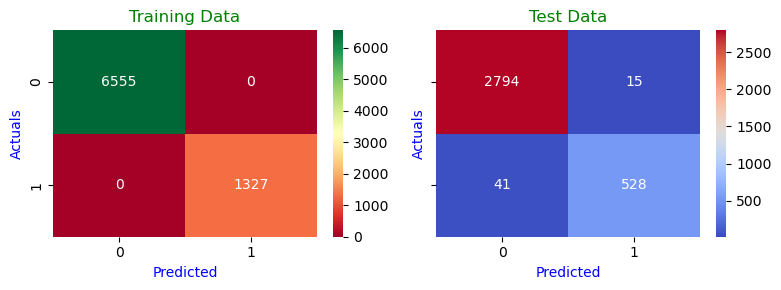

In [18]:
fig,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)
fig.set_size_inches(8,3)
#Plotting confusion matrix for the different models for the Training Data     # plasma  RdYlGn
plt_0 = sns.heatmap((metrics.confusion_matrix(y_train,ytrain_pred)), annot=True, fmt='.5g',cmap='RdYlGn',ax=a[0][0])
a[0][0].set_title('Training Data',color='green')
a[0][0].set_xlabel('Predicted',color='blue')
a[0][0].set_ylabel('Actuals',color='blue')

#Plotting confusion matrix for the different models for the Test Data
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_pred)), annot=True,fmt='.5g',cmap='coolwarm',ax=a[0][1]);
a[0][1].set_title('Test Data',color='green');
a[0][1].set_xlabel('Predicted',color='blue')
a[0][1].set_ylabel('Actuals',color='blue')

fig.tight_layout()
plt.show()

**AUC - ROC Curve**

AUC for the Training Data: 1.000
AUC for the Test Data: 0.996


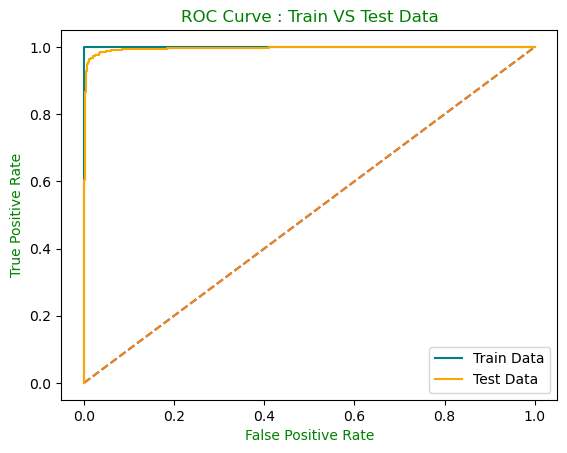

In [19]:
# AUC and ROC for the training data ~ Repaeter Operator Curve
# calculate AUC
probs = lgbm_model.predict_proba(X_train)[:,1]
auc = metrics.roc_auc_score(y_train,probs)
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr,label = 'Train Data',color='teal')

# AUC and ROC for the test data

# calculate AUC
probs1 = lgbm_model.predict_proba(X_test)[:,1]
auc = metrics.roc_auc_score(y_test,probs1)
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,probs1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, label='Test Data',color='orange')

plt.title("ROC Curve : Train VS Test Data",color='green')
plt.xlabel('False Positive Rate',color='green')
plt.ylabel('True Positive Rate' ,color='green')
# show the plot
plt.legend(loc='best')
plt.show()

**Observations:**

* AUC for Train data is 100% and AUC for Test data is 99%.
* The AUC & ROC curve shows that it is covering the same area for Train and Test data. Therefore, this is considered a           Generalized good model. 
* Also the AUC score is very high and is able to distinguish between Positive and Negative classes vey well.


**Feature Importance**

In [20]:
lgbm_model.feature_importances_

array([ 5793,  1609,  6579,  3277,  1620,  1421,  1779,  1689,  4353,
        2068,  3836,  1480,  5277,  1670,  5146, 10795,  1219])

**Feature Importance**

In [21]:
imp = pd.DataFrame(lgbm_model.feature_importances_, columns=["Imp"], index=X_train.columns).sort_values(by="Imp", ascending=False)
imp

,Imp
cashback,10795
CC_Contacted_LY,6579
Tenure,5793
rev_growth_yoy,5277
Day_Since_CC_connect,5146
CC_Agent_Score,4353
rev_per_month,3836
Payment,3277
Marital_Status,2068
Account_user_count,1779


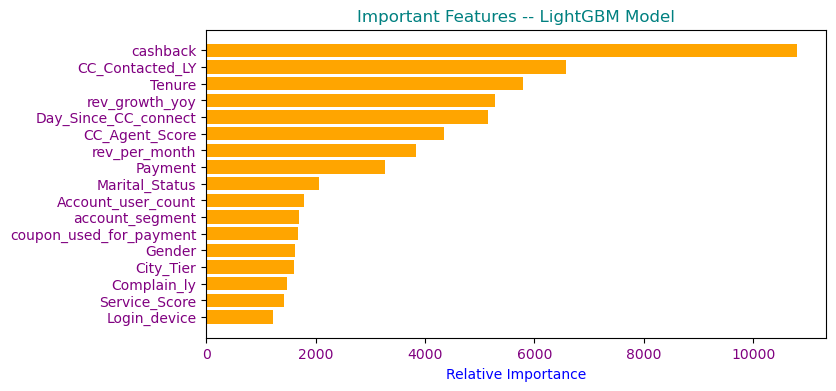

In [22]:
imp = lgbm_model.feature_importances_
indices = np.argsort(imp)
feature_names = list(X_train.columns)

plt.figure(figsize=(8,4))
plt.barh(range(len(indices)), imp[indices], color='orange')
plt.title("Important Features -- LightGBM Model",color='teal')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices],color='purple')
plt.xticks(color='purple')
plt.xlabel("Relative Importance",color='blue')
plt.show()

* The 1st five Important features of LightGBM Model are: cashback, CC_Contacted_LY, Tenure, rev_growth_yoy and Day_Since_CC_connect.

**Comparison Table**

In [388]:
resultsDf = pd.DataFrame({'Train_Accuracy': accuracy_score(y_train,ytrain_pred),
                           'Test_Accuracy': accuracy_score(y_test,ytest_pred),
                           'recall_Train':recall_score(y_train,ytrain_pred),
                           'recall_Test':recall_score(y_test,ytest_pred),
                           'precision_Train': precision_score(y_train, ytrain_pred),
                           'precision_Test': precision_score(y_test, ytest_pred),  
                           'f1_Train': f1_score(y_train,ytrain_pred),
                           'f1_Test': f1_score(y_test,ytest_pred),
                           'auc_Train':roc_auc_score(y_train,lgbm_model.predict_proba(X_train)[:,1]),
                           'auc_Test':roc_auc_score(y_test,lgbm_model.predict_proba(X_test)[:,1])},index=['LightGBM Classifier'])
Metrices_table = pd.concat([Metrices_table,resultsDf],axis=0)
Metrices_table

,Train_Accuracy,Test_Accuracy,recall_Train,recall_Test,precision_Train,precision_Test,f1_Train,f1_Test,auc_Train,auc_Test
Logistic Regression,0.882263,0.887507,0.449133,0.465729,0.751576,0.777126,0.562264,0.582418,0.869680,0.866379
Logistic Regression Smote,0.813617,0.815571,0.787836,0.771529,0.779589,0.471030,0.783691,0.584943,0.876621,0.865381
Logistic Regression Tuned,0.881883,0.889580,0.435569,0.455185,0.760526,0.804348,0.553905,0.581369,0.869088,0.865858
LDA,0.876300,0.880403,0.400904,0.402460,0.747191,0.781570,0.521824,0.531323,0.858450,0.857028
LDA Smote,0.800540,0.796033,0.781530,0.778559,0.759889,0.440358,0.770558,0.562540,0.872858,0.863309
LDA Tuned,0.876808,0.880403,0.399397,0.400703,0.752841,0.783505,0.521910,0.530233,0.858415,0.856971
Support Vector Classifier,0.882898,0.887211,0.403165,0.413005,0.803303,0.833333,0.536879,0.552291,0.691590,0.698137
SVC Smote,0.817278,0.816459,0.798820,0.780316,0.780095,0.472843,0.789347,0.588859,0.814971,0.802049
SVC Tuned,0.934027,0.912966,0.662396,0.590510,0.924290,0.846348,0.771730,0.695652,0.825706,0.784397
KNN_3,0.983634,0.955299,0.937453,0.841828,0.964341,0.887037,0.950707,0.863841,0.997923,0.968652


## ---------------------------------------------Model Comparison-------------------------------------------------------

**Comparing the Models built by Plotting the ROC-AUC Curve for Test data on Base model and Tuned Model.**

### Base Models

AUC Score Base Models : 

AUC for Logistic Regression Test Data:  0.8663791566274861
AUC for Linear Discriminant Analysis Test Data:  0.8570280938559901
AUC for Support Vector Classifier Test Data is 0.6981366696677326
AUC for K-Nearest Neighbor Test Data:  0.9519242379972483
AUC for Naive bayes Test Data :  0.8185696114860531
AUC for Decision Tree Test Data :  0.9146050762018394
AUC for Random Forest Test Data :  0.9919562465862614
AUC for Bagging Test Data :  0.9830149888539284
AUC for Ada Boost Classifier Test Data :  0.916467968574523
AUC for Gradient Boost Classifier Test Data :  0.9363463284283946
AUC for XGBoost Classifier Test Data :  0.9920535361795283
AUC for LightGBM Classifier Test Data :  0.9959000726387253


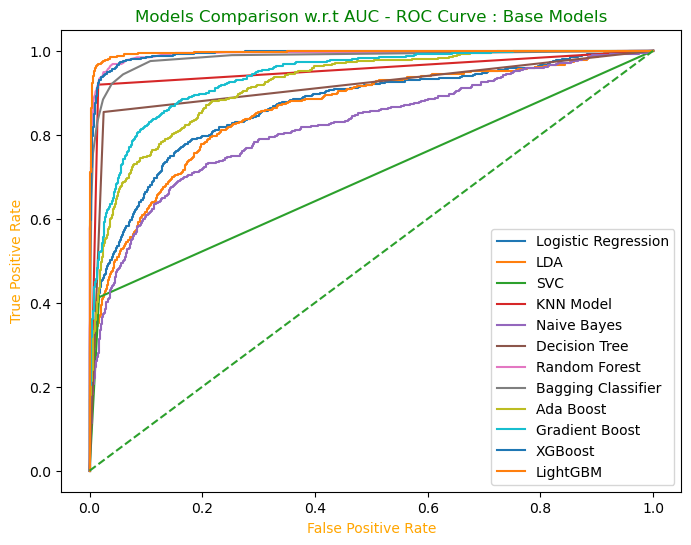

In [391]:
model_names={lgt_model:'Logistic Regression',lda_model: 'LDA', svc_model:'SVC',knn_1:'KNN Model',NB_model:'Naive Bayes',
             dt_model:'Decision Tree',RF_model:'Random Forest',bgcl:'Bagging Classifier',ADB_model:'Ada Boost',
             gbc_model:'Gradient Boost',xgb:'XGBoost',lgbm_model:'LightGBM'}

print("AUC Score Base Models : \n")

lr_test_auc = roc_auc_score(y_test,lgt_model.predict_proba(X_test)[:,1])
print('AUC for Logistic Regression Test Data: ',lr_test_auc)
lda_test_auc=roc_auc_score(y_test,lda_model.predict_proba(X_test)[:,1])
print('AUC for Linear Discriminant Analysis Test Data: ',lda_test_auc)
svc_test_auc=roc_auc_score(y_test,svc_model.predict(X_test))
print('AUC for Support Vector Classifier Test Data is',svc_test_auc)
knn_test_auc =roc_auc_score(y_test,knn_1.predict_proba(X_test)[:,1])
print('AUC for K-Nearest Neighbor Test Data: ',knn_test_auc)
nb_test_auc=roc_auc_score(y_test,NB_model.predict_proba(X_test)[:,1])
print('AUC for Naive bayes Test Data : ',nb_test_auc)
dt_test_auc=roc_auc_score(y_test_us,dt_model.predict_proba(X_test_us)[:,1])
print('AUC for Decision Tree Test Data : ',dt_test_auc)
rf_test_auc=roc_auc_score(y_test,RF_model.predict_proba(X_test)[:,1])
print('AUC for Random Forest Test Data : ',rf_test_auc)
bgcl_test_auc=roc_auc_score(y_test,bgcl.predict_proba(X_test)[:,1])
print('AUC for Bagging Test Data : ',bgcl_test_auc)
adb_test_auc=roc_auc_score(y_test,ADB_model.predict_proba(X_test)[:,1])
print('AUC for Ada Boost Classifier Test Data : ',adb_test_auc)
gbc_test_auc=roc_auc_score(y_test,gbc_model.predict_proba(X_test)[:,1])
print('AUC for Gradient Boost Classifier Test Data : ',gbc_test_auc)
xgb_test_auc=roc_auc_score(y_test,xgb.predict_proba(X_test)[:,1])
print('AUC for XGBoost Classifier Test Data : ',xgb_test_auc)
lgbm_test_auc=roc_auc_score(y_test,lgbm_model.predict_proba(X_test)[:,1])
print('AUC for LightGBM Classifier Test Data : ',lgbm_test_auc)

plt.figure(figsize=(8,6))

fpr_lr, tpr_lr, thresholds = roc_curve(y_test,lgt_model.predict_proba(X_test)[:,1])
plt.plot(fpr_lr, tpr_lr)
fpr_lda, tpr_lda, thresholds = roc_curve(y_test, lda_model.predict_proba(X_test)[:,1])
plt.plot(fpr_lda, tpr_lda)
fpr_svc, tpr_svc, thresholds = roc_curve(y_test, svc_model.predict(X_test))
plt.plot(fpr_svc, tpr_svc)
fpr_knn, tpr_knn, thresholds = roc_curve(y_test, knn_1.predict_proba(X_test)[:,1])
plt.plot(fpr_knn, tpr_knn)
fpr_nb, tpr_nb, thresholds = roc_curve(y_test, NB_model.predict_proba(X_test)[:,1])
plt.plot(fpr_nb, tpr_nb)
fpr_dt, tpr_dt, thresholds = roc_curve(y_test_us, dt_model.predict_proba(X_test_us)[:,1])
plt.plot(fpr_dt, tpr_dt)
fpr_rf, tpr_rf, thresholds = roc_curve(y_test, RF_model.predict_proba(X_test)[:,1])
plt.plot(fpr_rf, tpr_rf)
fpr_bgcl, tpr_bgcl, thresholds = roc_curve(y_test, bgcl.predict_proba(X_test)[:,1])
plt.plot(fpr_bgcl, tpr_bgcl)
fpr_adb, tpr_adb, thresholds = roc_curve(y_test, ADB_model.predict_proba(X_test)[:,1])
plt.plot(fpr_adb, tpr_adb)
fpr_gdb, tpr_gdb, thresholds = roc_curve(y_test, gbc_model.predict_proba(X_test)[:,1])
plt.plot(fpr_gdb, tpr_gdb)
fpr_xgb, tpr_xgb, thresholds = roc_curve(y_test, xgb.predict_proba(X_test)[:,1])
plt.plot(fpr_xgb, tpr_xgb)
fpr_lgbm, tpr_lgbm, thresholds = roc_curve(y_test, lgbm_model.predict_proba(X_test)[:,1])
plt.plot(fpr_lgbm, tpr_lgbm)
         
plt.plot([0, 1], [0, 1], linestyle='--')

plt.title('Models Comparison w.r.t AUC - ROC Curve : Base Models',color='green')
plt.xlabel('False Positive Rate',color='orange')
plt.ylabel('True Positive Rate',color='orange')
plt.legend(model_names.values())
plt.show()


**Interpretations**

* Comparing the AUC Score we can say that Random Forest, XGBoost and LightGBM Models are performing Better having a High AUC score of 99% on Test data.
* These Models are able to Seperate between the Churn and non-churn Classses Very well.
* These models can be considered a Good Generalized models.

**Tuned Model**

AUC Score Tuned Models : 

AUC for Logistic Regression Tuned Model:  0.8658579847227184
AUC for Linear Discriminant Analysis Tuned Model:  0.8569705334535429
AUC for Support Vector Classifier Tuned Model is 0.784396876472248
AUC for K-Nearest Neighbor Tuned Model:  0.9732256536703202
AUC for Decision Tree Tuned Model :  0.9198677862582048
AUC for Random Forest Tuned Model :  0.9762444465160628
AUC for Bagging Tuned Model :  0.9906824098538405
AUC for Ada Boost Classifier Tuned Model :  0.9113863860889021
AUC for Gradient Boost Classifier Tuned Model :  0.9366028476132142
AUC for XGBoost Classifier Tuned Model :  0.9879767581105422


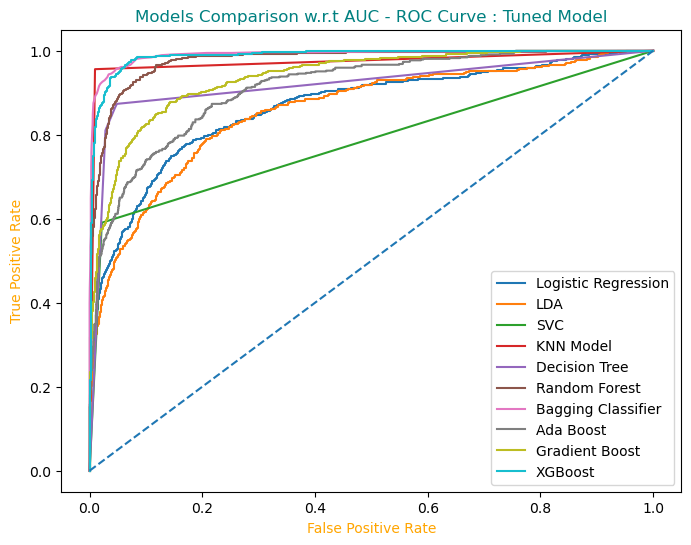

In [392]:
model_names={best_model_lgt:'Logistic Regression',best_model_lda: 'LDA', best_model_svc:'SVC',best_model_knn:'KNN Model',
             best_model_dt:'Decision Tree',best_modelRF:'Random Forest',best_model_bagging:'Bagging Classifier',
             best_model_Adb:'Ada Boost',best_model_gdb:'Gradient Boost',best_model_xgb:'XGBoost'}

print("AUC Score Tuned Models : \n")

lr_test_auc = roc_auc_score(y_test,best_model_lgt.predict_proba(X_test)[:,1])
print('AUC for Logistic Regression Tuned Model: ',lr_test_auc)
lda_test_auc=roc_auc_score(y_test,best_model_lda.predict_proba(X_test)[:,1])
print('AUC for Linear Discriminant Analysis Tuned Model: ',lda_test_auc)
svc_test_auc=roc_auc_score(y_test,best_model_svc.predict(X_test))
print('AUC for Support Vector Classifier Tuned Model is',svc_test_auc)
knn_test_auc =roc_auc_score(y_test,best_model_knn.predict_proba(X_test)[:,1])
print('AUC for K-Nearest Neighbor Tuned Model: ',knn_test_auc)
dt_test_auc=roc_auc_score(y_test_us,best_model_dt.predict_proba(X_test_us)[:,1])
print('AUC for Decision Tree Tuned Model : ',dt_test_auc)
rf_test_auc=roc_auc_score(y_test,best_modelRF.predict_proba(X_test)[:,1])
print('AUC for Random Forest Tuned Model : ',rf_test_auc)
bgcl_test_auc=roc_auc_score(y_test,best_model_bagging.predict_proba(X_test)[:,1])
print('AUC for Bagging Tuned Model : ',bgcl_test_auc)
adb_test_auc=roc_auc_score(y_test,best_model_Adb.predict_proba(X_test)[:,1])
print('AUC for Ada Boost Classifier Tuned Model : ',adb_test_auc)
gbc_test_auc=roc_auc_score(y_test,best_model_gdb.predict_proba(X_test)[:,1])
print('AUC for Gradient Boost Classifier Tuned Model : ',gbc_test_auc)
xgb_test_auc=roc_auc_score(y_test,best_model_xgb.predict_proba(X_test)[:,1])
print('AUC for XGBoost Classifier Tuned Model : ',xgb_test_auc)


plt.figure(figsize=(8,6))

fpr_lr, tpr_lr, thresholds = roc_curve(y_test,best_model_lgt.predict_proba(X_test)[:,1])
plt.plot(fpr_lr, tpr_lr)
fpr_lda, tpr_lda, thresholds = roc_curve(y_test, best_model_lda.predict_proba(X_test)[:,1])
plt.plot(fpr_lda, tpr_lda)
fpr_svc, tpr_svc, thresholds = roc_curve(y_test, best_model_svc.predict(X_test))
plt.plot(fpr_svc, tpr_svc)
fpr_knn, tpr_knn, thresholds = roc_curve(y_test, best_model_knn.predict_proba(X_test)[:,1])
plt.plot(fpr_knn, tpr_knn)
fpr_dt, tpr_dt, thresholds = roc_curve(y_test_us, best_model_dt.predict_proba(X_test_us)[:,1])
plt.plot(fpr_dt, tpr_dt)
fpr_rf, tpr_rf, thresholds = roc_curve(y_test, best_modelRF.predict_proba(X_test)[:,1])
plt.plot(fpr_rf, tpr_rf)
fpr_bgcl, tpr_bgcl, thresholds = roc_curve(y_test, best_model_bagging.predict_proba(X_test)[:,1])
plt.plot(fpr_bgcl, tpr_bgcl)
fpr_adb, tpr_adb, thresholds = roc_curve(y_test, best_model_Adb.predict_proba(X_test)[:,1])
plt.plot(fpr_adb, tpr_adb)
fpr_gdb, tpr_gdb, thresholds = roc_curve(y_test, best_model_gdb.predict_proba(X_test)[:,1])
plt.plot(fpr_gdb, tpr_gdb)
fpr_xgb, tpr_xgb, thresholds = roc_curve(y_test, best_model_xgb.predict_proba(X_test)[:,1])
plt.plot(fpr_xgb, tpr_xgb)

         
plt.plot([0, 1], [0, 1], linestyle='--')

plt.title('Models Comparison w.r.t AUC - ROC Curve : Tuned Model',color='teal')
plt.xlabel('False Positive Rate',color='orange')
plt.ylabel('True Positive Rate',color='orange')
plt.legend(model_names.values())
plt.show()


**Interpretations**

* Optimized Tuned Bagging Model is performing better with highest AUC score of 99%.
* Optimized XGBoost model is also performing better with 2nd highest AUC score of 98%.
* Other models like Random Forest and KNN models are having a Good AUC Score of 97%.
* So we can say that these Models are able to Seperate between the Churn and non-churn Classses Very well.
* These models can be considered a Good Generalized models.

###  Interpretation of the most optimum model and its implication on the business.


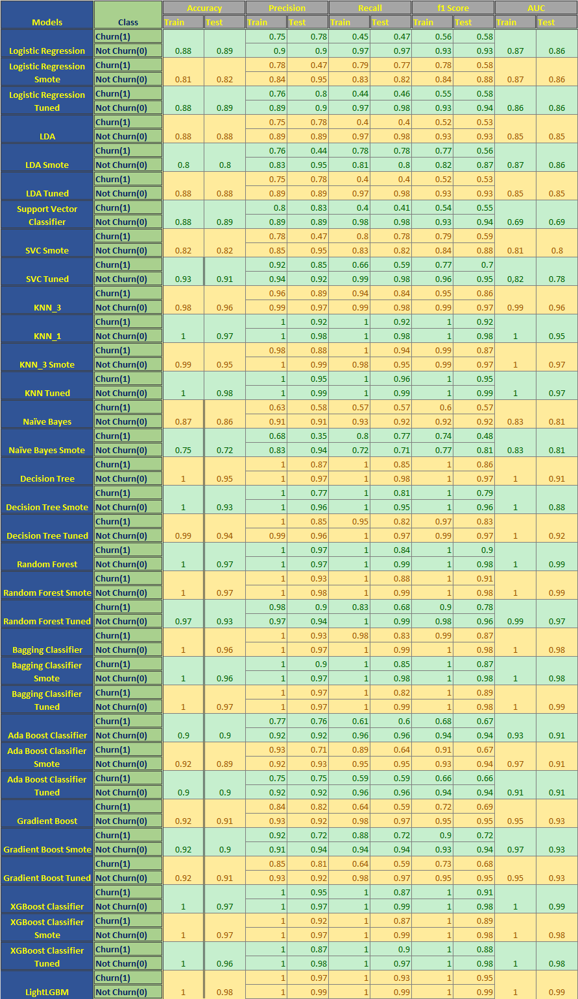

**Interpretations**

* Amomg all Built models, LightGBM model is giving Highest Accuracy of 98% on Test data and Highest AUC score of 99%.
* So, LightGBM is the most Optimal model in my case.
* Also, the Recall value is Good for LightGBM model and KNN models.
* Random Forest, Bagging and XGBoost models can be considered 2nd most Optimal Models with Highest AUC Score of 99% and Accuracy of 97%.
* KNN Tuned model LightGBM models are performing better with Highest Accuracy of 98% on Test data.
* Also, XGBoost, Bagging, Random Forest and KNN models can be a good Generalized models with good Accuracy.
* In terms of Precision and Recall, KNN model is showing a good trade-off between Precision and Recall.
* If we look at the Recall Value KNN Tuned and LightGBM model is able to identify maximum numbers of True Positives Correctly in both the classes.

**Business Insights, Implications and Recommendations**

* The 1st five Important features of LightGBM Model are: cashback, CC_Contacted_LY, Tenure, rev_growth_yoy and Day_Since_CC_connect.
* These 5 features are Contributing most towards the Accuracy of the LightGBM Model.
* Since these 5 features are contributing most towards the Accuracy, the business should ensure that these features should not contain any Anomalies, Null values or any kind of unwanted characters as a part of these columns in the future.
* Also, we should make sure these 5 features are made compulsory for model building and accurate data are captured.
* The business can make use of this model to identify customers who may Churn in future.

In [455]:
# lgbm_tuned = lightgbm.LGBMClassifier(learning_rate=0.04,max_depth=18,n_estimators=3000,subsample=0.7,random_state=42,colsample_bytree=0.7,min_data_in_leaf =55,reg_alpha=1.7,
                                    reg_lambda=1.11)
# lgbm_tuned.fit(X_train,y_train)

[LightGBM] [Warning] min_data_in_leaf is set=55, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=55
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] min_data_in_leaf is set=55, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=55
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 1327, number of negative: 6555
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002714 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 416
[LightGBM] [Info] Number of data points in the train set: 7882, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.168358 -> initscore=-1.597307
[LightGBM] [Info] Start training from score -1.597307
[Light

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

LGBMClassifier(colsample_bytree=0.7, learning_rate=0.04, max_depth=18,
               min_data_in_leaf=55, n_estimators=3000, random_state=42,
               reg_alpha=1.7, reg_lambda=1.11, subsample=0.7)

In [457]:
# print("Accuracy on Train Data: ",lgbm_tuned.score(X_train,y_train))
# print("Accuracy on Test Data: ",lgbm_tuned.score(X_test,y_test))

[LightGBM] [Warning] min_data_in_leaf is set=55, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=55
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Accuracy on Train Data:  0.995686374016747
[LightGBM] [Warning] min_data_in_leaf is set=55, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=55
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Accuracy on Test Data:  0.9588513913558319
